In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
!pip install catboost
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from lightgbm import LGBMClassifier
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from IPython.display import display
sns.set_theme(style="whitegrid", font_scale=1.0)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
import joblib
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Load Data

In [ ]:
# Main datasets
df_train = pd.read_csv('/content/drive/MyDrive/home_credit_data/application_train.csv')
df_test = pd.read_csv('/content/drive/MyDrive/home_credit_data/application_test.csv')

In [ ]:
# Supporting datasets
bureau = pd.read_csv('/content/drive/MyDrive/home_credit_data/bureau.csv')
bureau_balance = pd.read_csv('/content/drive/MyDrive/home_credit_data/bureau_balance.csv')
previous_application = pd.read_csv('/content/drive/MyDrive/home_credit_data/previous_application.csv')
POS_CASH_balance = pd.read_csv('/content/drive/MyDrive/home_credit_data/POS_CASH_balance.csv')
credit_card_balance = pd.read_csv('/content/drive/MyDrive/home_credit_data/credit_card_balance.csv')
installments_payments = pd.read_csv('/content/drive/MyDrive/home_credit_data/installments_payments.csv')

# Column description file
columns_description = pd.read_csv('/content/drive/MyDrive/home_credit_data/HomeCredit_columns_description.csv',
                                  encoding='ISO-8859-1')

In [ ]:
print("Dataset shape:", df_train.shape)
df_train

Dataset shape: (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [ ]:
df_train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


## Supporting dataset overview

In [ ]:
bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


In [ ]:
bureau_balance

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


In [ ]:
previous_application

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


In [ ]:
POS_CASH_balance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


In [ ]:
credit_card_balance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,...,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,...,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


In [ ]:
installments_payments

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


In [ ]:
columns_description

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
214,217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
215,218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
216,219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
217,220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


# **2. EDA**

## 2.1 Overview

In [ ]:
# show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# 1. Missing Values Analysis in training data
print(f"Total missing values: {df_train.isnull().sum().sum()}")
print("\nMissing values per column:")
missing_data = df_train.isnull().sum()
missing_percent = (missing_data / len(df_train)) * 100
missing_df_train = pd.DataFrame({
    'Missing Count': missing_data,
    'Missing Percentage': missing_percent
}).sort_values('Missing Count', ascending=False)

missing_df_train[missing_df_train['Missing Count'] > 0]

Total missing values: 9152465

Missing values per column:


,Missing Count,Missing Percentage
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
COMMONAREA_MEDI,214865,69.872297
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953
LIVINGAPARTMENTS_MODE,210199,68.354953


In [ ]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

In [ ]:
#. Duplicate Records Analysis
duplicate_count = df_train.duplicated().sum()
print(f"Total duplicate rows: {duplicate_count}")
print(f"Percentage of duplicates: {(duplicate_count / len(df_train)) * 100:.2f}%")

if duplicate_count > 0:
    print("\nFirst few duplicate rows:")
    print(df_train[df_train.duplicated()].head())

Total duplicate rows: 0
Percentage of duplicates: 0.00%


In [ ]:
# 3. Data Check single value columns
print("\nColumns with a single unique value:")
single_value_cols = [col for col in df_train.columns if df_train[col].nunique() == 1]
if single_value_cols:
    for col in single_value_cols:
        print(f"{col}: {df_train[col].unique()[0]}")
else:
    print("None")


Columns with a single unique value:
None


Numerical columns: ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUA

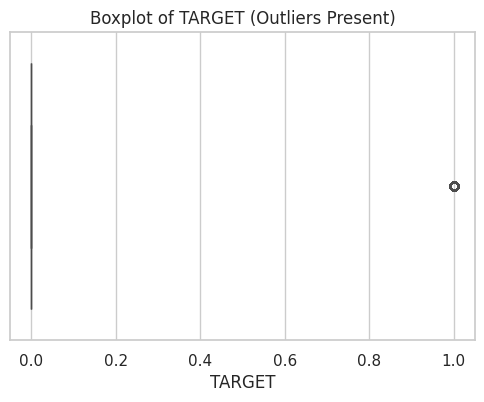


CNT_CHILDREN:
  Range: 0.00 to 19.00
  IQR bounds: -1.50 to 2.50
  Outliers: 4272 (1.39%)


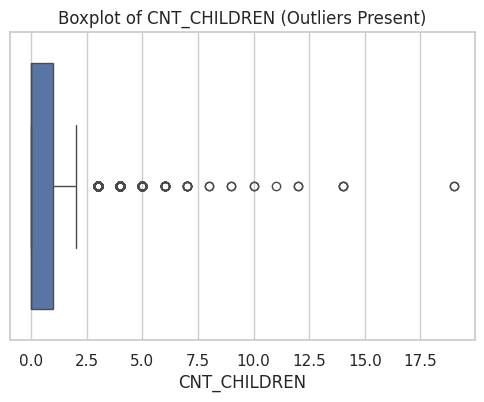


AMT_INCOME_TOTAL:
  Range: 25650.00 to 117000000.00
  IQR bounds: -22500.00 to 337500.00
  Outliers: 14035 (4.56%)


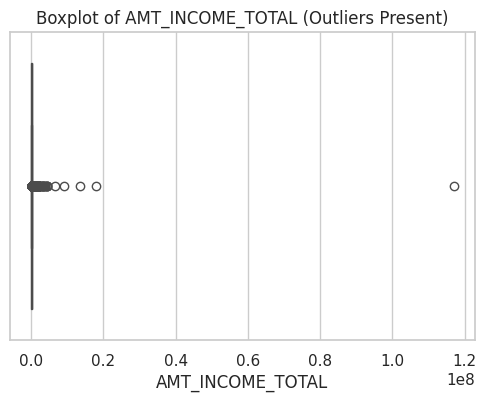


AMT_CREDIT:
  Range: 45000.00 to 4050000.00
  IQR bounds: -537975.00 to 1616625.00
  Outliers: 6562 (2.13%)


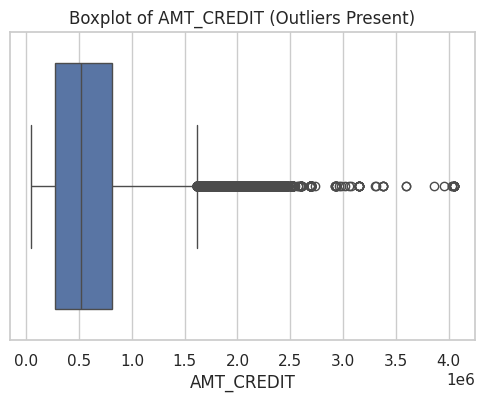


AMT_ANNUITY:
  Range: 1615.50 to 258025.50
  IQR bounds: -10584.00 to 61704.00
  Outliers: 7504 (2.44%)


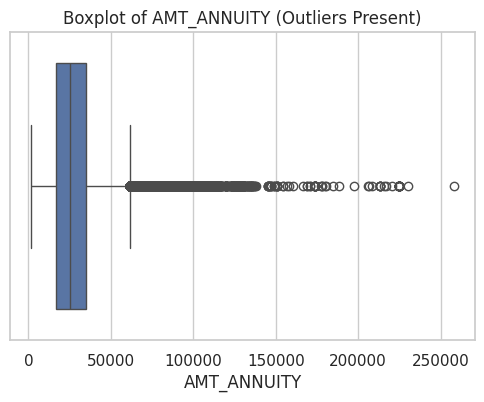


AMT_GOODS_PRICE:
  Range: 40500.00 to 4050000.00
  IQR bounds: -423000.00 to 1341000.00
  Outliers: 14728 (4.79%)


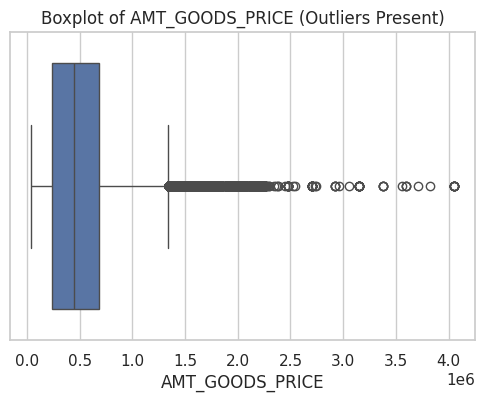


REGION_POPULATION_RELATIVE:
  Range: 0.00 to 0.07
  IQR bounds: -0.02 to 0.06
  Outliers: 8412 (2.74%)


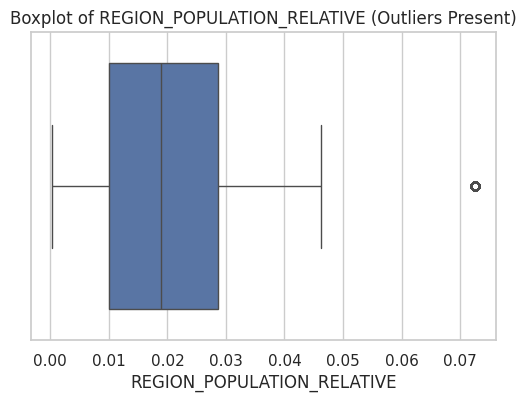


DAYS_BIRTH:
  Range: -25229.00 to -7489.00
  IQR bounds: -30585.50 to -1509.50
  Outliers: 0 (0.00%)

DAYS_EMPLOYED:
  Range: -17912.00 to 365243.00
  IQR bounds: -6466.50 to 3417.50
  Outliers: 72217 (23.48%)


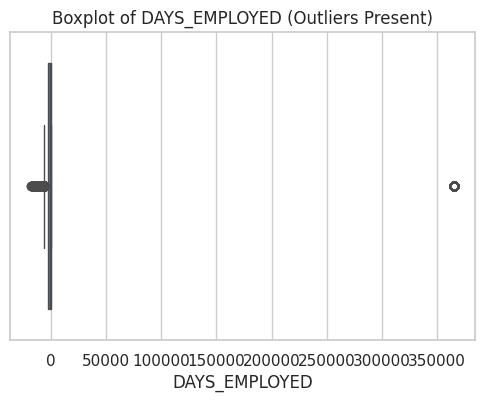


DAYS_REGISTRATION:
  Range: -24672.00 to 0.00
  IQR bounds: -15683.75 to 6194.25
  Outliers: 659 (0.21%)


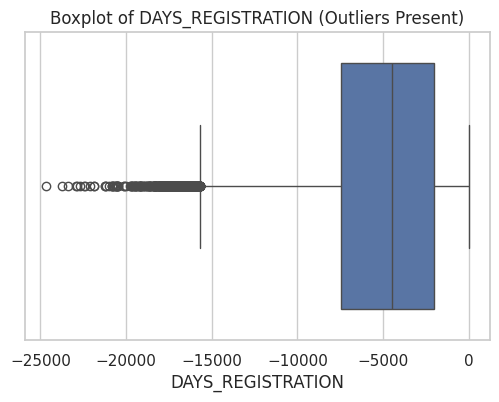


DAYS_ID_PUBLISH:
  Range: -7197.00 to 0.00
  IQR bounds: -8167.50 to 2148.50
  Outliers: 0 (0.00%)

OWN_CAR_AGE:
  Range: 0.00 to 91.00
  IQR bounds: -10.00 to 30.00
  Outliers: 4932 (1.60%)


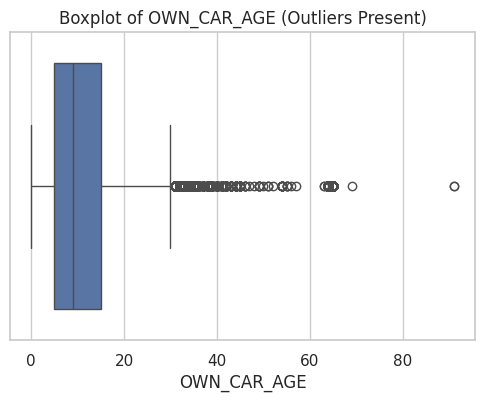


FLAG_MOBIL:
  Range: 0.00 to 1.00
  IQR bounds: 1.00 to 1.00
  Outliers: 1 (0.00%)


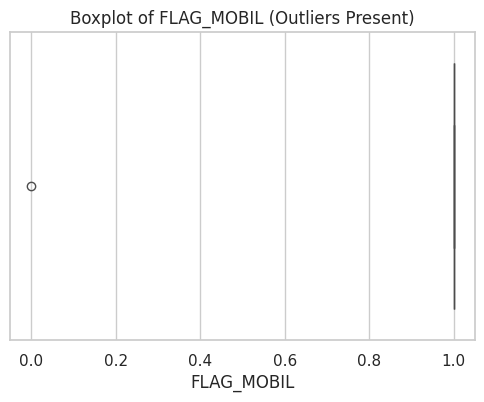


FLAG_EMP_PHONE:
  Range: 0.00 to 1.00
  IQR bounds: 1.00 to 1.00
  Outliers: 55386 (18.01%)


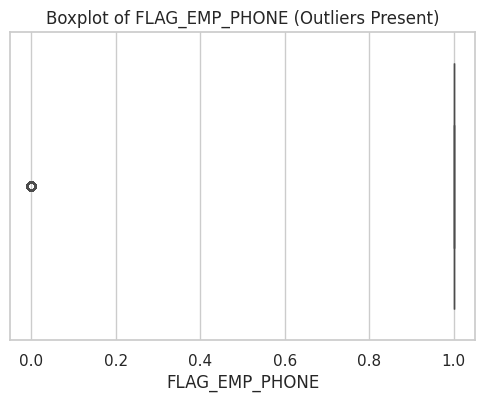


FLAG_WORK_PHONE:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 61308 (19.94%)


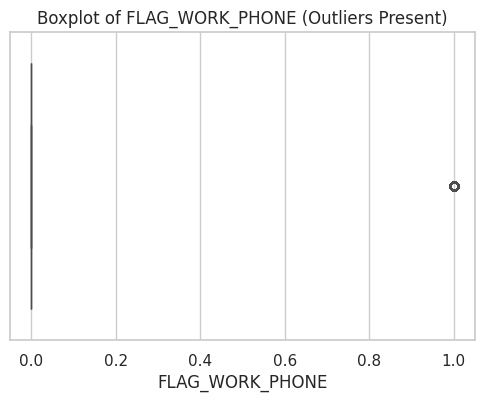


FLAG_CONT_MOBILE:
  Range: 0.00 to 1.00
  IQR bounds: 1.00 to 1.00
  Outliers: 574 (0.19%)


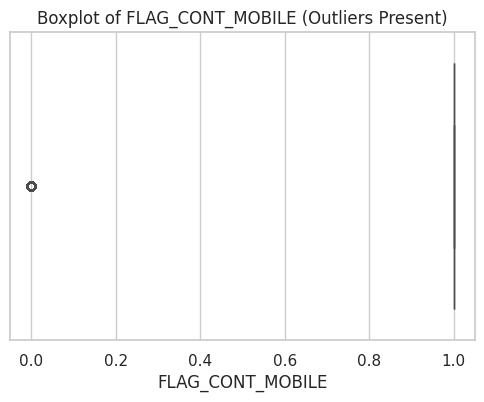


FLAG_PHONE:
  Range: 0.00 to 1.00
  IQR bounds: -1.50 to 2.50
  Outliers: 0 (0.00%)

FLAG_EMAIL:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 17442 (5.67%)


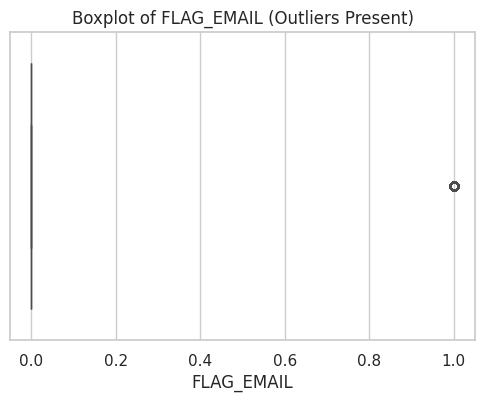


CNT_FAM_MEMBERS:
  Range: 1.00 to 20.00
  IQR bounds: 0.50 to 4.50
  Outliers: 4007 (1.30%)


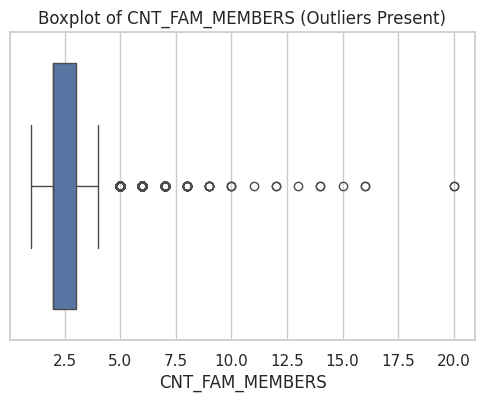


REGION_RATING_CLIENT:
  Range: 1.00 to 3.00
  IQR bounds: 2.00 to 2.00
  Outliers: 80527 (26.19%)


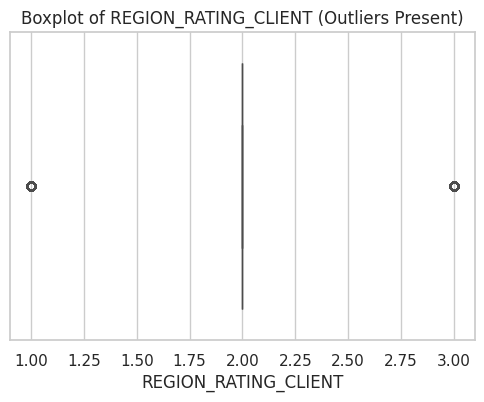


REGION_RATING_CLIENT_W_CITY:
  Range: 1.00 to 3.00
  IQR bounds: 2.00 to 2.00
  Outliers: 78027 (25.37%)


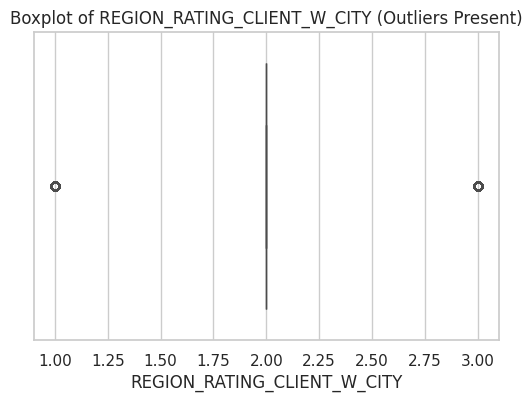


HOUR_APPR_PROCESS_START:
  Range: 0.00 to 23.00
  IQR bounds: 4.00 to 20.00
  Outliers: 2257 (0.73%)


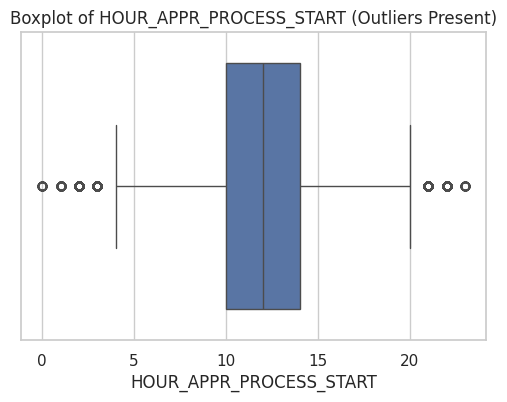


REG_REGION_NOT_LIVE_REGION:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 4657 (1.51%)


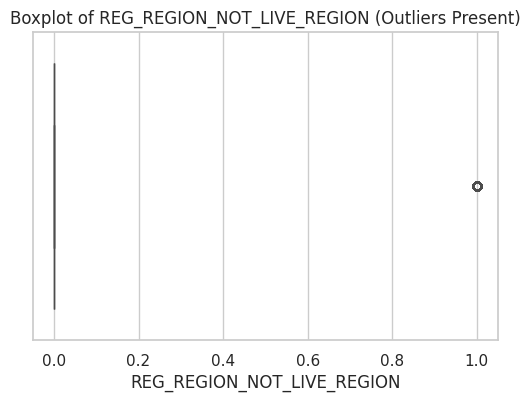


REG_REGION_NOT_WORK_REGION:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 15612 (5.08%)


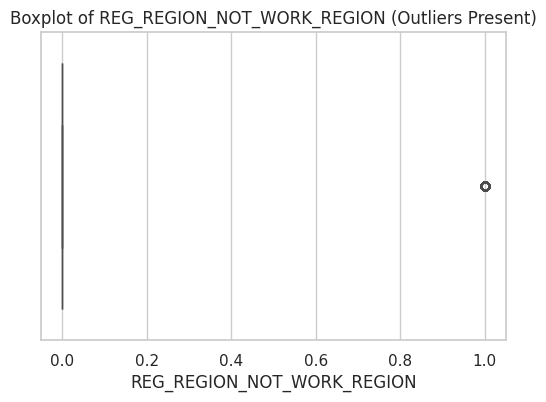


LIVE_REGION_NOT_WORK_REGION:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 12503 (4.07%)


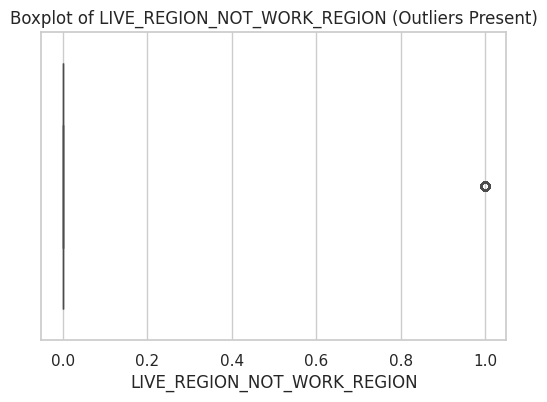


REG_CITY_NOT_LIVE_CITY:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 24039 (7.82%)


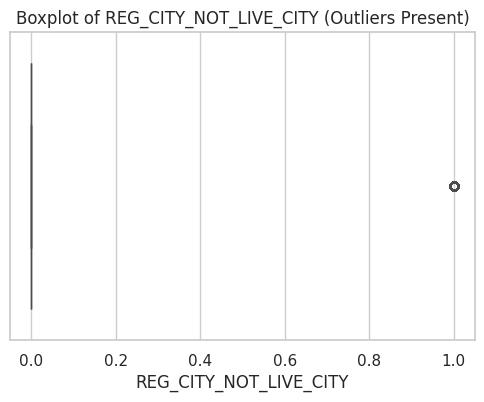


REG_CITY_NOT_WORK_CITY:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 70867 (23.05%)


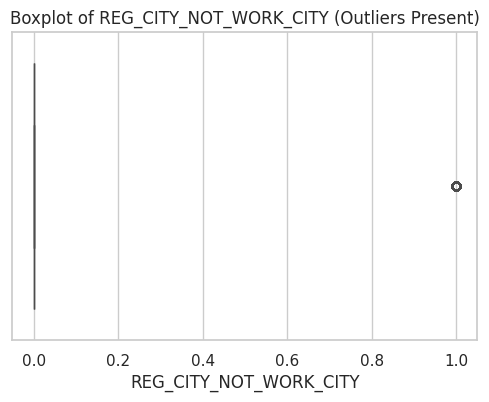


LIVE_CITY_NOT_WORK_CITY:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 55215 (17.96%)


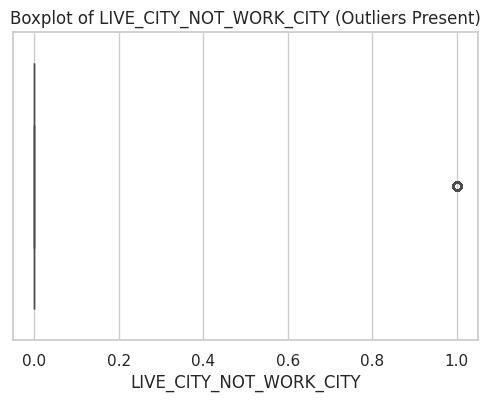


EXT_SOURCE_1:
  Range: 0.01 to 0.96
  IQR bounds: -0.18 to 1.19
  Outliers: 0 (0.00%)

EXT_SOURCE_2:
  Range: 0.00 to 0.85
  IQR bounds: -0.01 to 1.07
  Outliers: 0 (0.00%)

EXT_SOURCE_3:
  Range: 0.00 to 0.90
  IQR bounds: -0.08 to 1.12
  Outliers: 0 (0.00%)

APARTMENTS_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.28
  Outliers: 10655 (3.46%)


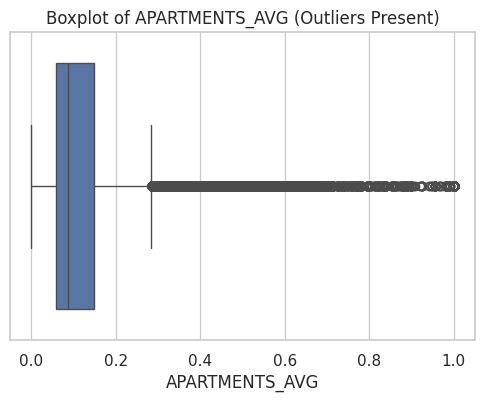


BASEMENTAREA_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.21
  Outliers: 7190 (2.34%)


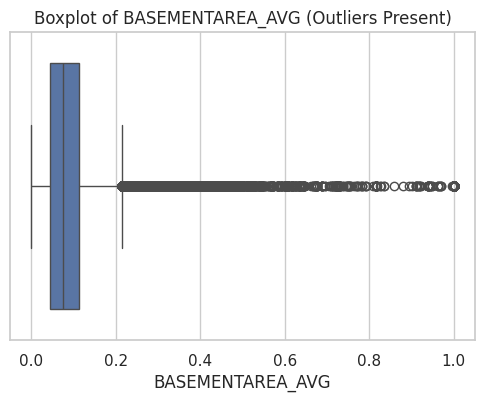


YEARS_BEGINEXPLUATATION_AVG:
  Range: 0.00 to 1.00
  IQR bounds: 0.96 to 1.00
  Outliers: 4784 (1.56%)


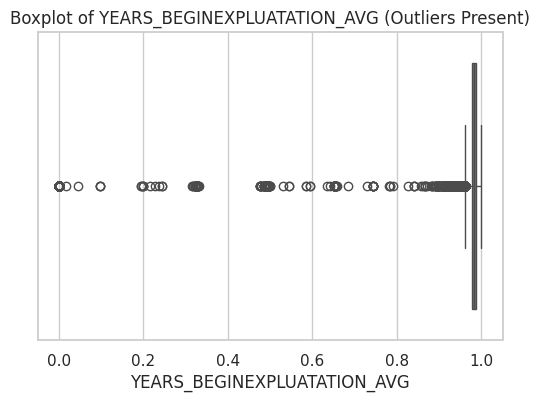


YEARS_BUILD_AVG:
  Range: 0.00 to 1.00
  IQR bounds: 0.48 to 1.03
  Outliers: 2154 (0.70%)


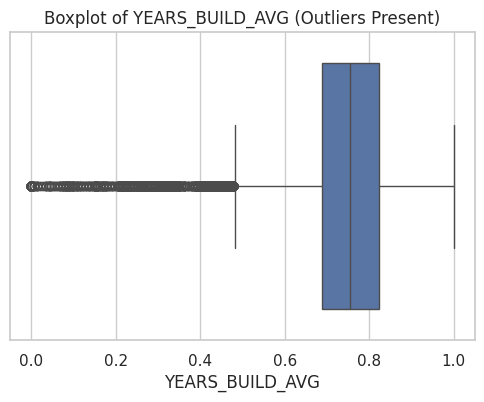


COMMONAREA_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.12
  Outliers: 7942 (2.58%)


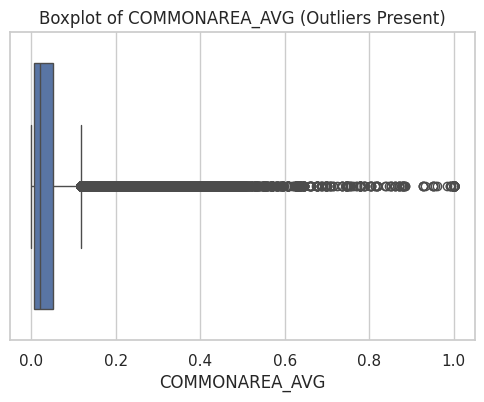


ELEVATORS_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.18 to 0.30
  Outliers: 10420 (3.39%)


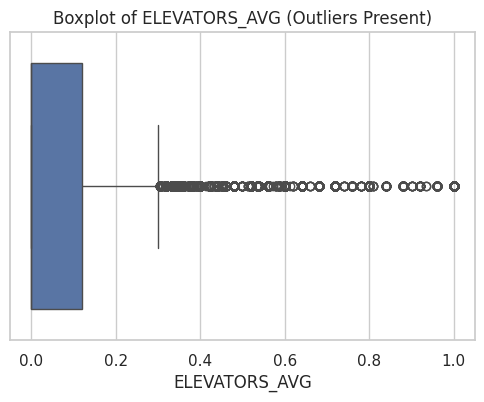


ENTRANCES_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.14 to 0.41
  Outliers: 3882 (1.26%)


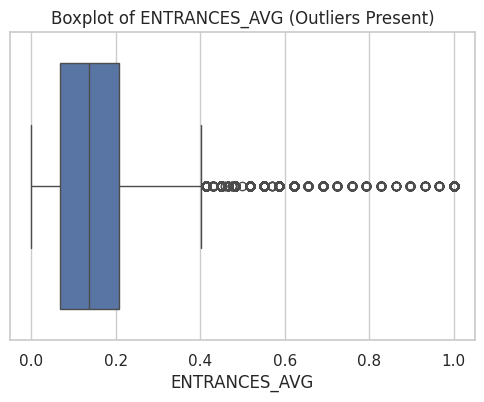


FLOORSMAX_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.58
  Outliers: 5215 (1.70%)


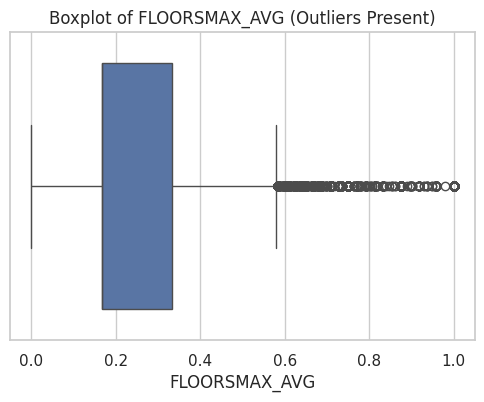


FLOORSMIN_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.35 to 0.81
  Outliers: 343 (0.11%)


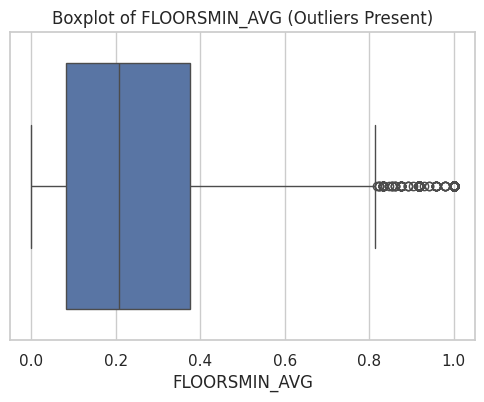


LANDAREA_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.19
  Outliers: 6888 (2.24%)


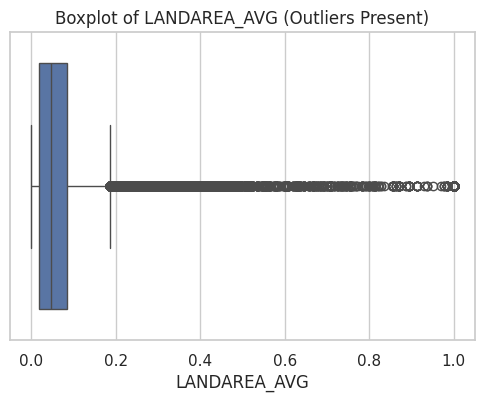


LIVINGAPARTMENTS_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.23
  Outliers: 7881 (2.56%)


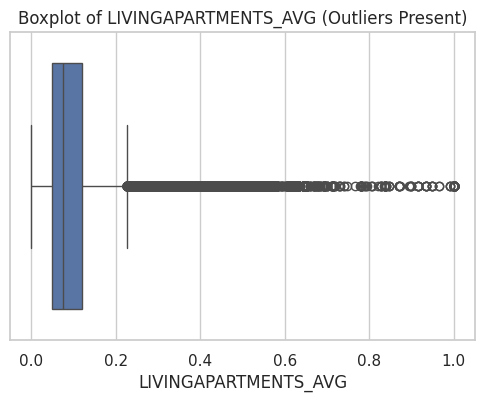


LIVINGAREA_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.26
  Outliers: 12517 (4.07%)


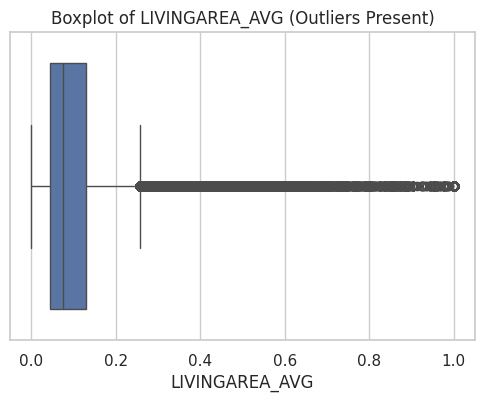


NONLIVINGAPARTMENTS_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.01 to 0.01
  Outliers: 15580 (5.07%)


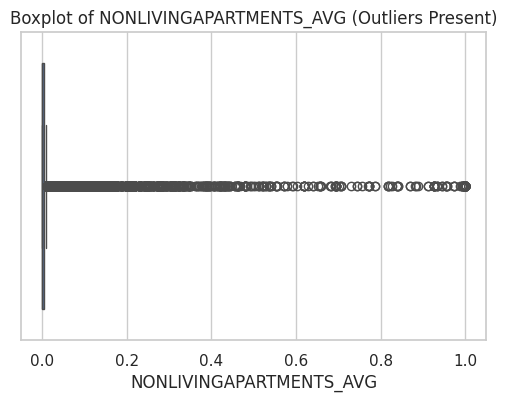


NONLIVINGAREA_AVG:
  Range: 0.00 to 1.00
  IQR bounds: -0.04 to 0.07
  Outliers: 16546 (5.38%)


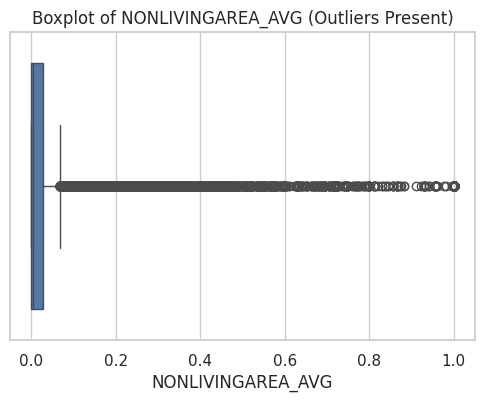


APARTMENTS_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.28
  Outliers: 10397 (3.38%)


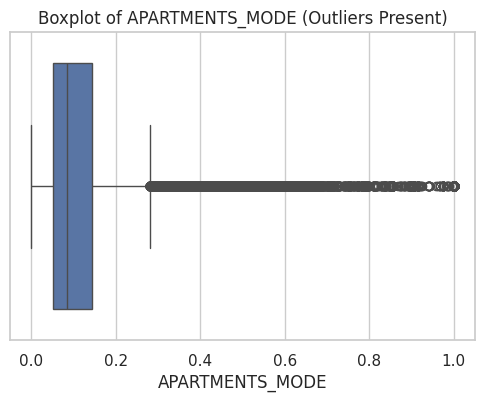


BASEMENTAREA_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.07 to 0.22
  Outliers: 6910 (2.25%)


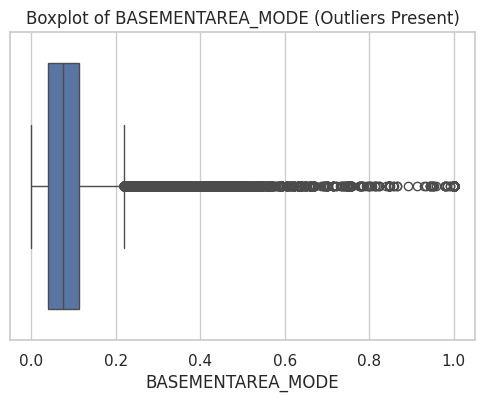


YEARS_BEGINEXPLUATATION_MODE:
  Range: 0.00 to 1.00
  IQR bounds: 0.96 to 1.00
  Outliers: 5074 (1.65%)


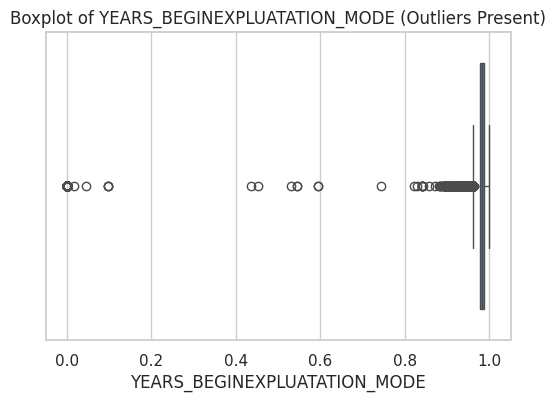


YEARS_BUILD_MODE:
  Range: 0.00 to 1.00
  IQR bounds: 0.51 to 1.01
  Outliers: 2537 (0.83%)


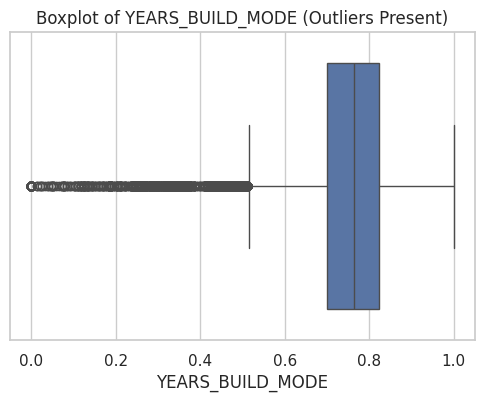


COMMONAREA_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.11
  Outliers: 7938 (2.58%)


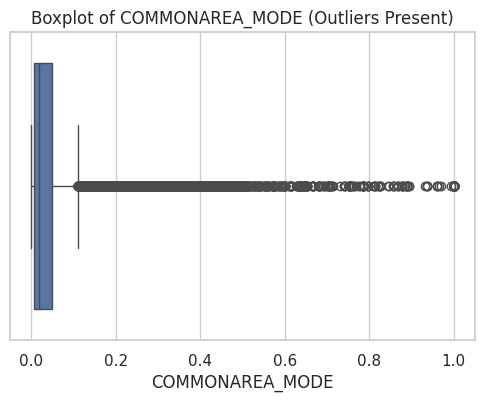


ELEVATORS_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.18 to 0.30
  Outliers: 9732 (3.16%)


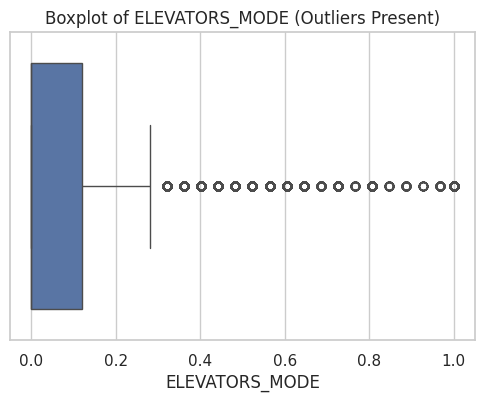


ENTRANCES_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.14 to 0.41
  Outliers: 3840 (1.25%)


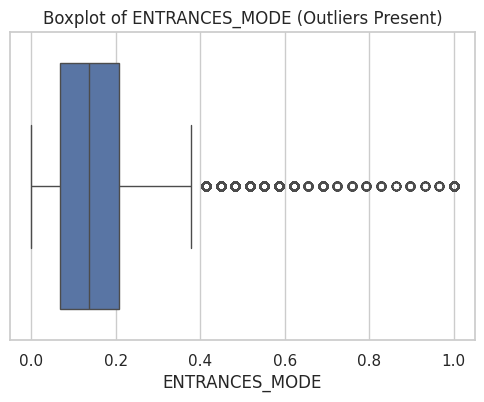


FLOORSMAX_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.58
  Outliers: 5104 (1.66%)


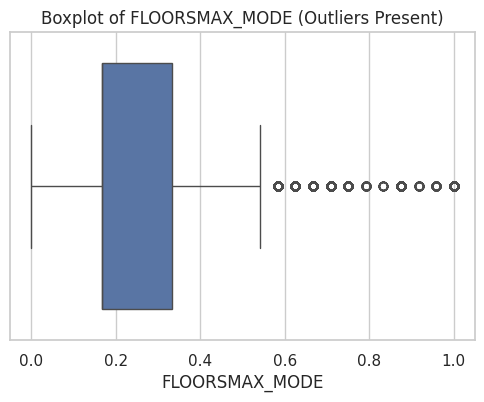


FLOORSMIN_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.35 to 0.81
  Outliers: 320 (0.10%)


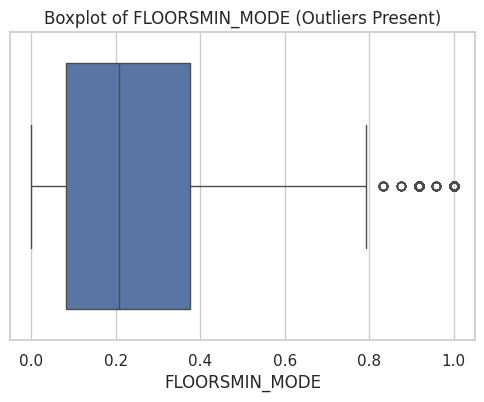


LANDAREA_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.19
  Outliers: 7033 (2.29%)


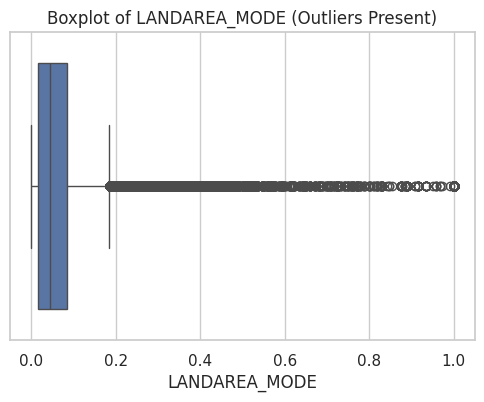


LIVINGAPARTMENTS_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.25
  Outliers: 7469 (2.43%)


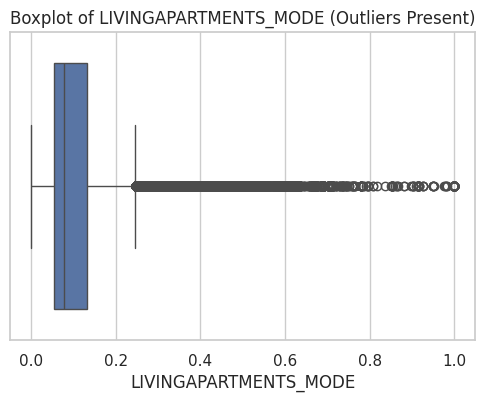


LIVINGAREA_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.25
  Outliers: 13105 (4.26%)


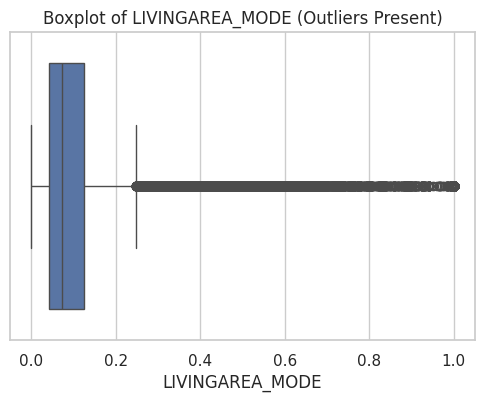


NONLIVINGAPARTMENTS_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.01 to 0.01
  Outliers: 14224 (4.63%)


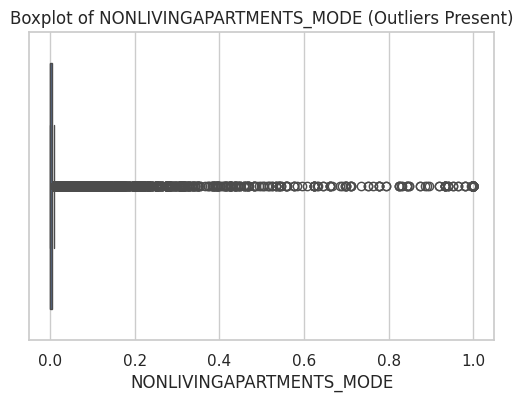


NONLIVINGAREA_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.03 to 0.06
  Outliers: 18817 (6.12%)


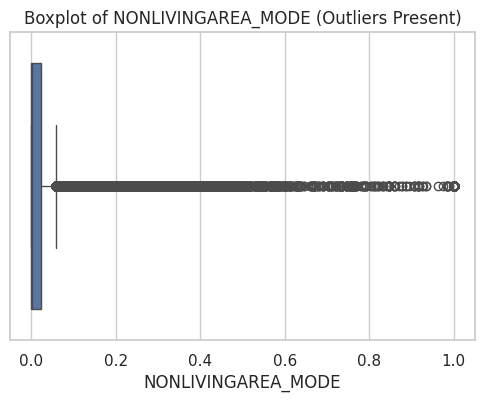


APARTMENTS_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.28
  Outliers: 10728 (3.49%)


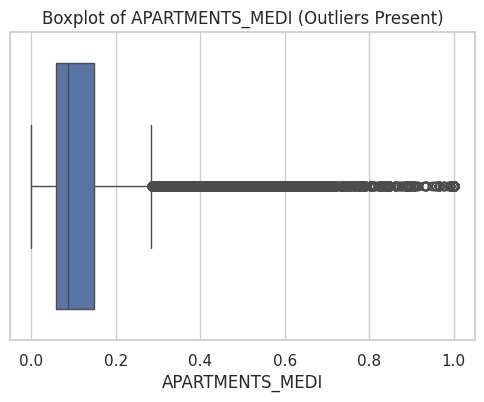


BASEMENTAREA_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.21
  Outliers: 7188 (2.34%)


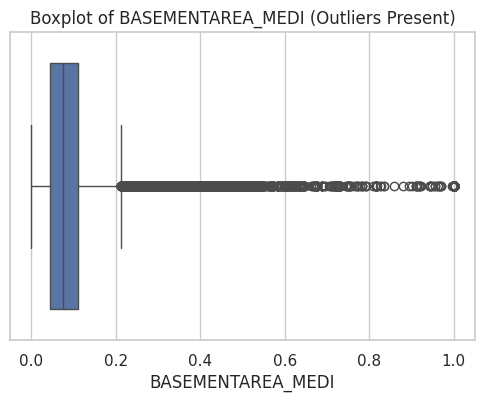


YEARS_BEGINEXPLUATATION_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: 0.96 to 1.00
  Outliers: 4762 (1.55%)


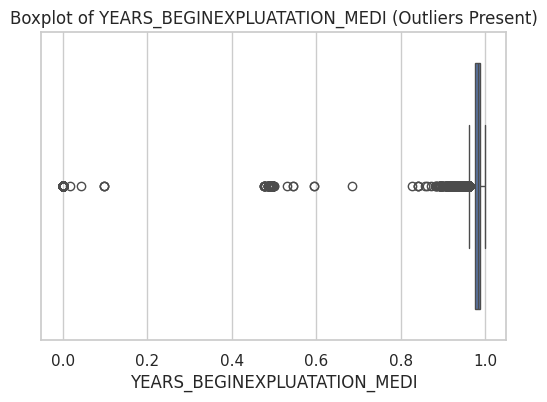


YEARS_BUILD_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: 0.49 to 1.03
  Outliers: 2274 (0.74%)


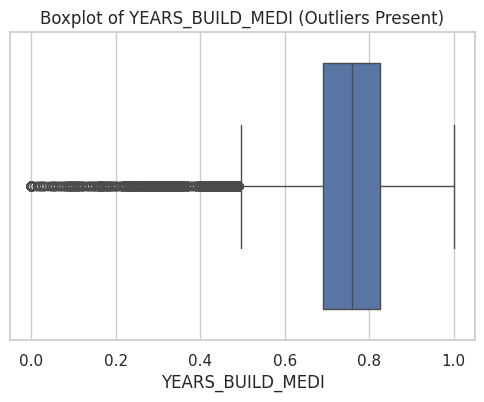


COMMONAREA_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.12
  Outliers: 8004 (2.60%)


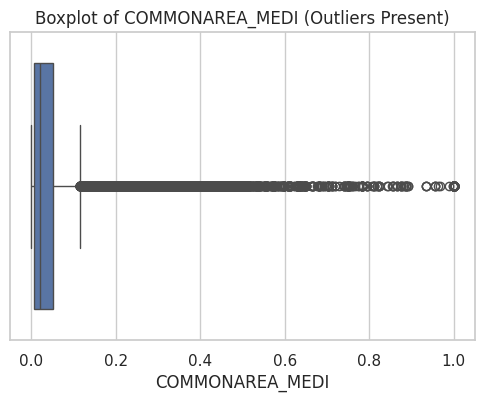


ELEVATORS_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.18 to 0.30
  Outliers: 10383 (3.38%)


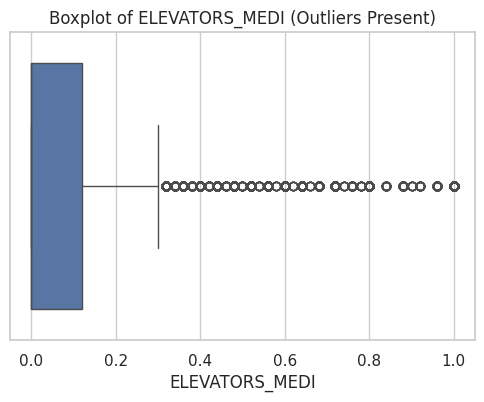


ENTRANCES_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.14 to 0.41
  Outliers: 3893 (1.27%)


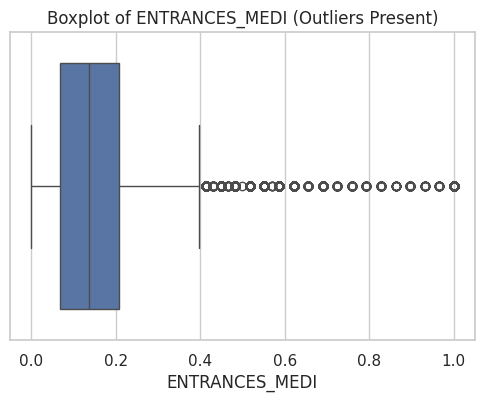


FLOORSMAX_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.58
  Outliers: 5360 (1.74%)


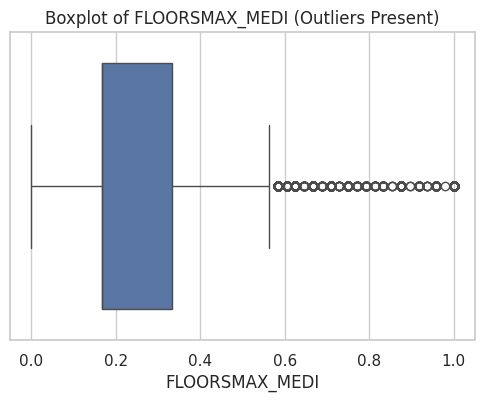


FLOORSMIN_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.35 to 0.81
  Outliers: 344 (0.11%)


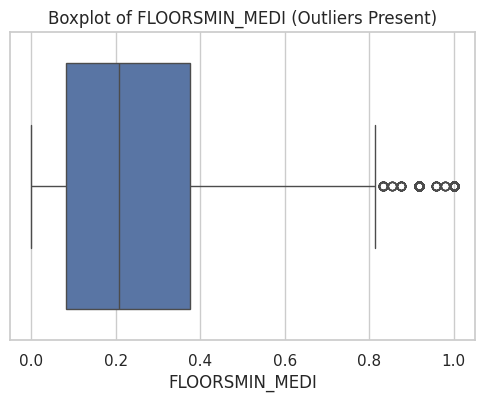


LANDAREA_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.19
  Outliers: 6873 (2.24%)


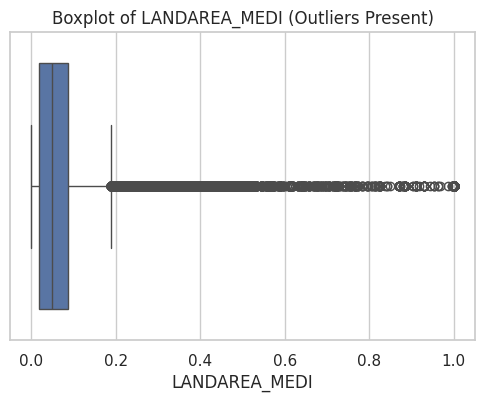


LIVINGAPARTMENTS_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.06 to 0.23
  Outliers: 7927 (2.58%)


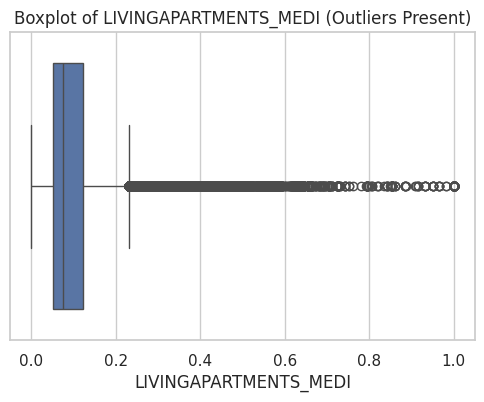


LIVINGAREA_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.08 to 0.26
  Outliers: 12907 (4.20%)


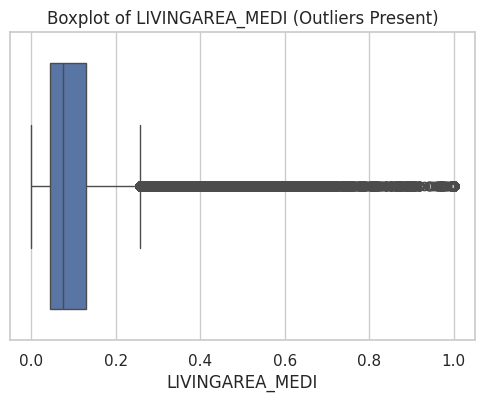


NONLIVINGAPARTMENTS_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.01 to 0.01
  Outliers: 15215 (4.95%)


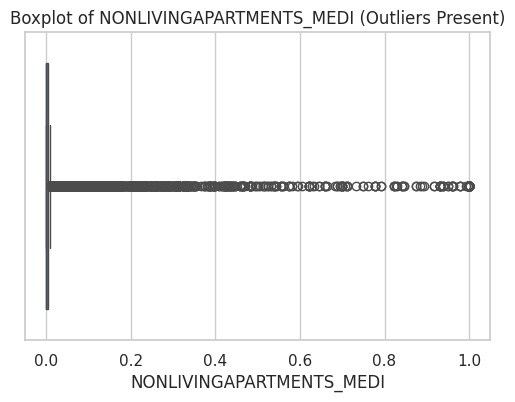


NONLIVINGAREA_MEDI:
  Range: 0.00 to 1.00
  IQR bounds: -0.04 to 0.07
  Outliers: 17254 (5.61%)


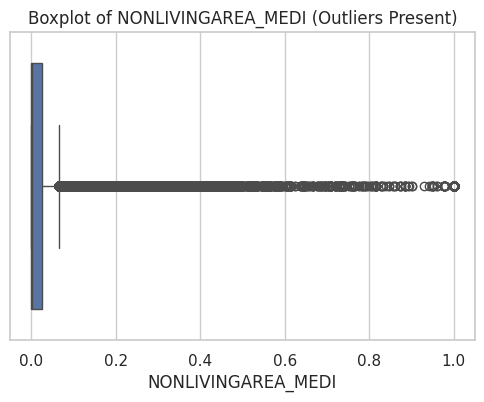


TOTALAREA_MODE:
  Range: 0.00 to 1.00
  IQR bounds: -0.09 to 0.26
  Outliers: 12091 (3.93%)


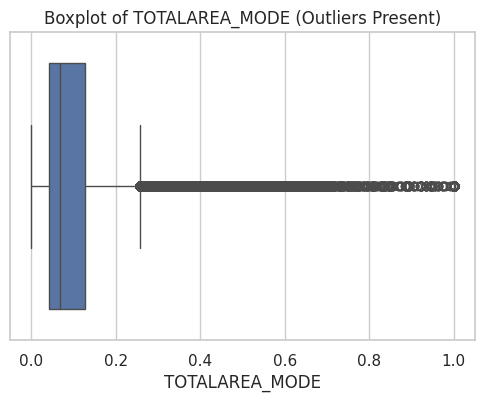


OBS_30_CNT_SOCIAL_CIRCLE:
  Range: 0.00 to 348.00
  IQR bounds: -3.00 to 5.00
  Outliers: 19971 (6.49%)


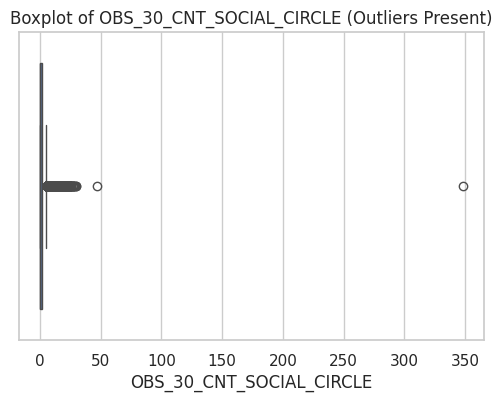


DEF_30_CNT_SOCIAL_CIRCLE:
  Range: 0.00 to 34.00
  IQR bounds: 0.00 to 0.00
  Outliers: 35166 (11.44%)


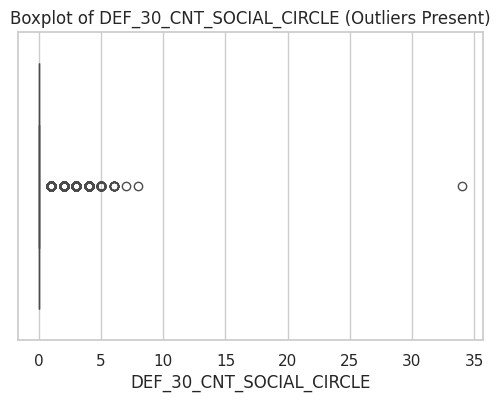


OBS_60_CNT_SOCIAL_CIRCLE:
  Range: 0.00 to 344.00
  IQR bounds: -3.00 to 5.00
  Outliers: 19564 (6.36%)


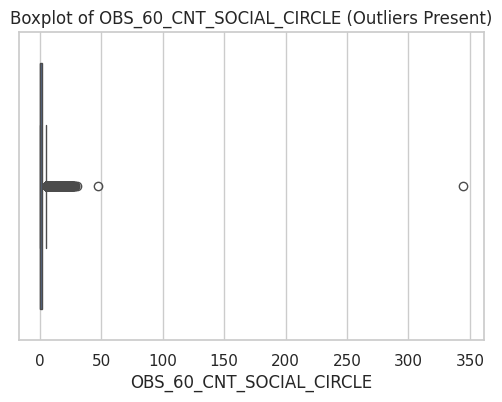


DEF_60_CNT_SOCIAL_CIRCLE:
  Range: 0.00 to 24.00
  IQR bounds: 0.00 to 0.00
  Outliers: 25769 (8.38%)


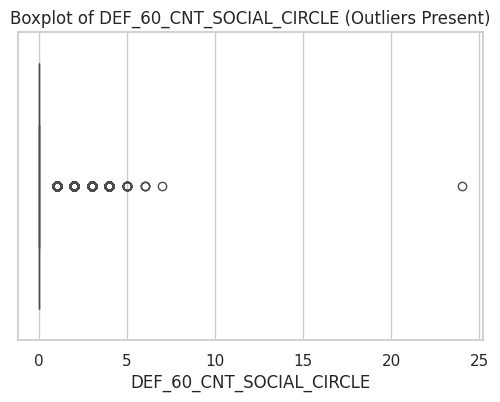


DAYS_LAST_PHONE_CHANGE:
  Range: -4292.00 to 0.00
  IQR bounds: -3514.00 to 1670.00
  Outliers: 435 (0.14%)


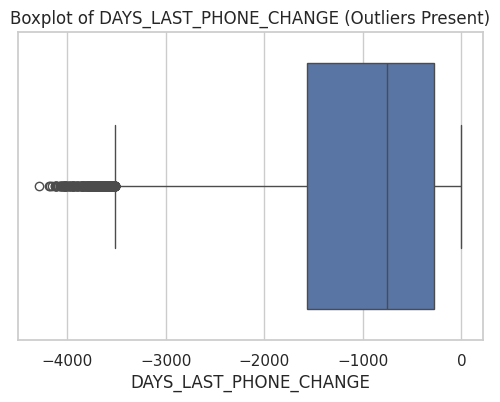


FLAG_DOCUMENT_2:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 13 (0.00%)


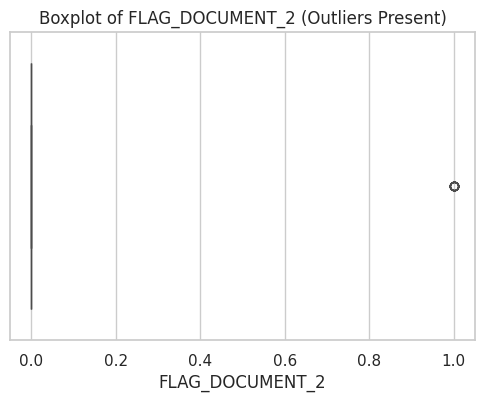


FLAG_DOCUMENT_3:
  Range: 0.00 to 1.00
  IQR bounds: -1.50 to 2.50
  Outliers: 0 (0.00%)

FLAG_DOCUMENT_4:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 25 (0.01%)


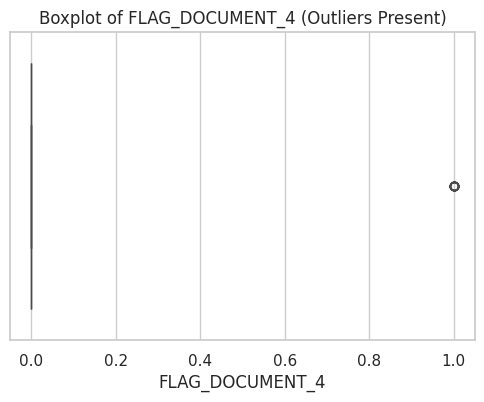


FLAG_DOCUMENT_5:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 4648 (1.51%)


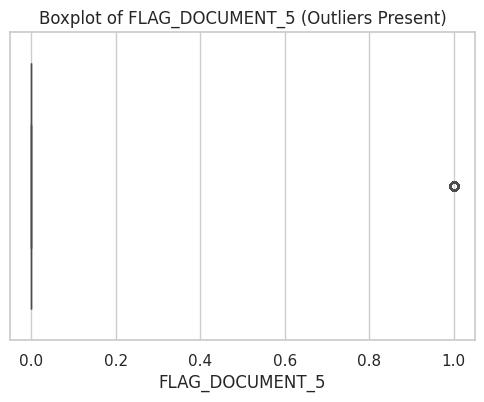


FLAG_DOCUMENT_6:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 27078 (8.81%)


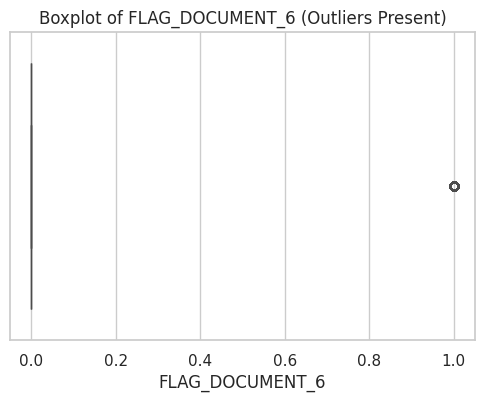


FLAG_DOCUMENT_7:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 59 (0.02%)


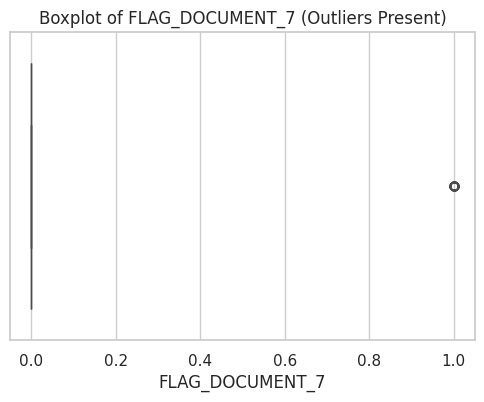


FLAG_DOCUMENT_8:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 25024 (8.14%)


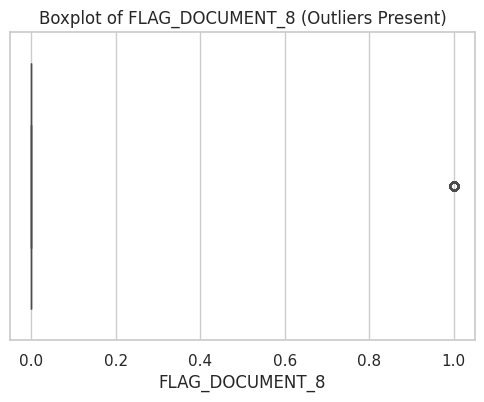


FLAG_DOCUMENT_9:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 1198 (0.39%)


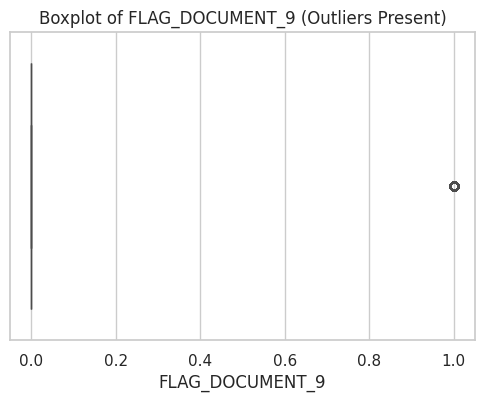


FLAG_DOCUMENT_10:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 7 (0.00%)


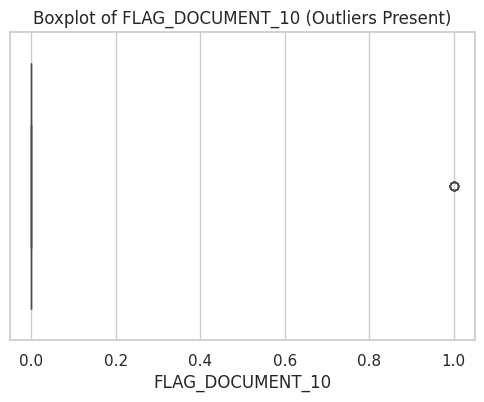


FLAG_DOCUMENT_11:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 1203 (0.39%)


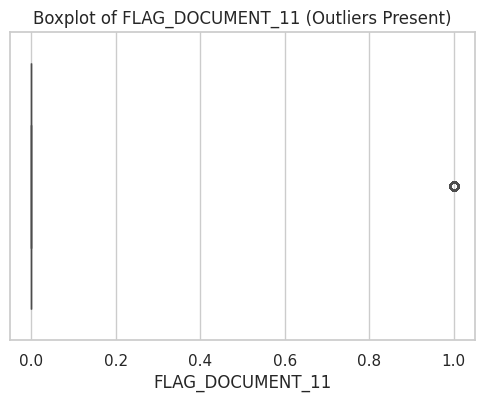


FLAG_DOCUMENT_12:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 2 (0.00%)


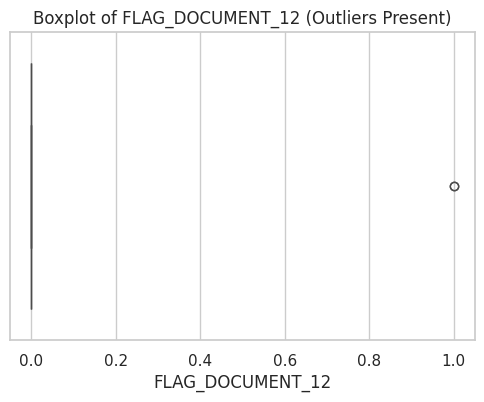


FLAG_DOCUMENT_13:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 1084 (0.35%)


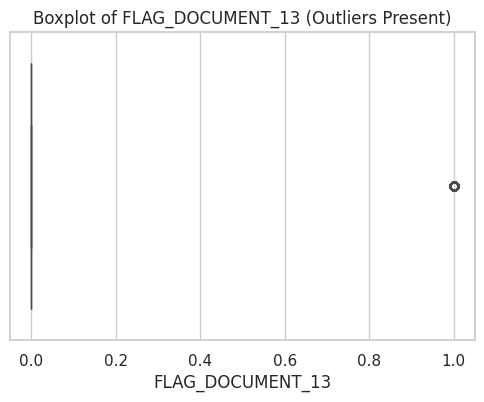


FLAG_DOCUMENT_14:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 903 (0.29%)


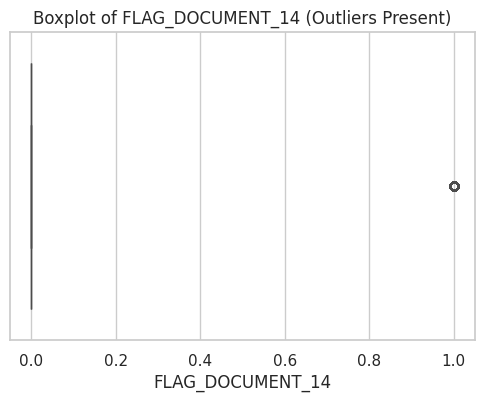


FLAG_DOCUMENT_15:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 372 (0.12%)


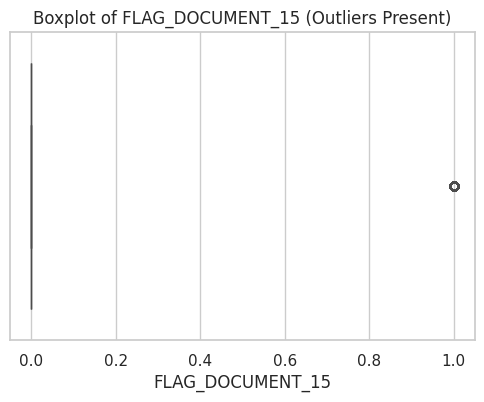


FLAG_DOCUMENT_16:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 3053 (0.99%)


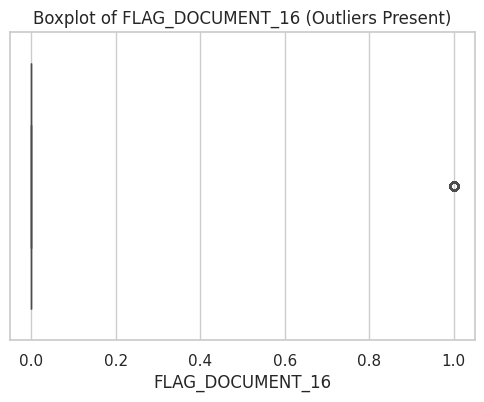


FLAG_DOCUMENT_17:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 82 (0.03%)


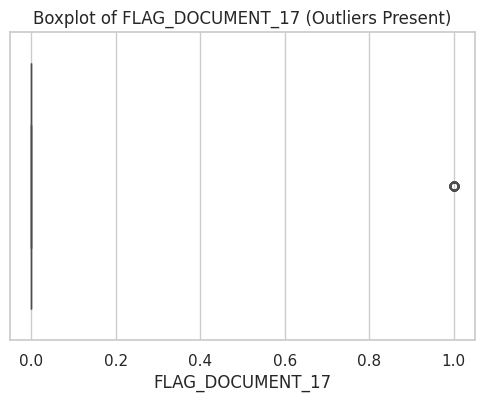


FLAG_DOCUMENT_18:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 2500 (0.81%)


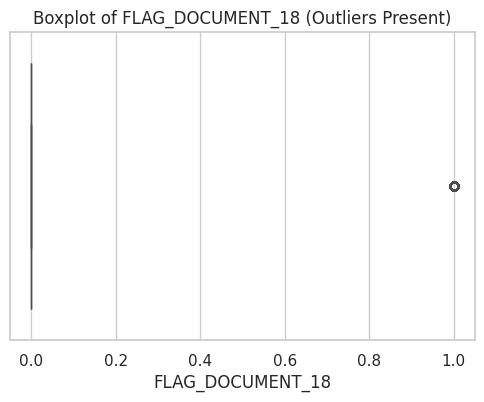


FLAG_DOCUMENT_19:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 183 (0.06%)


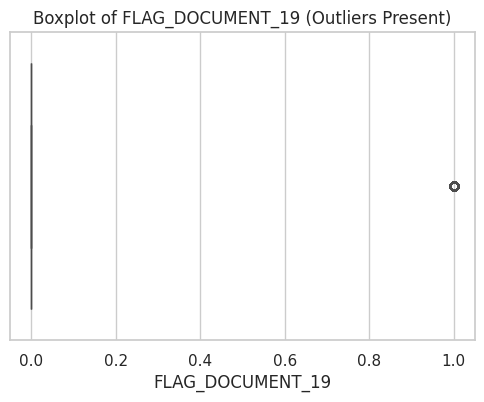


FLAG_DOCUMENT_20:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 156 (0.05%)


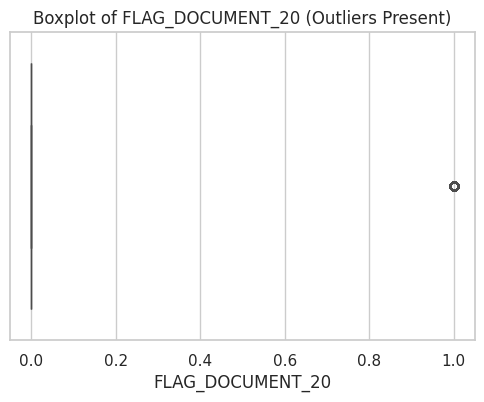


FLAG_DOCUMENT_21:
  Range: 0.00 to 1.00
  IQR bounds: 0.00 to 0.00
  Outliers: 103 (0.03%)


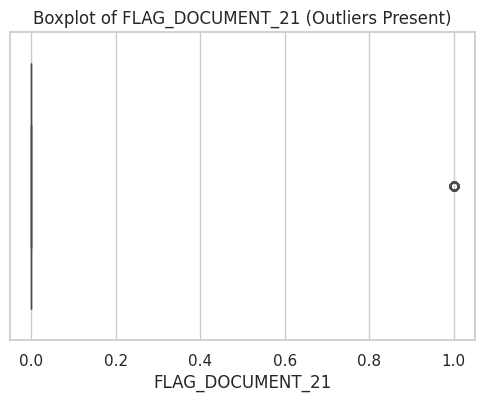


AMT_REQ_CREDIT_BUREAU_HOUR:
  Range: 0.00 to 4.00
  IQR bounds: 0.00 to 0.00
  Outliers: 1626 (0.53%)


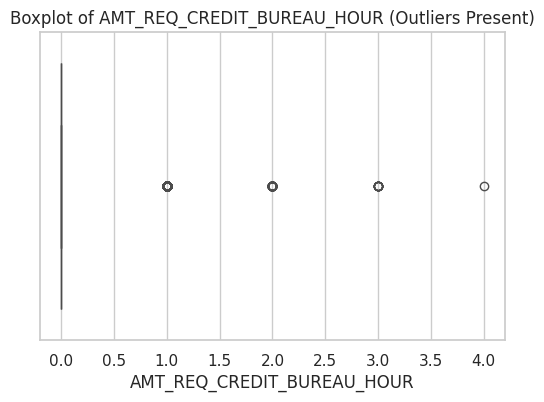


AMT_REQ_CREDIT_BUREAU_DAY:
  Range: 0.00 to 9.00
  IQR bounds: 0.00 to 0.00
  Outliers: 1489 (0.48%)


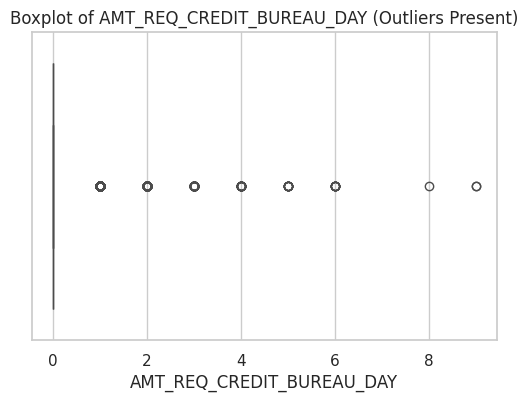


AMT_REQ_CREDIT_BUREAU_WEEK:
  Range: 0.00 to 8.00
  IQR bounds: 0.00 to 0.00
  Outliers: 8536 (2.78%)


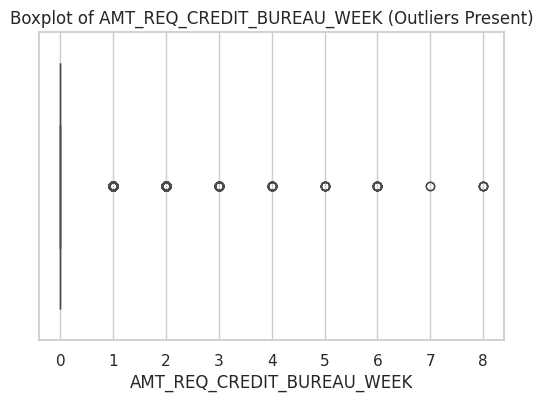


AMT_REQ_CREDIT_BUREAU_MON:
  Range: 0.00 to 27.00
  IQR bounds: 0.00 to 0.00
  Outliers: 43759 (14.23%)


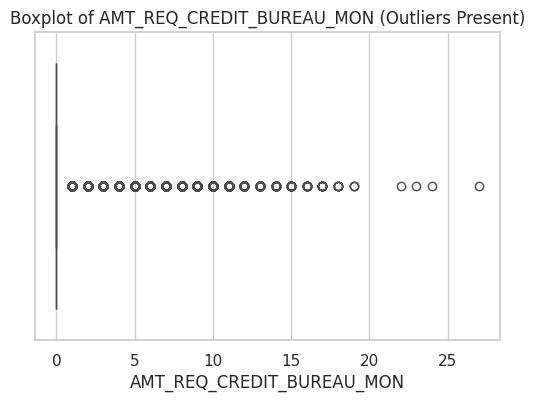


AMT_REQ_CREDIT_BUREAU_QRT:
  Range: 0.00 to 261.00
  IQR bounds: 0.00 to 0.00
  Outliers: 50575 (16.45%)


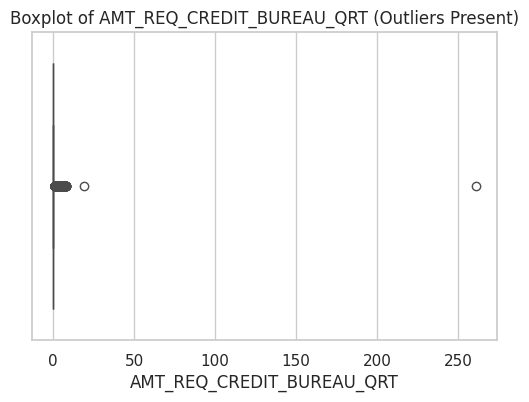


AMT_REQ_CREDIT_BUREAU_YEAR:
  Range: 0.00 to 25.00
  IQR bounds: -4.50 to 7.50
  Outliers: 3364 (1.09%)


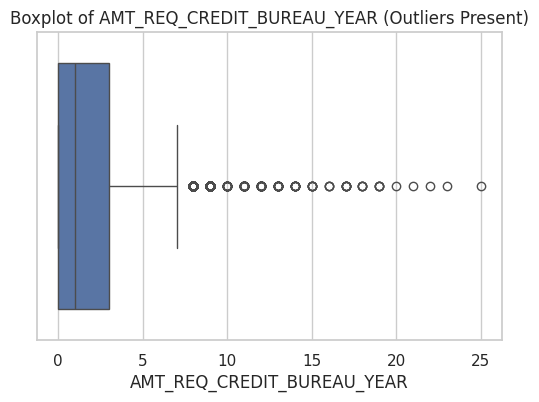

In [ ]:
# 4. Outliers Detection
numerical_cols = df_train.select_dtypes(include=[np.number]).columns.tolist()
print(f"Numerical columns: {numerical_cols}")

for col in numerical_cols:
    Q1 = df_train[col].quantile(0.25)
    Q3 = df_train[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df_train[(df_train[col] < lower_bound) | (df_train[col] > upper_bound)]
    outlier_count = len(outliers)
    outlier_percentage = (outlier_count / len(df_train)) * 100

    print(f"\n{col}:")
    print(f"  Range: {df_train[col].min():.2f} to {df_train[col].max():.2f}")
    print(f"  IQR bounds: {lower_bound:.2f} to {upper_bound:.2f}")
    print(f"  Outliers: {outlier_count} ({outlier_percentage:.2f}%)")

    # Plot boxplot for columns that have outliers
    if outlier_count > 0:
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=df_train[col])
        plt.title(f"Boxplot of {col} (Outliers Present)")
        plt.xlabel(col)
        plt.show()

In [ ]:
tar_col = 'TARGET'
num_cols = df_train.select_dtypes(include = np.number).columns.tolist()
num_cols.remove(tar_col)
cat_cols = df_train.select_dtypes(include = ['object']).columns.tolist()
tar_col, num_cols, cat_cols

('TARGET',
 ['SK_ID_CURR',
  'CNT_CHILDREN',
  'AMT_INCOME_TOTAL',
  'AMT_CREDIT',
  'AMT_ANNUITY',
  'AMT_GOODS_PRICE',
  'REGION_POPULATION_RELATIVE',
  'DAYS_BIRTH',
  'DAYS_EMPLOYED',
  'DAYS_REGISTRATION',
  'DAYS_ID_PUBLISH',
  'OWN_CAR_AGE',
  'FLAG_MOBIL',
  'FLAG_EMP_PHONE',
  'FLAG_WORK_PHONE',
  'FLAG_CONT_MOBILE',
  'FLAG_PHONE',
  'FLAG_EMAIL',
  'CNT_FAM_MEMBERS',
  'REGION_RATING_CLIENT',
  'REGION_RATING_CLIENT_W_CITY',
  'HOUR_APPR_PROCESS_START',
  'REG_REGION_NOT_LIVE_REGION',
  'REG_REGION_NOT_WORK_REGION',
  'LIVE_REGION_NOT_WORK_REGION',
  'REG_CITY_NOT_LIVE_CITY',
  'REG_CITY_NOT_WORK_CITY',
  'LIVE_CITY_NOT_WORK_CITY',
  'EXT_SOURCE_1',
  'EXT_SOURCE_2',
  'EXT_SOURCE_3',
  'APARTMENTS_AVG',
  'BASEMENTAREA_AVG',
  'YEARS_BEGINEXPLUATATION_AVG',
  'YEARS_BUILD_AVG',
  'COMMONAREA_AVG',
  'ELEVATORS_AVG',
  'ENTRANCES_AVG',
  'FLOORSMAX_AVG',
  'FLOORSMIN_AVG',
  'LANDAREA_AVG',
  'LIVINGAPARTMENTS_AVG',
  'LIVINGAREA_AVG',
  'NONLIVINGAPARTMENTS_AVG',
  'NONLIVI

In [ ]:
# statistic of cat cols
cat_stats = []
for c in cat_cols:
    cat_stats.append([c, df_train[c].dtype, df_train[c].nunique(),df_train[c].unique().tolist()])
cat_stats = pd.DataFrame(cat_stats, columns=['Cat-col', 'dtype', 'num_unique_value', 'values'])
cat_stats

,Cat-col,dtype,num_unique_value,values
0,NAME_CONTRACT_TYPE,object,2,"[Cash loans, Revolving loans]"
1,CODE_GENDER,object,3,"[M, F, XNA]"
2,FLAG_OWN_CAR,object,2,"[N, Y]"
3,FLAG_OWN_REALTY,object,2,"[Y, N]"
4,NAME_TYPE_SUITE,object,7,"[Unaccompanied, Family, Spouse, partner, Children, Other_A, nan, Other_B, Group of people]"
5,NAME_INCOME_TYPE,object,8,"[Working, State servant, Commercial associate, Pensioner, Unemployed, Student, Businessman, Maternity leave]"
6,NAME_EDUCATION_TYPE,object,5,"[Secondary / secondary special, Higher education, Incomplete higher, Lower secondary, Academic degree]"
7,NAME_FAMILY_STATUS,object,6,"[Single / not married, Married, Civil marriage, Widow, Separated, Unknown]"
8,NAME_HOUSING_TYPE,object,6,"[House / apartment, Rented apartment, With parents, Municipal apartment, Office apartment, Co-op apartment]"
9,OCCUPATION_TYPE,object,18,"[Laborers, Core staff, Accountants, Managers, nan, Drivers, Sales staff, Cleaning staff, Cooking staff, Private service staff, Medicine staff, Security staff, High skill tech staff, Waiters/barmen staff, Low-skill Laborers, Realty agents, Secretaries, IT staff, HR staff]"


In [ ]:
# Statistic of num cols
df_train[num_cols].describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


## EDA on the ‘Application Train’ Dataset

## 2.2 Inspect Target

/tmp/ipython-input-4119308512.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='TARGET', data=df_train, palette=['#66b3ff', '#ff9999'], ax=axes[1])


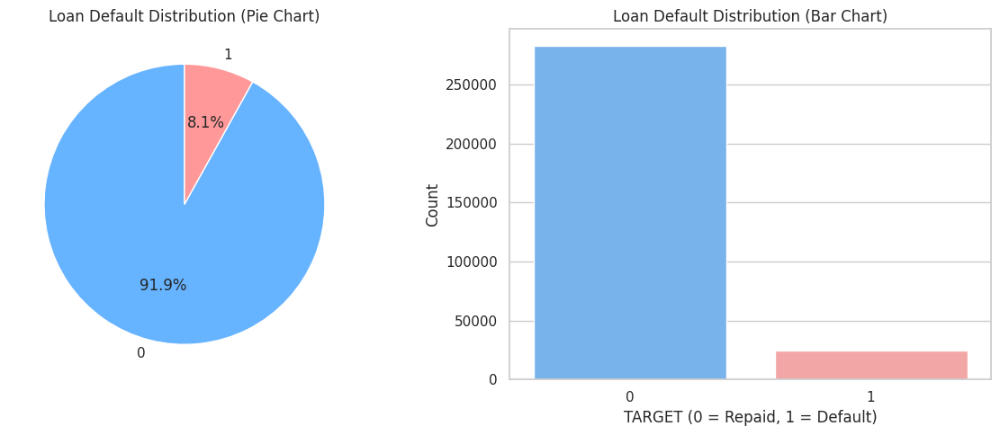

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Pie chart of TARGET distribution
df_train['TARGET'].value_counts().plot.pie(
    ax=axes[0],
    autopct='%1.1f%%',
    startangle=90,
    colors=['#66b3ff', '#ff9999']
)
axes[0].set_title('Loan Default Distribution (Pie Chart)')
axes[0].set_ylabel('')

# Bar chart of TARGET distribution
sns.countplot(x='TARGET', data=df_train, palette=['#66b3ff', '#ff9999'], ax=axes[1])
axes[1].set_title('Loan Default Distribution (Bar Chart)')
axes[1].set_xlabel('TARGET (0 = Repaid, 1 = Default)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

Most of the applicants in the dataset are able to repay their loans, with around 92% classified as capable of repayment and only about 8% ending up in default. This clearly highlights that the dataset is highly imbalanced, since the non-default class dominates the default class. From a modeling perspective, this imbalance is important to keep in mind because a simple accuracy score would not be meaningful in evaluating performance. Instead, more suitable metrics such as AUC, precision-recall, or F1-score need to be considered to properly capture the model’s ability to identify defaulting clients.

## 2.3 Univerate Analysis

### 2.3.1. Application – Categorical Columns

In [ ]:
STATUS_COLORS = {0: "#2E86AB", 1: "#E76F51"}  # 0=Repaid, 1=Default
PIE_PALETTE = sns.color_palette("pastel")

def plot_cat_vs_target(df, col, target="TARGET", top_n=12):
    """
    Produces:
        (1) Pie of category distribution (capped at top_n; others -> 'Other')
        (2) Horizontal stacked bar of counts by TARGET (top_n categories + 'Other')
        (3) Tables: counts, percentage, default rate (%)  [FULL + Totals]
        (4) Bar of default rate (%) (capped at top_n; others -> 'Other')
    """
    d = df[[col, target]].copy()
    d[col] = d[col].fillna("Unknown")

    # Determine top_n categories by total volume
    counts_full = (
        d.groupby([col, target]).size()
         .unstack(fill_value=0)
         .reindex(columns=[0, 1], fill_value=0)
    )
    counts_full["_Total_"] = counts_full.sum(axis=1)   # 👈 add total
    top_categories = (
        counts_full.sort_values("_Total_", ascending=False)
                   .head(top_n).index
    )

    # Build a visual-only column with 'Other'
    col_vis = f"{col}__VIS"
    d[col_vis] = np.where(d[col].isin(top_categories), d[col], "Other")

    # 1) PIE & STACKED BAR (using visual column)
    fig, axs = plt.subplots(1, 2, figsize=(16, 6))

    # 1a) PIE (capped)
    vc_vis = d[col_vis].value_counts(dropna=False)
    vc_vis.plot(
        kind="pie",
        autopct="%.2f%%",
        ax=axs[0],
        title=f"{col} Distribution (Pie, top {top_n}+Other)",
        colors=PIE_PALETTE,
        ylabel=""
    )

    # 1b) Stacked bar by TARGET (capped)
    counts_vis = (
        d.groupby([col_vis, target]).size()
         .unstack(fill_value=0)
         .reindex(columns=[0, 1], fill_value=0)
    )
    counts_vis["_Total_"] = counts_vis.sum(axis=1)
    counts_plot = counts_vis.sort_values("_Total_", ascending=False).drop(columns="_Total_")
    counts_plot.rename(columns={0: "Repaid (0)", 1: "Default (1)"}, inplace=True)

    counts_plot.plot(
        kind="barh",
        stacked=True,
        ax=axs[1],
        color=[STATUS_COLORS[0], STATUS_COLORS[1]],
        edgecolor="none"
    )
    axs[1].set_title(f"{col} by {target} (Counts, top {top_n}+Other)")
    axs[1].set_ylabel(col.replace("_", " ").title())
    axs[1].set_xlabel("Count")
    axs[1].legend(title="Status", loc="upper right")

    plt.tight_layout()
    plt.show()

    # 2) Percentage table (row-wise)
    pct = (
        d.groupby(col)[target].value_counts(normalize=True)
         .unstack(fill_value=0) * 100
    ).reindex(columns=[0, 1], fill_value=0).round(2)
    pct["_Total_"] = counts_full["_Total_"]   # 👈 append total count
    pct.rename(columns={0: "Repaid (0) %", 1: "Default (1) %"}, inplace=True)

    # 3) Default rate
    default_rate_full = (
        d.groupby(col)[target].mean().mul(100).round(2)
         .rename("Default Rate (%)")
         .sort_values(ascending=False)
    )

    # 4) Display tables (FULL)
    print(f"\n=== {col}: Counts of {target} by category (FULL, with totals) ===")
    display(counts_full.rename(columns={0: "Repaid (0)", 1: "Default (1)"}))

    print(f"\n=== {col}: Percentage of {target} by category (row-wise, FULL, with totals) ===")
    display(pct)

    print(f"\n=== {col}: Default Rate (TARGET=1, %, FULL) ===")
    display(default_rate_full.to_frame())

    # 5) Default rate bar (capped to top_n + Other)
    default_rate_vis = (
        d.groupby(col_vis)[target].mean().mul(100).round(2)
         .rename("Default Rate (%)")
         .sort_values(ascending=False)
    )

    plt.figure(figsize=(8, 4.5))
    default_rate_vis.sort_values(ascending=True).plot(
        kind="barh",
        color=STATUS_COLORS[1],
        edgecolor="none"
    )
    plt.title(f"Default Rate (%) by {col} (top {top_n}+Other)")
    plt.xlabel("Default Rate (%)")
    plt.ylabel(col.replace("_", " ").title())
    plt.grid(axis="x", alpha=0.2)
    plt.tight_layout()
    plt.show()

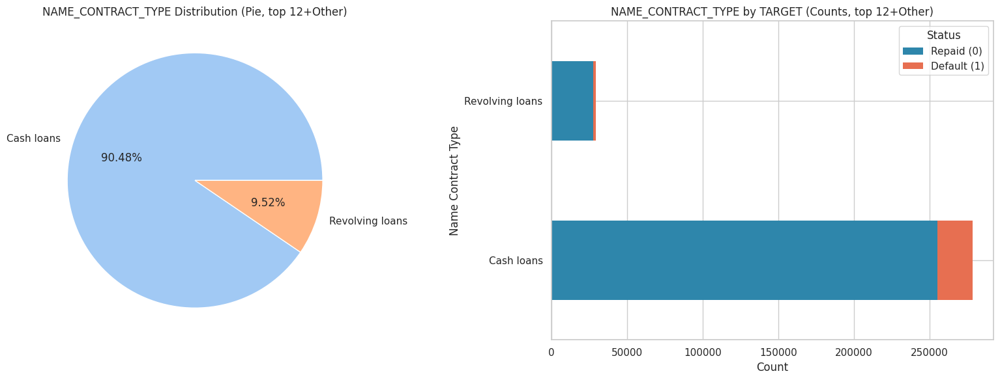


=== NAME_CONTRACT_TYPE: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
NAME_CONTRACT_TYPE,,,
Cash loans,255011,23221,278232
Revolving loans,27675,1604,29279



=== NAME_CONTRACT_TYPE: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
NAME_CONTRACT_TYPE,,,
Cash loans,91.65,8.35,278232
Revolving loans,94.52,5.48,29279



=== NAME_CONTRACT_TYPE: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
NAME_CONTRACT_TYPE,
Cash loans,8.35
Revolving loans,5.48


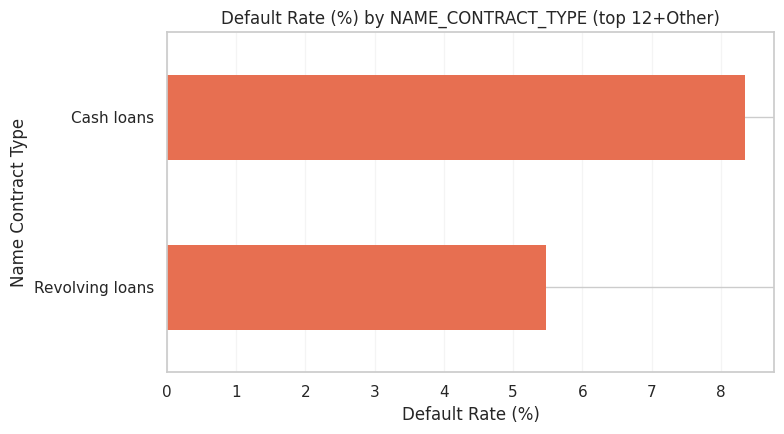

In [ ]:
# 1) NAME_CONTRACT_TYPE
plot_cat_vs_target(df_train, "NAME_CONTRACT_TYPE", target="TARGET", top_n=12)

Most of the applicants in the dataset have taken Cash loans, which make up nearly 90% of all applications, while only around 10% are for Revolving loans such as credit cards. When comparing repayment capability, the difference is noticeable: about 8.35% of Cash loan clients default, whereas the rate for Revolving loans is lower at 5.48%. This suggests that Cash loans are relatively riskier for the bank, possibly because they tend to involve larger amounts or fewer guarantees. On the other hand, Revolving loans, which are often smaller and more flexible, appear to be safer products in terms of repayment.

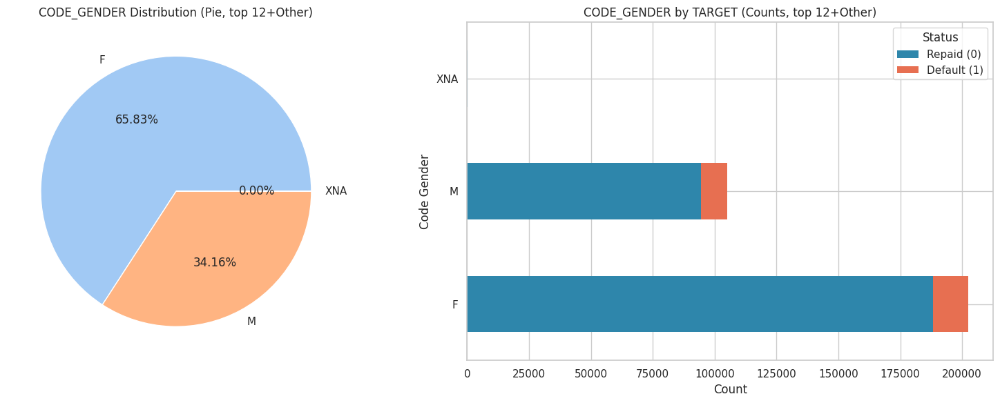


=== CODE_GENDER: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
CODE_GENDER,,,
F,188278,14170,202448
M,94404,10655,105059
XNA,4,0,4



=== CODE_GENDER: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
CODE_GENDER,,,
F,93.00,7.00,202448
M,89.86,10.14,105059
XNA,100.00,0.00,4



=== CODE_GENDER: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
CODE_GENDER,
M,10.14
F,7.00
XNA,0.00


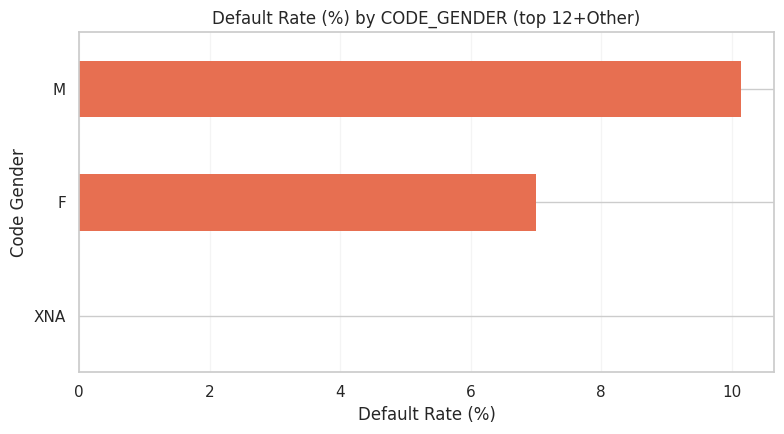

In [ ]:
# 2) CODE_GENDER
plot_cat_vs_target(df_train, "CODE_GENDER", target="TARGET", top_n=12)

Whereas Women took a total of 202K+ loans, Men only took 105K+ loans. However, at the same time, Men are relatively more likely to default compared to Women. Whereas Men are able to repay their loans in 10% of the cases, Women are only able to repay in 7% of the cases.

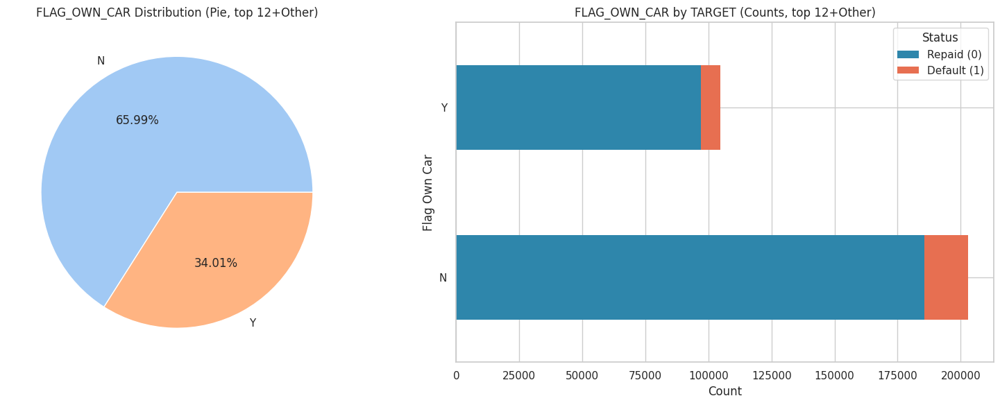


=== FLAG_OWN_CAR: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
FLAG_OWN_CAR,,,
N,185675,17249,202924
Y,97011,7576,104587



=== FLAG_OWN_CAR: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
FLAG_OWN_CAR,,,
N,91.50,8.50,202924
Y,92.76,7.24,104587



=== FLAG_OWN_CAR: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
FLAG_OWN_CAR,
N,8.50
Y,7.24


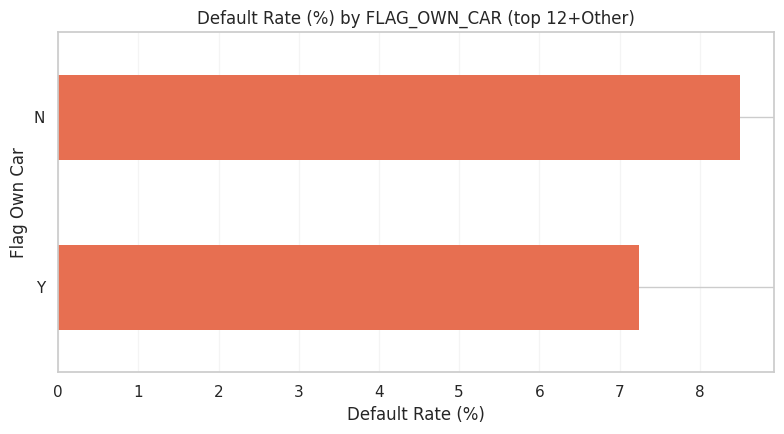

In [ ]:
# 2) FLAG_OWN_CAR
plot_cat_vs_target(df_train, "FLAG_OWN_CAR", target="TARGET", top_n=12)

Most of the applicants for loans do not own a car. However, there is not much difference in the loan repayment status for the customer based on this information (8.5% and 7.2% respectively). We can conclude that this feature is not very useful.

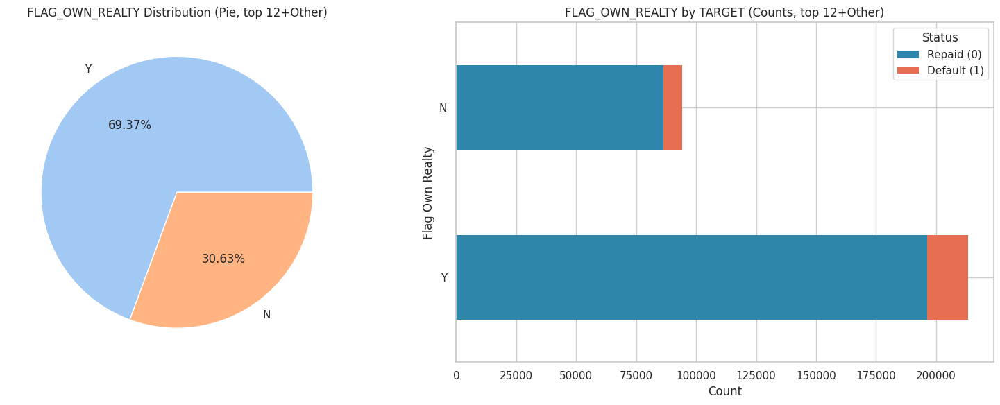


=== FLAG_OWN_REALTY: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
FLAG_OWN_REALTY,,,
N,86357,7842,94199
Y,196329,16983,213312



=== FLAG_OWN_REALTY: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
FLAG_OWN_REALTY,,,
N,91.68,8.32,94199
Y,92.04,7.96,213312



=== FLAG_OWN_REALTY: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
FLAG_OWN_REALTY,
N,8.32
Y,7.96


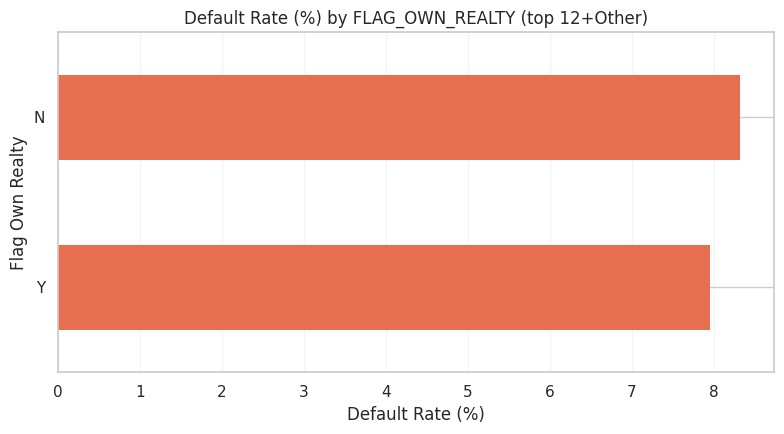

In [ ]:
# 3) FLAG_OWN_REALTY
plot_cat_vs_target(df_train, "FLAG_OWN_REALTY", target="TARGET", top_n=12)

Most of the applicants for loans own a flat/house, which is a little surprising. However, again, there is not much difference in the loan repayment status for the customer based on this information (7.9% and 8.3% respectively). We can conclude that this feature is not very useful.

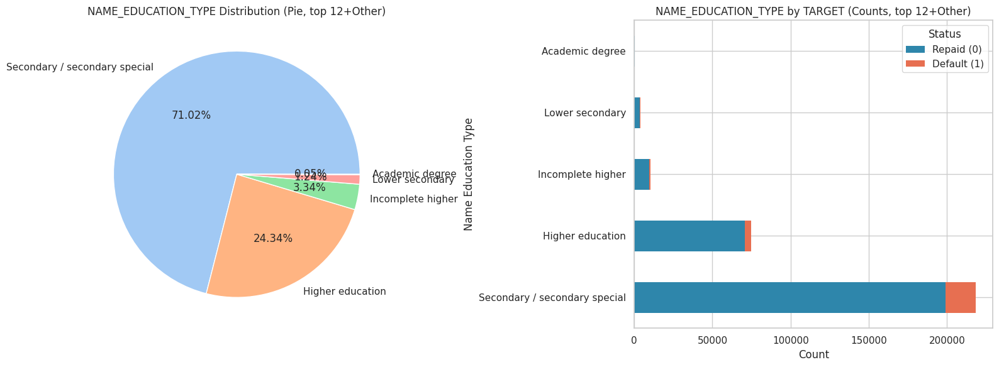


=== NAME_EDUCATION_TYPE: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
NAME_EDUCATION_TYPE,,,
Academic degree,161,3,164
Higher education,70854,4009,74863
Incomplete higher,9405,872,10277
Lower secondary,3399,417,3816
Secondary / secondary special,198867,19524,218391



=== NAME_EDUCATION_TYPE: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
NAME_EDUCATION_TYPE,,,
Academic degree,98.17,1.83,164
Higher education,94.64,5.36,74863
Incomplete higher,91.52,8.48,10277
Lower secondary,89.07,10.93,3816
Secondary / secondary special,91.06,8.94,218391



=== NAME_EDUCATION_TYPE: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
NAME_EDUCATION_TYPE,
Lower secondary,10.93
Secondary / secondary special,8.94
Incomplete higher,8.48
Higher education,5.36
Academic degree,1.83


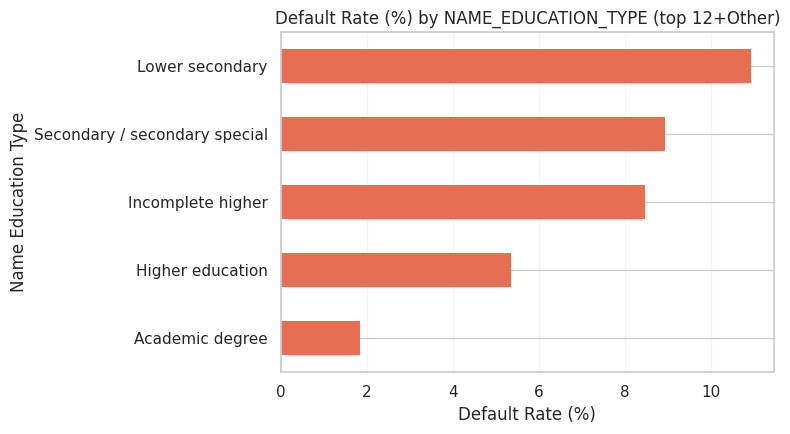

In [ ]:
# 4) NAME_EDUCATION_TYPE
plot_cat_vs_target(df_train, "NAME_EDUCATION_TYPE", target="TARGET", top_n=12)

Most applicants have Secondary education (71%), followed by Higher education (24%).

Default rates: Highest in Lower secondary (11%) and Secondary (8.9%), lowest in Higher education (5.4%) and Academic degree (1.8%).

Insight: Lower education links to higher credit risk, likely due to less stable jobs and income. Higher education indicates stronger repayment ability.

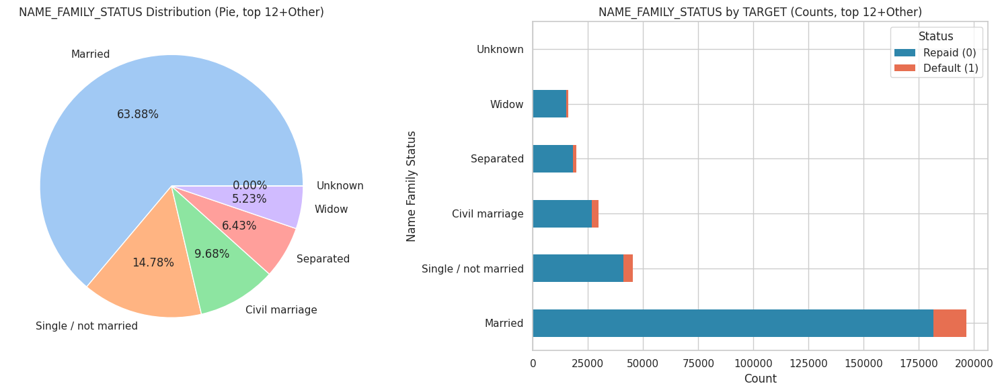


=== NAME_FAMILY_STATUS: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
NAME_FAMILY_STATUS,,,
Civil marriage,26814,2961,29775
Married,181582,14850,196432
Separated,18150,1620,19770
Single / not married,40987,4457,45444
Unknown,2,0,2
Widow,15151,937,16088



=== NAME_FAMILY_STATUS: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
NAME_FAMILY_STATUS,,,
Civil marriage,90.06,9.94,29775
Married,92.44,7.56,196432
Separated,91.81,8.19,19770
Single / not married,90.19,9.81,45444
Unknown,100.00,0.00,2
Widow,94.18,5.82,16088



=== NAME_FAMILY_STATUS: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
NAME_FAMILY_STATUS,
Civil marriage,9.94
Single / not married,9.81
Separated,8.19
Married,7.56
Widow,5.82
Unknown,0.00


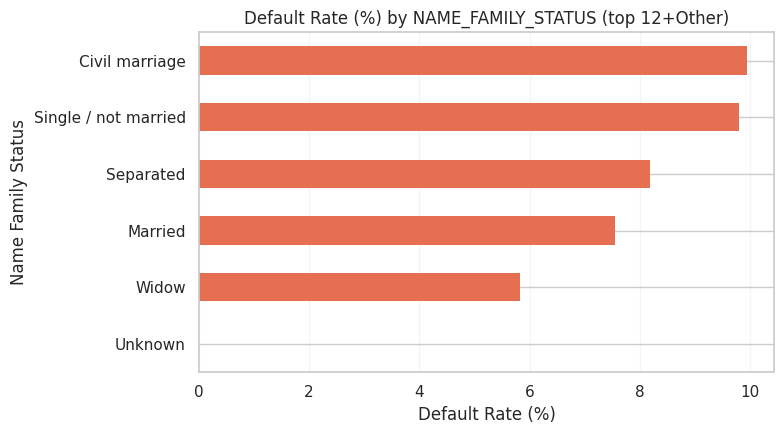

In [ ]:
# 5) NAME_FAMILY_STATUS
plot_cat_vs_target(df_train, "NAME_FAMILY_STATUS", target="TARGET", top_n=12)

When looking at marital status, Married applicants dominate the dataset, with over 198K loans, followed by those who are Single/not married and Civil marriage clients. Smaller groups include Separated and Widow applicants.

Default rates vary across categories. Clients with a Civil marriage or those Single/not married show the highest default rates (around 9.9%), while Widows are the least risky group, with only 5.8% default. Married applicants, despite being the majority, also have a relatively lower default rate of 7.6% compared to singles. This may indicate that marriage and widowhood bring more financial stability, while single or loosely partnered applicants carry a slightly higher repayment risk.

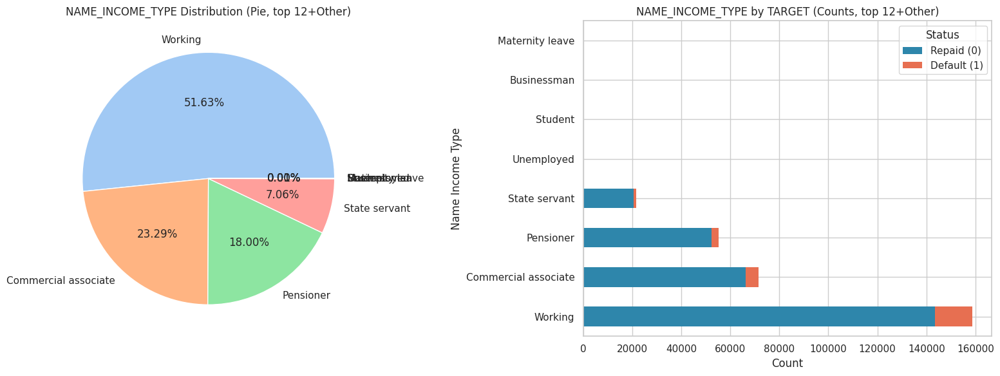


=== NAME_INCOME_TYPE: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
NAME_INCOME_TYPE,,,
Businessman,10,0,10
Commercial associate,66257,5360,71617
Maternity leave,3,2,5
Pensioner,52380,2982,55362
State servant,20454,1249,21703
Student,18,0,18
Unemployed,14,8,22
Working,143550,15224,158774



=== NAME_INCOME_TYPE: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
NAME_INCOME_TYPE,,,
Businessman,100.00,0.00,10
Commercial associate,92.52,7.48,71617
Maternity leave,60.00,40.00,5
Pensioner,94.61,5.39,55362
State servant,94.25,5.75,21703
Student,100.00,0.00,18
Unemployed,63.64,36.36,22
Working,90.41,9.59,158774



=== NAME_INCOME_TYPE: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
NAME_INCOME_TYPE,
Maternity leave,40.00
Unemployed,36.36
Working,9.59
Commercial associate,7.48
State servant,5.75
Pensioner,5.39
Businessman,0.00
Student,0.00


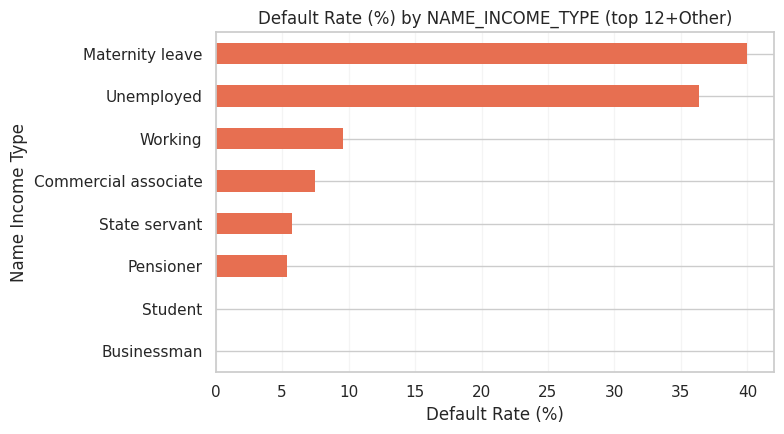

In [ ]:
# 6) NAME_INCOME_TYPE
plot_cat_vs_target(df_train, "NAME_INCOME_TYPE", target="TARGET", top_n=12)

Most of the loan applicants fall under the Working category, making up the majority with over 150K entries. Other significant groups include Commercial associates and Pensioners, while categories such as Students, Businessmen, and those on Maternity leave are extremely rare.

In terms of repayment, the differences are striking. Borrowers on Maternity leave and the Unemployed show the highest default rates (40% and 38% respectively), though their sample sizes are very small. For larger groups, Working clients have a default rate of around 9.6%, which is higher compared to Pensioners (5.4%) and State servants (5.8%). This suggests that retirees and government employees are more stable in terms of repayment, while active workers, despite being the largest group, represent higher risk. Interestingly, Students and Businessmen have a 0% default rate in this dataset, but this observation should be treated cautiously due to the extremely small sample sizes.

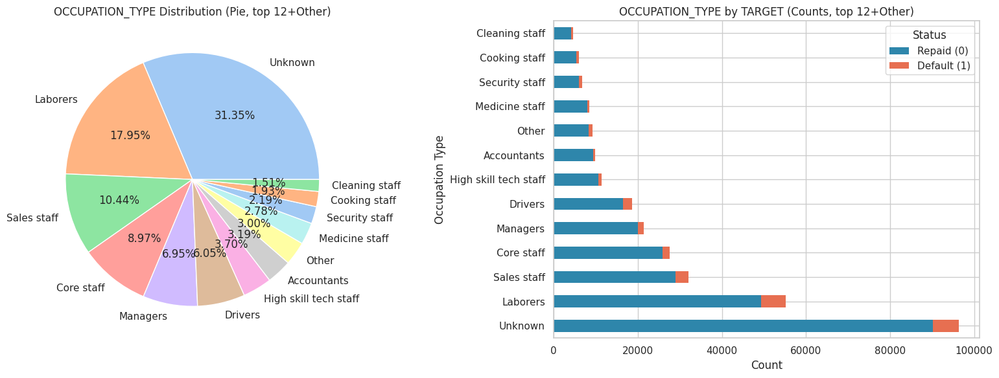


=== OCCUPATION_TYPE: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
OCCUPATION_TYPE,,,
Accountants,9339,474,9813
Cleaning staff,4206,447,4653
Cooking staff,5325,621,5946
Core staff,25832,1738,27570
Drivers,16496,2107,18603
HR staff,527,36,563
High skill tech staff,10679,701,11380
IT staff,492,34,526
Laborers,49348,5838,55186



=== OCCUPATION_TYPE: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
OCCUPATION_TYPE,,,
Accountants,95.17,4.83,9813
Cleaning staff,90.39,9.61,4653
Cooking staff,89.56,10.44,5946
Core staff,93.70,6.30,27570
Drivers,88.67,11.33,18603
HR staff,93.61,6.39,563
High skill tech staff,93.84,6.16,11380
IT staff,93.54,6.46,526
Laborers,89.42,10.58,55186



=== OCCUPATION_TYPE: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
OCCUPATION_TYPE,
Low-skill Laborers,17.15
Drivers,11.33
Waiters/barmen staff,11.28
Security staff,10.74
Laborers,10.58
Cooking staff,10.44
Sales staff,9.63
Cleaning staff,9.61
Realty agents,7.86


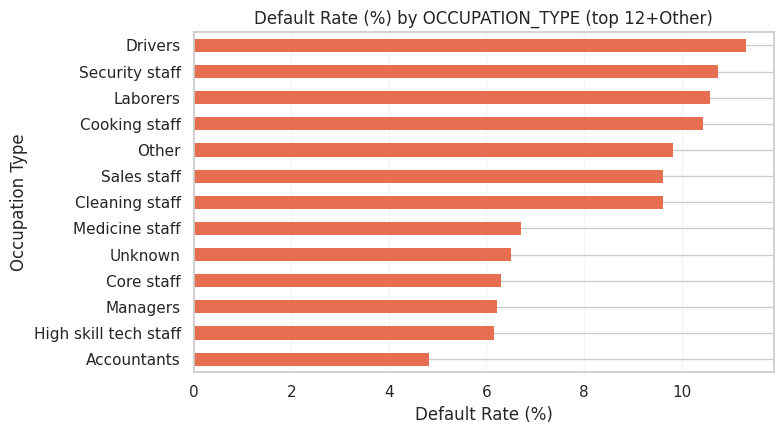

In [ ]:
# 7) OCCUPATION_TYPE  (many categories → top_n keeps plot readable)
plot_cat_vs_target(df_train, "OCCUPATION_TYPE", target="TARGET", top_n=12)

For the various types of people accompanying the client for loan, the client comes unaccompanied to the bank in the most number of cases, out of which approx. 92% of the time, the bank finds the client to be capable of loan repayment whereas the remaining 8% of the time, the client is not capable of the same. Both in capability and non capability, ‘Unknown’ as a class is the majority class in this case.

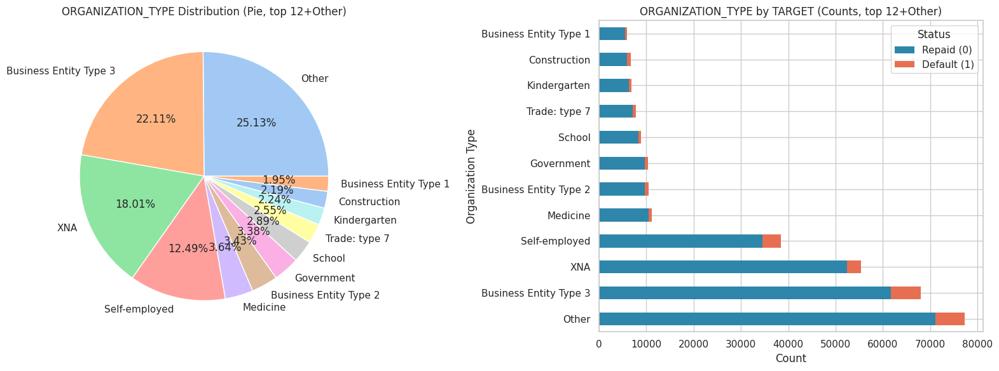


=== ORGANIZATION_TYPE: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
ORGANIZATION_TYPE,,,
Advertising,394,35,429
Agriculture,2197,257,2454
Bank,2377,130,2507
Business Entity Type 1,5497,487,5984
Business Entity Type 2,9653,900,10553
Business Entity Type 3,61669,6323,67992
Cleaning,231,29,260
Construction,5936,785,6721
Culture,358,21,379



=== ORGANIZATION_TYPE: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
ORGANIZATION_TYPE,,,
Advertising,91.84,8.16,429
Agriculture,89.53,10.47,2454
Bank,94.81,5.19,2507
Business Entity Type 1,91.86,8.14,5984
Business Entity Type 2,91.47,8.53,10553
Business Entity Type 3,90.70,9.30,67992
Cleaning,88.85,11.15,260
Construction,88.32,11.68,6721
Culture,94.46,5.54,379



=== ORGANIZATION_TYPE: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
ORGANIZATION_TYPE,
Transport: type 3,15.75
Industry: type 13,13.43
Industry: type 8,12.50
Restaurant,11.71
Construction,11.68
Cleaning,11.15
Industry: type 1,11.07
Industry: type 3,10.62
Realtor,10.61


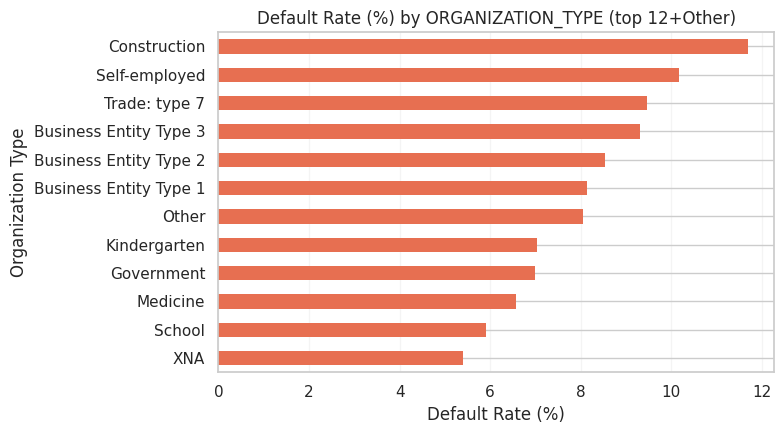

In [ ]:
# 8) ORGANIZATION_TYPE (many categories)
plot_cat_vs_target(df_train, "ORGANIZATION_TYPE", target="TARGET", top_n=12)

Applicants come from diverse sectors, with large groups in Business Entity Type 3, Self-employed, and XNA.

Default risk varies widely:

Highest-risk industries include Transport type 3 (15.8%), Industry type 13 (13.4%), and Restaurants/Construction (~11–12%), pointing to less stable income sectors.

Lowest-risk groups are in Universities (4.9%), Military/Police (~5%), and Trade type 4 (3.1%), reflecting more stable or government-backed jobs.

Overall, industry type is a strong indicator of repayment ability, with service-heavy and informal sectors showing higher default rate

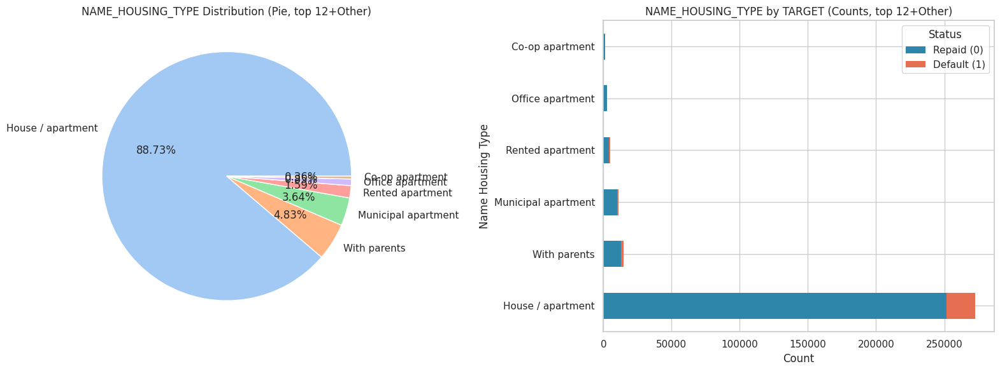


=== NAME_HOUSING_TYPE: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
NAME_HOUSING_TYPE,,,
Co-op apartment,1033,89,1122
House / apartment,251596,21272,272868
Municipal apartment,10228,955,11183
Office apartment,2445,172,2617
Rented apartment,4280,601,4881
With parents,13104,1736,14840



=== NAME_HOUSING_TYPE: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
NAME_HOUSING_TYPE,,,
Co-op apartment,92.07,7.93,1122
House / apartment,92.20,7.80,272868
Municipal apartment,91.46,8.54,11183
Office apartment,93.43,6.57,2617
Rented apartment,87.69,12.31,4881
With parents,88.30,11.70,14840



=== NAME_HOUSING_TYPE: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
NAME_HOUSING_TYPE,
Rented apartment,12.31
With parents,11.70
Municipal apartment,8.54
Co-op apartment,7.93
House / apartment,7.80
Office apartment,6.57


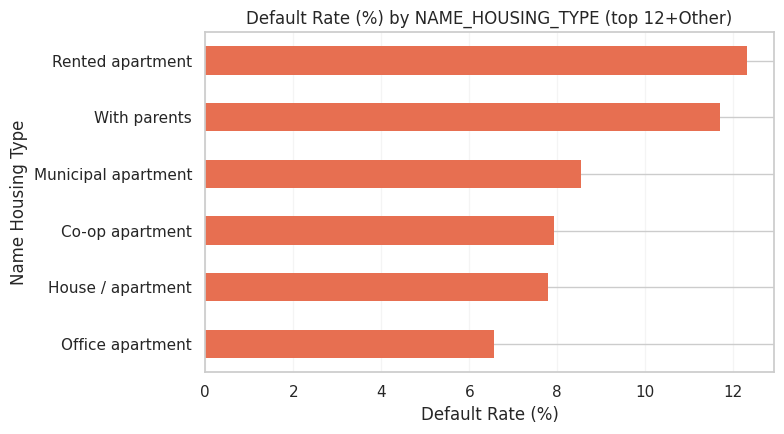

In [ ]:
# 4) NAME_EDUCATION_TYPE
plot_cat_vs_target(df_train, "NAME_HOUSING_TYPE", target="TARGET", top_n=12)

Riskier groups are renters (12.3% default) and those living with parents (11.7%). These clients may have less financial stability or lower disposable income, as they don’t have long-term housing assets. For banks, this implies higher risk when lending to applicants without property ownership, since housing can often serve as a proxy for wealth and collateral.

By contrast, applicants in office apartments (6.6% default) or those who already own housing are more reliable.

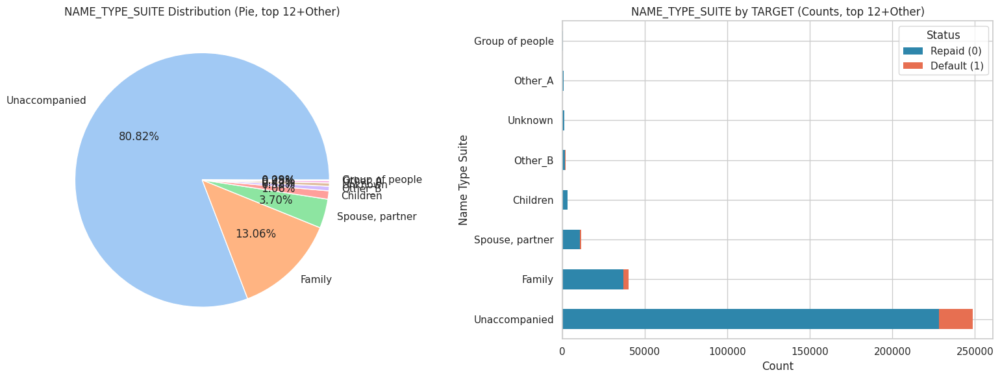


=== NAME_TYPE_SUITE: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
NAME_TYPE_SUITE,,,
Children,3026,241,3267
Family,37140,3009,40149
Group of people,248,23,271
Other_A,790,76,866
Other_B,1596,174,1770
"Spouse, partner",10475,895,11370
Unaccompanied,228189,20337,248526
Unknown,1222,70,1292



=== NAME_TYPE_SUITE: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
NAME_TYPE_SUITE,,,
Children,92.62,7.38,3267
Family,92.51,7.49,40149
Group of people,91.51,8.49,271
Other_A,91.22,8.78,866
Other_B,90.17,9.83,1770
"Spouse, partner",92.13,7.87,11370
Unaccompanied,91.82,8.18,248526
Unknown,94.58,5.42,1292



=== NAME_TYPE_SUITE: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
NAME_TYPE_SUITE,
Other_B,9.83
Other_A,8.78
Group of people,8.49
Unaccompanied,8.18
"Spouse, partner",7.87
Family,7.49
Children,7.38
Unknown,5.42


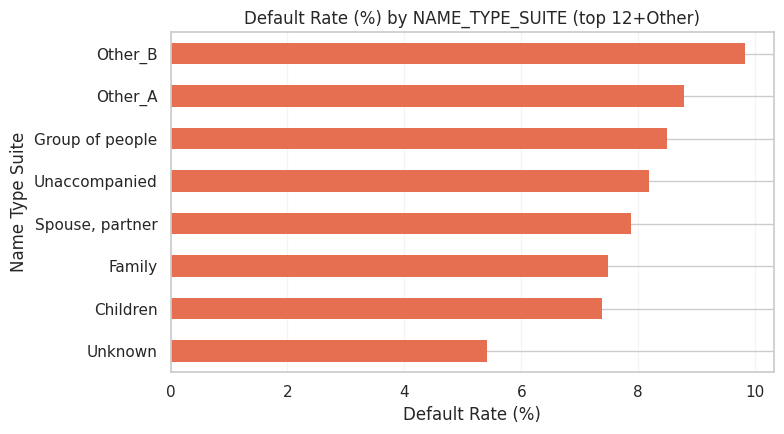

In [ ]:
# 4) NAME_EDUCATION_TYPE
plot_cat_vs_target(df_train, "NAME_TYPE_SUITE", target="TARGET", top_n=12)

The majority of clients apply unaccompanied (~249K), showing that loan applications are often an individual decision. Family or spouse accompaniment is less common, while “Other” categories are rare.

Clients in the “Other_B” group (9.8% default) and “Other_A” group (8.8%) are more risky. This could indicate less traditional or less transparent household structures, which may reduce accountability or shared financial responsibility.

By contrast, those who come with family or spouse default less (~7–8%), perhaps because family support creates added financial discipline.

Implication: while not the strongest predictor, the presence (or absence) of family support could hint at repayment reliability.

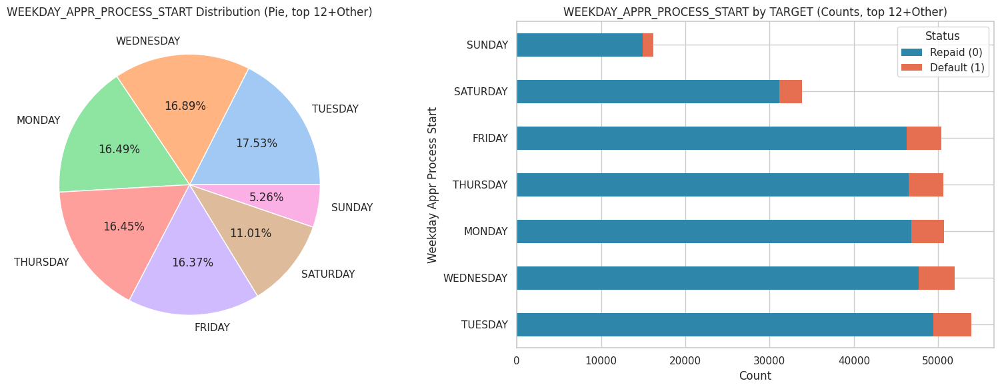


=== WEEKDAY_APPR_PROCESS_START: Counts of TARGET by category (FULL, with totals) ===


TARGET,Repaid (0),Default (1),_Total_
WEEKDAY_APPR_PROCESS_START,,,
FRIDAY,46237,4101,50338
MONDAY,46780,3934,50714
SATURDAY,31182,2670,33852
SUNDAY,14898,1283,16181
THURSDAY,46493,4098,50591
TUESDAY,49400,4501,53901
WEDNESDAY,47696,4238,51934



=== WEEKDAY_APPR_PROCESS_START: Percentage of TARGET by category (row-wise, FULL, with totals) ===


TARGET,Repaid (0) %,Default (1) %,_Total_
WEEKDAY_APPR_PROCESS_START,,,
FRIDAY,91.85,8.15,50338
MONDAY,92.24,7.76,50714
SATURDAY,92.11,7.89,33852
SUNDAY,92.07,7.93,16181
THURSDAY,91.90,8.10,50591
TUESDAY,91.65,8.35,53901
WEDNESDAY,91.84,8.16,51934



=== WEEKDAY_APPR_PROCESS_START: Default Rate (TARGET=1, %, FULL) ===


,Default Rate (%)
WEEKDAY_APPR_PROCESS_START,
TUESDAY,8.35
WEDNESDAY,8.16
FRIDAY,8.15
THURSDAY,8.10
SUNDAY,7.93
SATURDAY,7.89
MONDAY,7.76


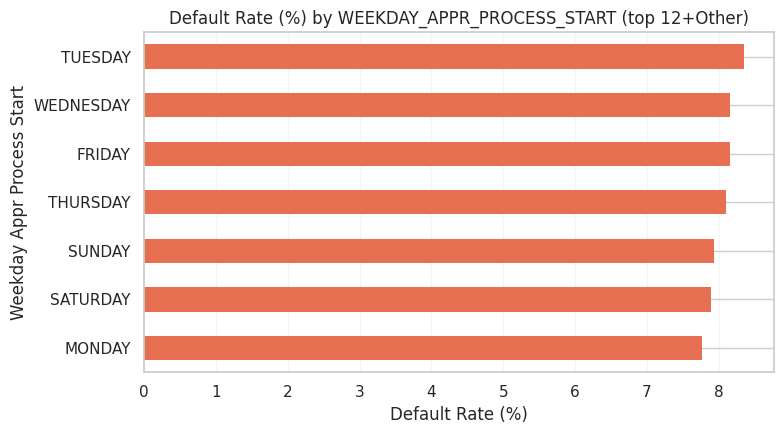

In [ ]:
# 4) NAME_EDUCATION_TYPE
plot_cat_vs_target(df_train, "WEEKDAY_APPR_PROCESS_START", target="TARGET", top_n=12)

Applications are distributed fairly evenly across the week, with slightly more volume on Tuesdays and Wednesdays.

Default rates are fairly stable (7.8%–8.3%), with Tuesday applicants showing the highest default rate (8.35%). While this is not a strong effect, it could reflect operational or client behavior patterns (e.g., certain groups applying mid-week may be higher risk).

Since the differences are small, the day of application is not a strong predictor. But banks might still note that operational scheduling (like campaigns or office opening times) can slightly skew the risk profile of applicants on certain days.

### 2.3.2 Application – Numerical Columns

In [ ]:
num_cols

['SK_ID_CURR',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 

In [ ]:
def plot_univariate_numeric(data, col, target_col="TARGET", bins=50, log_scale=False):
    d = data[[col, target_col]].dropna().copy()

    # Convert target to string for consistent palette mapping
    d[target_col] = d[target_col].astype(str)
    palette = {"0": "#2E86AB", "1": "#E76F51"}

    fig, axs = plt.subplots(1, 2, figsize=(16, 6))

    # 1) Boxplot
    sns.boxplot(data=d, x=target_col, y=col, ax=axs[0], palette=palette)
    axs[0].set_title(f"{col} by {target_col}")
    axs[0].set_xlabel(target_col)
    axs[0].set_ylabel(col)
    if log_scale:
        axs[0].set_yscale("log")

    # 2) Histogram + KDE
    sns.histplot(data=d, x=col, hue=target_col, bins=bins, kde=True,
                 palette=palette, stat="density", ax=axs[1])
    axs[1].set_title(f"Distribution of {col} by {target_col}")
    axs[1].set_xlabel(col)
    axs[1].set_ylabel("Density")
    if log_scale:
        axs[1].set_xscale("log")

    plt.tight_layout()
    plt.show()

/tmp/ipython-input-3360026169.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=d, x=target_col, y=col, ax=axs[0], palette=palette)


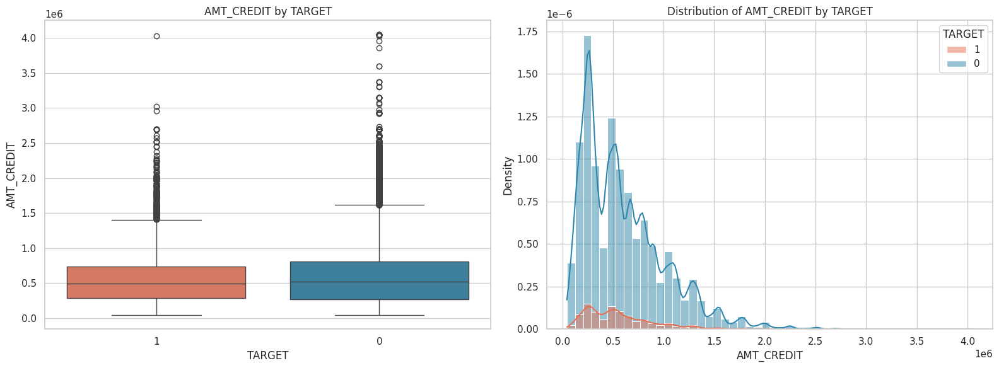

In [ ]:
# Credit amount
plot_univariate_numeric(df_train, 'AMT_CREDIT', target_col='TARGET', bins=50)

The distribution is right-skewed, with most loans falling under 1M, though some extreme outliers reach 4M.

From the boxplot, we see that defaulted clients (TARGET=1) generally borrow smaller amounts compared to those who repay. The median credit amount for defaulters is lower.

This suggests that higher loan size does not necessarily mean higher default risk. In fact, clients taking larger loans may be wealthier or more financially stable, while those taking smaller loans might represent riskier borrowers with less capacity to repay.

Implication: Loan size alone is not a risk factor but must be combined with income and repayment capacity features (like AMT_INCOME_TOTAL or ANNUITY) to create a debt-to-income ratio, which will likely be a stronger predictor.

/tmp/ipython-input-3360026169.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=d, x=target_col, y=col, ax=axs[0], palette=palette)


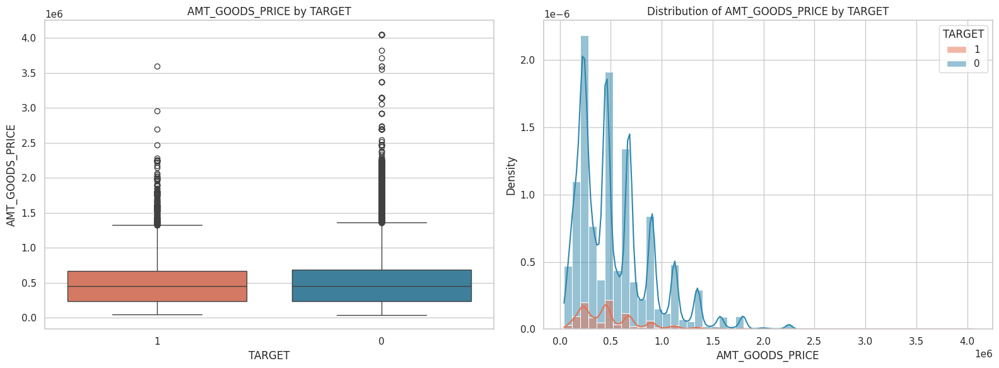

In [ ]:
# Goods price
plot_univariate_numeric(df_train, 'AMT_GOODS_PRICE', target_col='TARGET', bins=50)

Very similar distribution to AMT_CREDIT, which is expected since the price of goods is usually close to the credit amount.

Defaults are again concentrated at lower-priced goods, while higher-value goods tend to be linked with repaid loans.

This could indicate that smaller consumer purchases (cheaper goods) are riskier compared to large purchases (e.g., cars, property, expensive electronics), where clients might have higher financial standing.

Implication: Like credit amount, this variable on its own is weak. But when combined into ratios (e.g., loan-to-value) or with external features, it can reveal more meaningful insights into credit risk.

/tmp/ipython-input-3360026169.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=d, x=target_col, y=col, ax=axs[0], palette=palette)


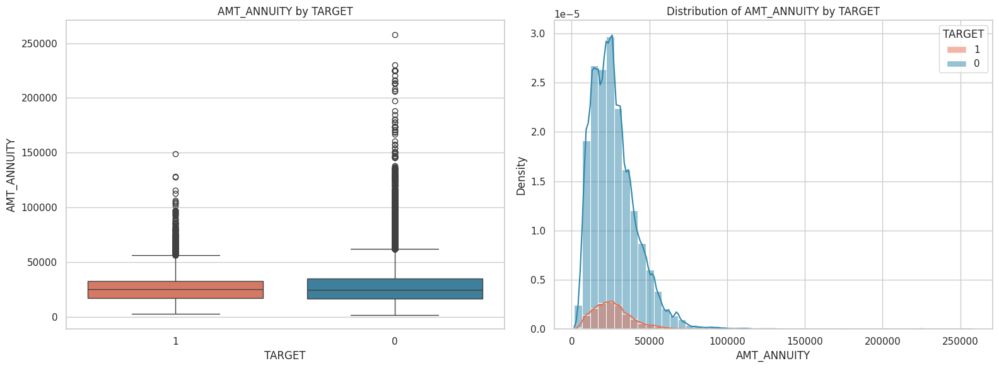

In [ ]:
# Goods price
plot_univariate_numeric(df_train, 'AMT_ANNUITY', target_col='TARGET', bins=50)

Annuity payments are also skewed, with most clustered below 50K. Outliers reach over 200K.

Defaulters typically have lower annuity amounts, similar to the pattern seen with loan size. Clients with higher annuities are less likely to default, which may reflect that wealthier or more stable borrowers take larger, structured loans.

This reinforces the idea that financial ratios (annuity/income, credit/annuity) provide more useful signals than raw amounts.

/tmp/ipython-input-3360026169.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=d, x=target_col, y=col, ax=axs[0], palette=palette)


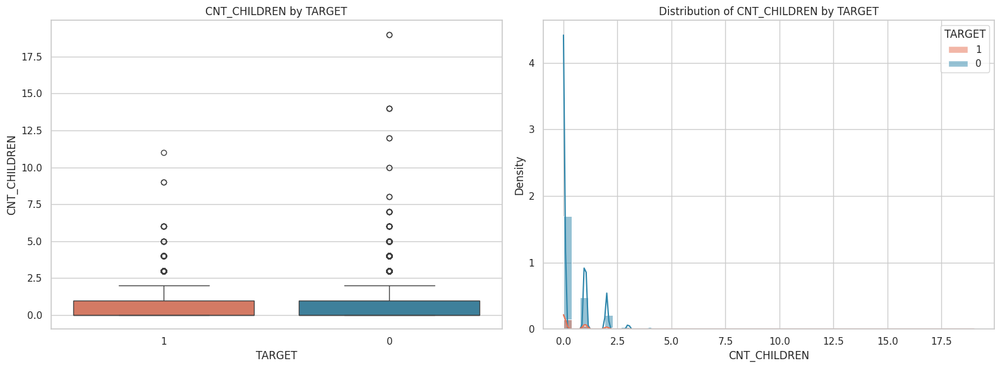

In [ ]:
# Goods price
plot_univariate_numeric(df_train, 'CNT_CHILDREN', target_col='TARGET', bins=50)

The vast majority of applicants have no children; those with more than 3 children are rare, with some extreme outliers (up to 19 children).

Default rates do not vary significantly across small numbers of children, but families with more children tend to show slightly higher risk.

This pattern makes sense: more dependents usually increase financial burden, reducing disposable income and repayment flexibility. However, because most applicants have 0–1 children, this feature may have limited predictive power unless combined with income.

/tmp/ipython-input-3360026169.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=d, x=target_col, y=col, ax=axs[0], palette=palette)


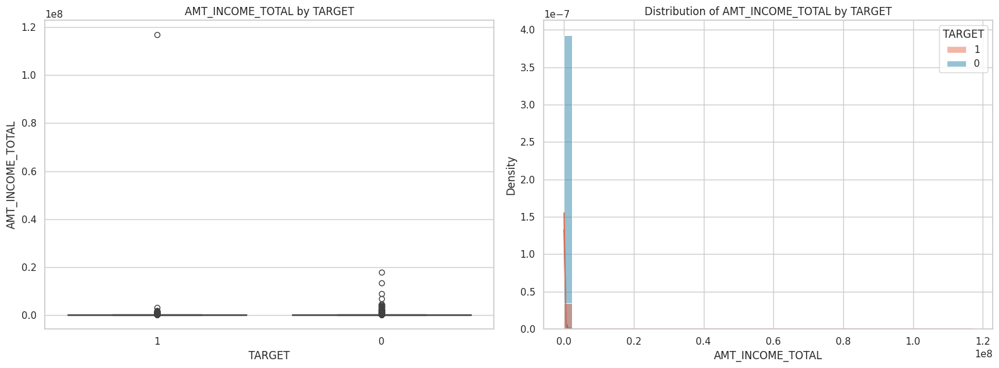

In [ ]:
# Goods price
plot_univariate_numeric(df_train, 'AMT_INCOME_TOTAL', target_col='TARGET', bins=50)

The income distribution is heavily skewed, with most applicants earning under ~1M per year, but extreme outliers exist (up to 100M+).

Surprisingly, there isn’t a clear separation in income levels between defaulters and repayers. Some high-income clients still default, while many low-income clients repay.

This suggests that raw income alone is not a strong predictor of default. The real insight will come from ratios such as loan-to-income or annuity-to-income, which better reflect repayment capacity relative to earnings.

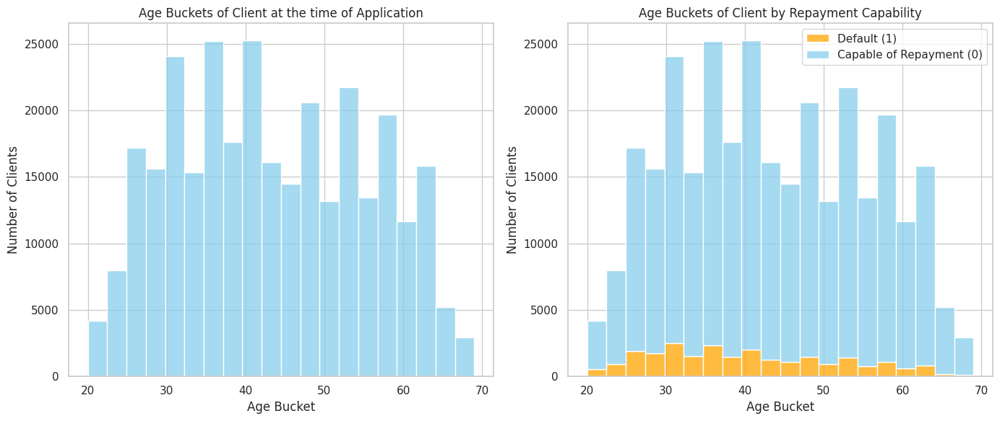

In [ ]:
# Create age variable
df_train['AGE_YEARS'] = (-df_train['DAYS_BIRTH'] / 365).astype(int)

plt.figure(figsize=(14,6))

# Left: all clients
plt.subplot(1,2,1)
sns.histplot(df_train['AGE_YEARS'], bins=20, color="skyblue")
plt.title("Age Buckets of Client at the time of Application")
plt.xlabel("Age Bucket")
plt.ylabel("Number of Clients")

# Right: split by repayment status
plt.subplot(1,2,2)
sns.histplot(df_train, x='AGE_YEARS', hue='TARGET', bins=20,
             multiple="stack", palette={0:"skyblue",1:"orange"})
plt.title("Age Buckets of Client by Repayment Capability")
plt.xlabel("Age Bucket")
plt.ylabel("Number of Clients")
plt.legend(["Default (1)", "Capable of Repayment (0)"])

plt.tight_layout()
plt.show()


The dataset covers applicants from their early 20s to late 60s. The largest groups are between 30 and 45 years old, which is a typical age range for borrowing (family building, housing, etc.).

Looking at repayment, younger clients (20s–early 30s) have visibly higher default rates, while defaults decrease steadily with age. Clients over 50–55 show much fewer defaults relative to their population size.

This happens because younger borrowers may have less stable income, shorter credit histories, and higher lifestyle expenses, making them more vulnerable to default. Older clients, particularly those in their 40s–60s, often have established careers, assets, and more financial discipline, which reduces their risk.

This implies that age is a strong predictor of credit risk. Models should capture this relationship, but care must be taken not to introduce bias or discrimination. Instead, combining age with employment type, income, and family status helps explain the financial stability behind this effect.

In [ ]:
def plot_ext_source_like_original(df, col, target_col='TARGET', bins=30):
    # keep only valid 0..1 values and non-null target
    d = df[[col, target_col]].dropna()
    d = d[(d[col] >= 0) & (d[col] <= 1)]

    palette = {0: 'black', 1: 'red'}
    order   = [0, 1]
    label_map = {'0': 'Capable of Repayment (0)',
                 '1': 'Not Capable of Repayment (1)'}

    plt.figure(figsize=(14,6))

    # Left: KDE by TARGET (lines, no fill)
    ax1 = plt.subplot(1,2,1)
    sns.kdeplot(data=d, x=col, hue=target_col, hue_order=order,
                palette=palette, fill=False, common_norm=False, ax=ax1)
    ax1.set_title(f"Distribution of {col} by {target_col}")
    ax1.set_xlabel(col)
    ax1.set_ylabel("Density")

    h, lab = ax1.get_legend_handles_labels()
    plt.legend(["Default (1)", "Capable of Repayment (0)"])

    # Right: Histogram stacked by TARGET (counts)
    ax2 = plt.subplot(1,2,2)
    sns.histplot(data=d, x=col, bins=bins, hue=target_col, hue_order=order,
                 multiple='stack', palette=palette, stat='count', edgecolor=None, ax=ax2)
    ax2.set_title(f"Histogram of {col} (stacked by {target_col})")
    ax2.set_xlabel(col)
    ax2.set_ylabel("Number of Clients")

    h2, lab2 = ax2.get_legend_handles_labels()
    plt.legend(["Default (1)", "Capable of Repayment (0)"])

    plt.tight_layout()
    plt.show()


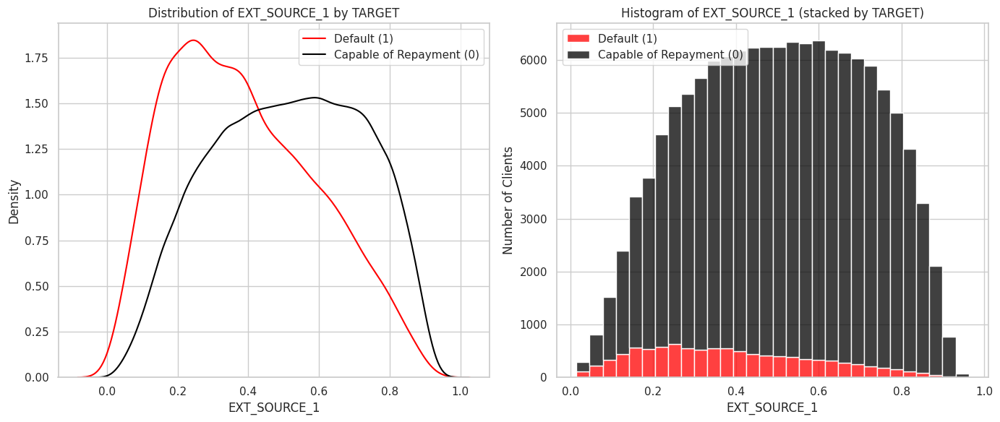

In [ ]:
plot_ext_source_like_original(df_train, 'EXT_SOURCE_1', target_col='TARGET')

Clients with lower EXT_SOURCE_1 scores (<0.3) are much more likely to default, while higher scores correlate strongly with repayment.

This variable behaves like an external credit score or risk rating: higher values indicate better creditworthiness.

Implication: EXT_SOURCE_1 is a very strong predictor. Including it in models will significantly improve default detection, but reliance on it should be balanced with other features in case of missing values.

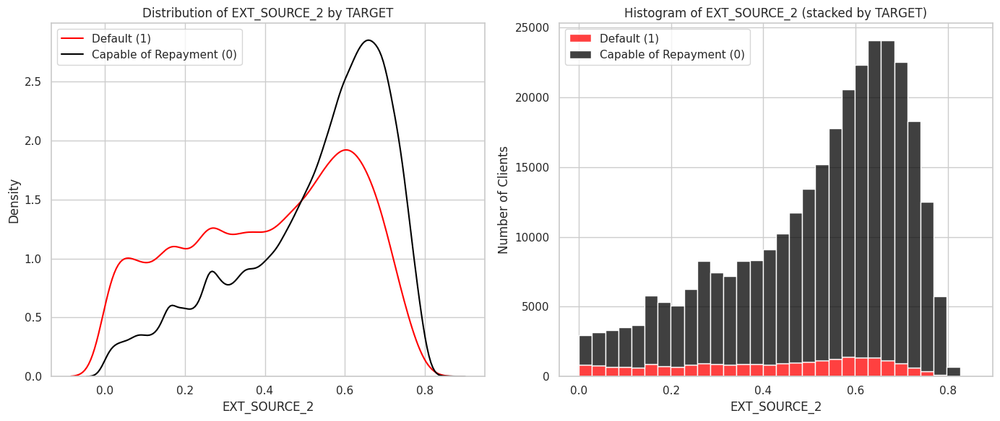

In [ ]:
plot_ext_source_like_original(df_train, 'EXT_SOURCE_2', target_col='TARGET')

The pattern is even clearer here: defaulters concentrate heavily at low scores (0–0.4), while clients with scores >0.6 rarely default.

The separation between defaulters and non-defaulters is stronger than EXT_SOURCE_1, suggesting EXT_SOURCE_2 may be the most predictive among the three.

Implication: This variable likely represents a robust external risk index. It should rank very high in feature importance, and missing values must be handled carefully (imputation strategy).

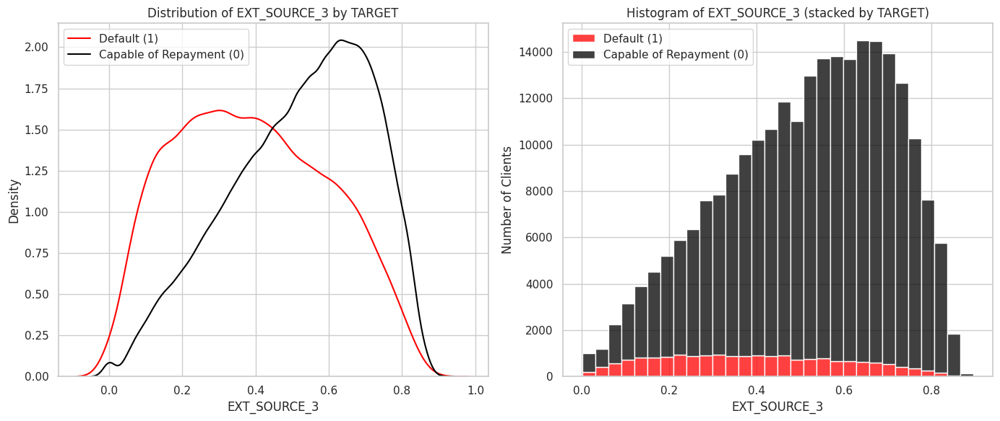

In [ ]:
plot_ext_source_like_original(df_train, 'EXT_SOURCE_3', target_col='TARGET')

Similar to the other two: defaults are clustered at low scores (<0.4), while repayment is strongly associated with higher scores.

The separation is clear but slightly less sharp than EXT_SOURCE_2.

Implication: EXT_SOURCE_3 complements the other sources, and combining all three gives a composite risk profile that captures external creditworthiness from different scoring models.

## 2.3.3 Bureau

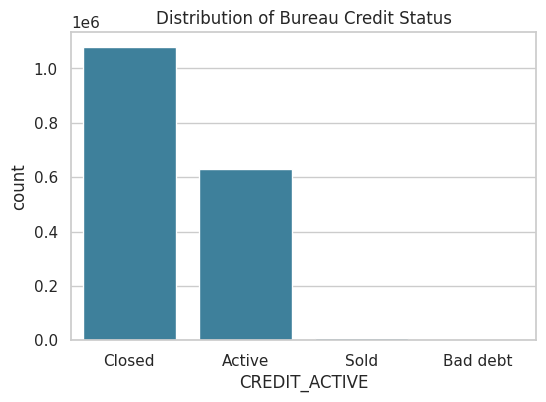

In [ ]:
# Active vs closed credits
plt.figure(figsize=(6,4))
sns.countplot(data=bureau, x="CREDIT_ACTIVE",
              order=bureau["CREDIT_ACTIVE"].value_counts().index,
              color="#2E86AB")
plt.title("Distribution of Bureau Credit Status")
plt.show()

Most bureau records are for closed credits, followed by active credits. Very few are marked as “bad debt” or “sold”.

This suggests many applicants already had borrowing history, but relatively few had serious delinquency records.

Implication: Active credit balances may still affect repayment ability, while past closure history shows overall credit experience.

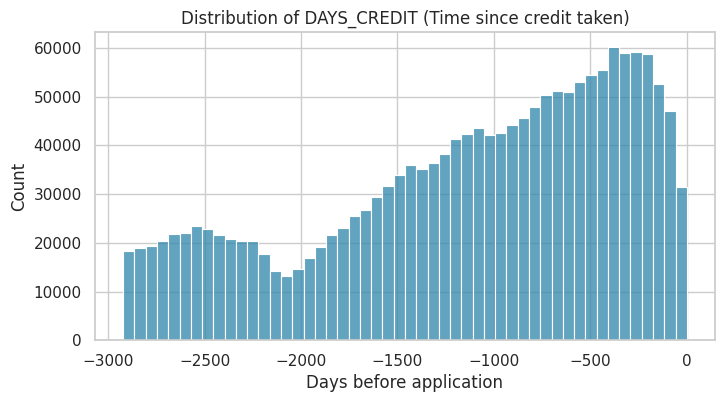

In [ ]:
# Days since credit taken
plt.figure(figsize=(8,4))
sns.histplot(bureau["DAYS_CREDIT"], bins=50, kde=False, color="#2E86AB")
plt.title("Distribution of DAYS_CREDIT (Time since credit taken)")
plt.xlabel("Days before application")
plt.show()

Most credit records were opened within the last 500–1000 days before application.

Fewer records exist for credits older than ~2000 days, suggesting that recent credit history dominates the risk profile.

Implication: Recency of credit usage is an important behavioral indicator; more recent and frequent borrowing may signal higher dependency on credit.

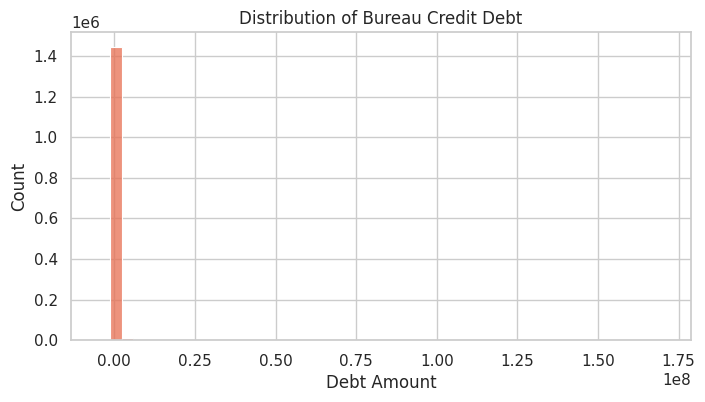

In [ ]:
# Total debt distribution
plt.figure(figsize=(8,4))
sns.histplot(bureau["AMT_CREDIT_SUM_DEBT"].dropna(), bins=50, kde=False, color="#E76F51")
plt.title("Distribution of Bureau Credit Debt")
plt.xlabel("Debt Amount")
plt.show()

The distribution is extremely skewed, with most clients having low or zero outstanding debt, while a small minority carry very large debts (outliers in millions).

Implication: While most borrowers manage debt moderately, those with unusually high outstanding balances represent concentrated risk.

## 2.3.4 Bureau Balance

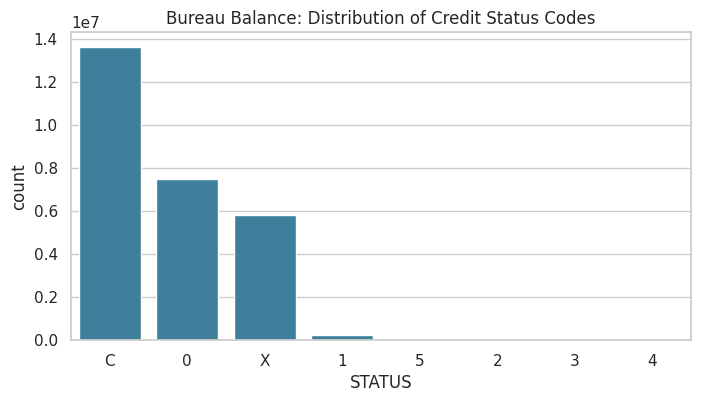

In [ ]:
# Status of credits over months
plt.figure(figsize=(8,4))
sns.countplot(data=bureau_balance, x="STATUS",
              order=bureau_balance["STATUS"].value_counts().index,
              color="#2E86AB")
plt.title("Bureau Balance: Distribution of Credit Status Codes")
plt.show()

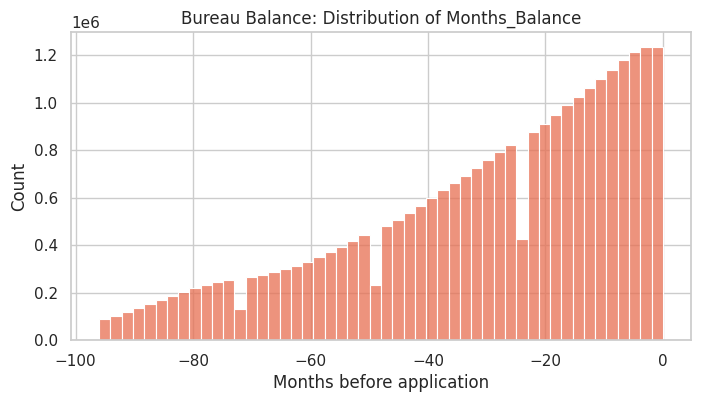

In [ ]:
# Months balance distribution
plt.figure(figsize=(8,4))
sns.histplot(bureau_balance["MONTHS_BALANCE"], bins=50, color="#E76F51")
plt.title("Bureau Balance: Distribution of Months_Balance")
plt.xlabel("Months before application")
plt.show()

Most credit statuses are “C” (closed) or “0” (no DPD/delays), while only a small share are “1–5” (past due).

The timeline (MONTHS_BALANCE) shows that most bureau records cover the last 2–5 years, with recent activity being more heavily represented.

Implication: Bureau balance confirms that most clients keep accounts current, but delinquency codes, even if rare, could be strong predictors of default.

## 2.3.5 Previous Applications

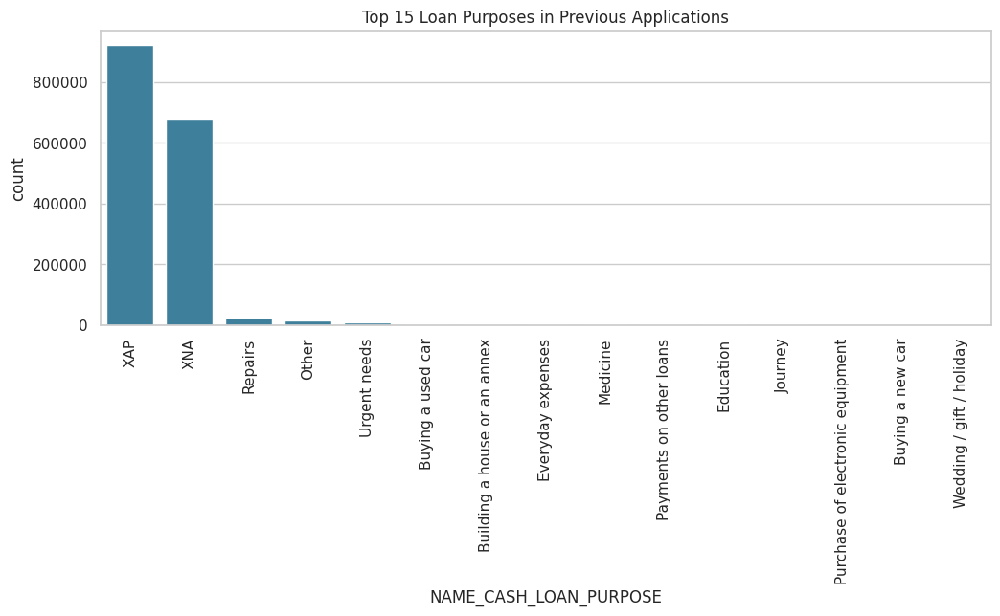

In [ ]:
# Loan purpose
plt.figure(figsize=(12,4))
sns.countplot(data=previous_application,
              x="NAME_CASH_LOAN_PURPOSE",
              order=previous_application["NAME_CASH_LOAN_PURPOSE"].value_counts().head(15).index,
              color="#2E86AB")
plt.xticks(rotation=90)
plt.title("Top 15 Loan Purposes in Previous Applications")
plt.show()


A majority of previous applications fall into broad categories like “XAP” and “XNA”, which appear to be missing or generic labels.

For interpretable categories, purposes include repairs, urgent needs, buying used cars, everyday expenses, education, and weddings/holidays.

Implication: Previous loan purpose provides behavioral context — clients borrowing for consumption (urgent needs, holidays) may carry higher risk compared to those borrowing for productive or asset-based purposes (cars, housing, education).

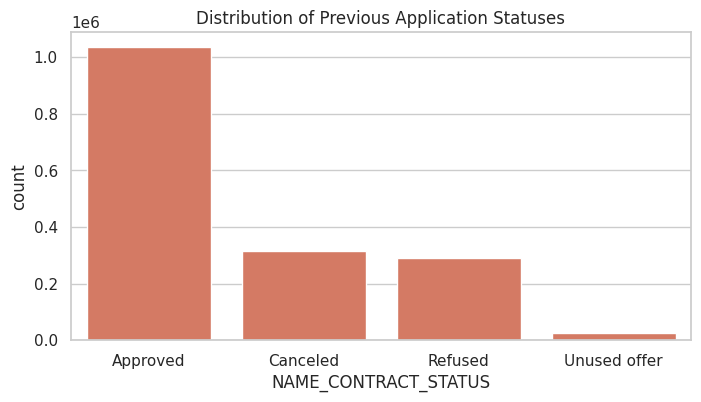

In [ ]:

# Application status
plt.figure(figsize=(8,4))
sns.countplot(data=previous_application, x="NAME_CONTRACT_STATUS",
              order=previous_application["NAME_CONTRACT_STATUS"].value_counts().index,
              color="#E76F51")
plt.title("Distribution of Previous Application Statuses")
plt.show()

Most past applications were Approved, while a notable share were Canceled or Refused.

Rejections and cancellations may serve as early warning indicators: clients with more failed past applications could be higher risk.

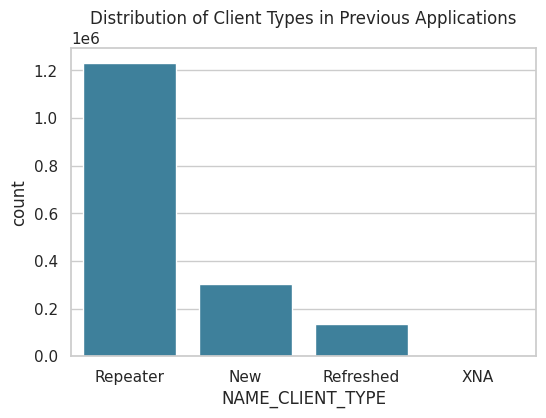

In [ ]:
# Client type
plt.figure(figsize=(6,4))
sns.countplot(data=previous_application, x="NAME_CLIENT_TYPE",
              order=previous_application["NAME_CLIENT_TYPE"].value_counts().index,
              color="#2E86AB")
plt.title("Distribution of Client Types in Previous Applications")
plt.show()

The majority are Repeaters (already had loans), followed by New and Refreshed clients.

Implication: Repeat borrowers dominate the dataset, so repayment patterns from this group are critical. New clients may be harder to assess due to lack of history.

2.3.6 POS Cash

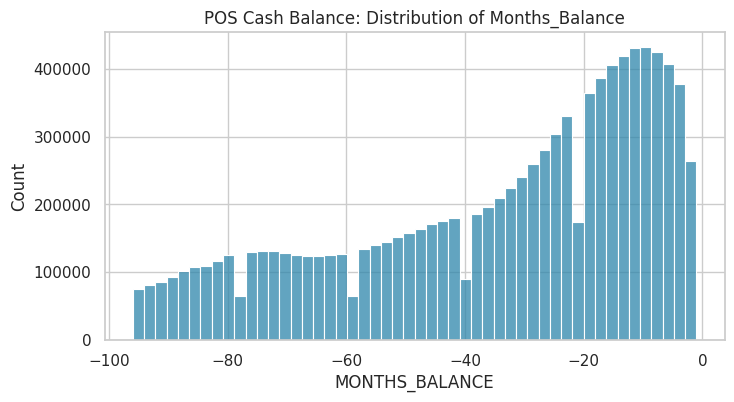

In [ ]:
# Months balance
plt.figure(figsize=(8,4))
sns.histplot(POS_CASH_balance["MONTHS_BALANCE"], bins=50, color="#2E86AB")
plt.title("POS Cash Balance: Distribution of Months_Balance")
plt.show()

Records go back around 100 months, with more data concentrated in the last 2–3 years.

Implication: More recent POS loan behavior will likely carry stronger predictive power.

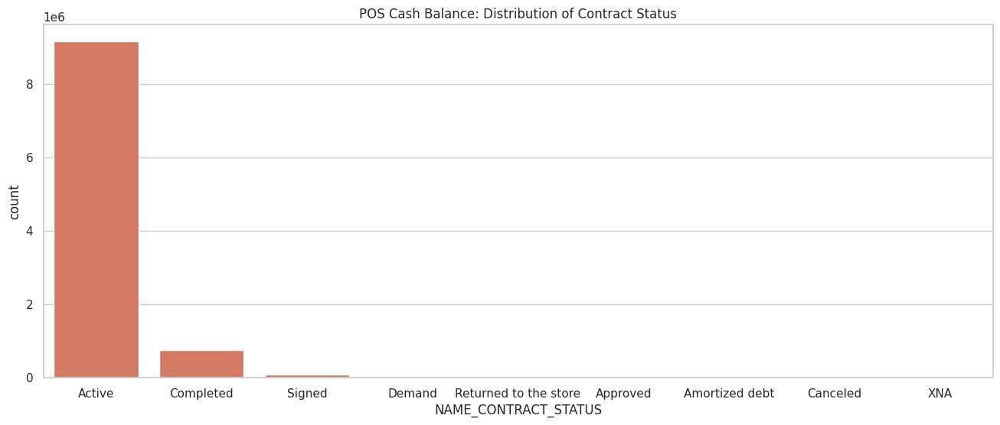

In [ ]:
# Contract status
plt.figure(figsize=(16,6))
sns.countplot(data=POS_CASH_balance, x="NAME_CONTRACT_STATUS",
              order=POS_CASH_balance["NAME_CONTRACT_STATUS"].value_counts().index,
              color="#E76F51")
plt.title("POS Cash Balance: Distribution of Contract Status")
plt.show()

Vast majority are Active, with a smaller fraction completed.

Since most POS loans are still open, their repayment progress is relevant. Categories like “Amortized debt” or “Demand” are rare → not very informative.

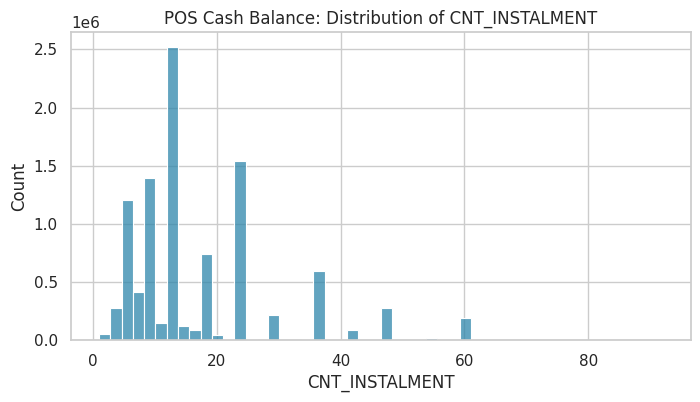

In [ ]:
# Number of installments
plt.figure(figsize=(8,4))
sns.histplot(POS_CASH_balance["CNT_INSTALMENT"].dropna(), bins=50, color="#2E86AB")
plt.title("POS Cash Balance: Distribution of CNT_INSTALMENT")
plt.show()

Most loans are structured with short installment plans (1–12 months), but some extend much longer.

Implication: Loan structure length may influence repayment discipline; however, defaults appear across all ranges.

## 2.3.7 Installments Payments

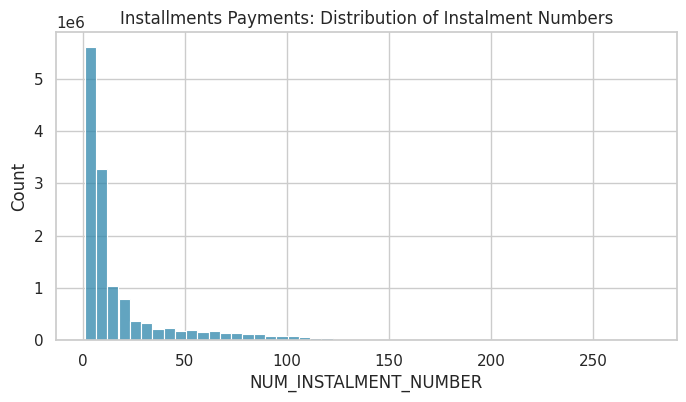

In [ ]:
# Installment count
plt.figure(figsize=(8,4))
sns.histplot(installments_payments["NUM_INSTALMENT_NUMBER"], bins=50, color="#2E86AB")
plt.title("Installments Payments: Distribution of Instalment Numbers")
plt.show()

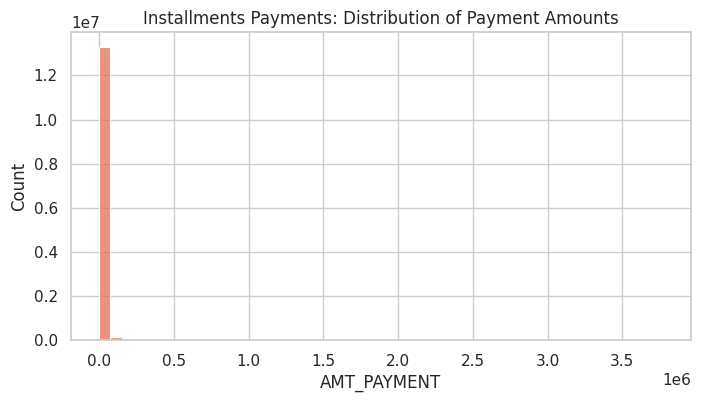

In [ ]:
# Payment amount
plt.figure(figsize=(8,4))
sns.histplot(installments_payments["AMT_PAYMENT"].dropna(), bins=50, color="#E76F51")
plt.title("Installments Payments: Distribution of Payment Amounts")
plt.show()

Most loans are structured with short installment plans (1–12 months), but some extend much longer.

Implication: Loan structure length may influence repayment discipline; however, defaults appear across all ranges.

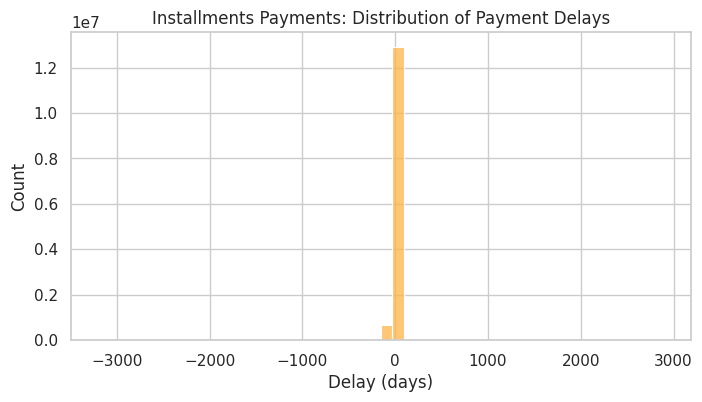

In [ ]:
# Payment delay (Days difference)
plt.figure(figsize=(8,4))
delay = (installments_payments["DAYS_ENTRY_PAYMENT"] - installments_payments["DAYS_INSTALMENT"]).dropna()
sns.histplot(delay, bins=50, color="#FFB347")
plt.title("Installments Payments: Distribution of Payment Delays")
plt.xlabel("Delay (days)")
plt.show()

Extremely skewed — most payments are small, with rare extreme outliers.

Not very meaningful alone; better when normalized (payment vs annuity).

## 2.3.8 Credit Card Balance

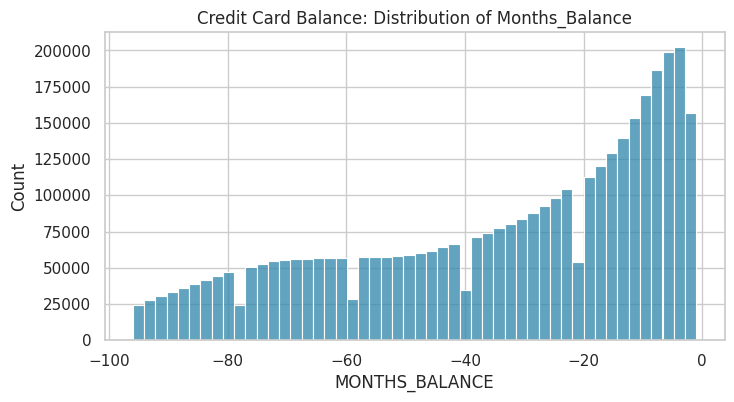

In [ ]:
# Months balance
plt.figure(figsize=(8,4))
sns.histplot(credit_card_balance["MONTHS_BALANCE"], bins=50, color="#2E86AB")
plt.title("Credit Card Balance: Distribution of Months_Balance")
plt.show()

Again covers ~100 months, with recent activity most populated.

Implication: Current and recent card usage provides the most signal for default risk.

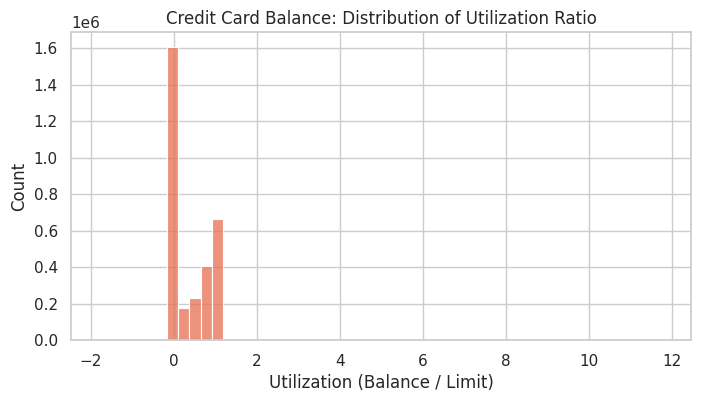

In [ ]:
# Balance vs Limit (utilization)
credit_card_balance["UTILIZATION"] = credit_card_balance["AMT_BALANCE"] / credit_card_balance["AMT_CREDIT_LIMIT_ACTUAL"]
plt.figure(figsize=(8,4))
sns.histplot(credit_card_balance["UTILIZATION"].dropna(), bins=50, color="#E76F51")
plt.title("Credit Card Balance: Distribution of Utilization Ratio")
plt.xlabel("Utilization (Balance / Limit)")
plt.show()

Most clients have ratios between 0 and 1 (reasonable usage). Some exceed 1 (over-utilization, spending above credit limit).

Implication: High utilization is a strong risk factor, since clients maxing out cards are more likely to default.

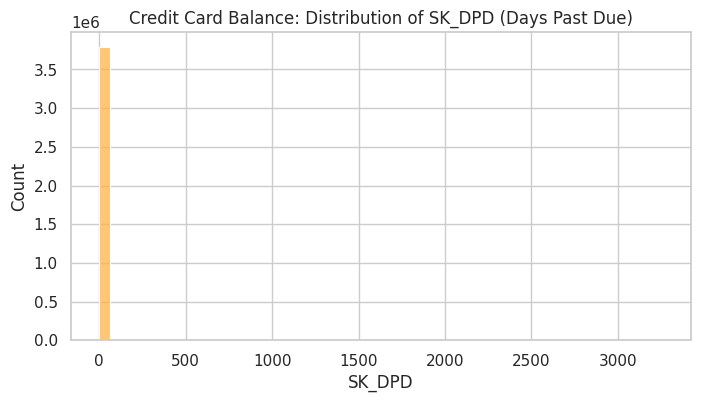

In [ ]:
# Overdue DPD
plt.figure(figsize=(8,4))
sns.histplot(credit_card_balance["SK_DPD"], bins=50, color="#FFB347")
plt.title("Credit Card Balance: Distribution of SK_DPD (Days Past Due)")
plt.show()

Almost all values are zero; very few cases of long delinquency.

Implication: On its own, this chart doesn’t add much. But even small DPD >0 values can be critical red flags in modeling.

## 2.4 Bivariate / Multivariate Analysis

### 2.4.1 Correlation with TARGET

/tmp/ipython-input-643710700.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=target_corr_top.values,


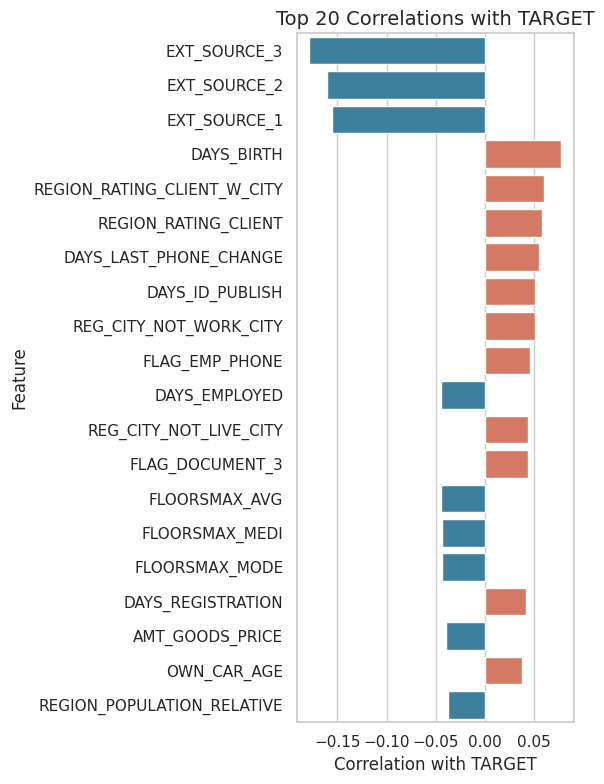

In [ ]:
# Correlation Analysis
import matplotlib.pyplot as plt
import seaborn as sns
# 1) Filter numeric columns again (exclude IDs)
num_cols_corr = [col for col in num_cols if col != "SK_ID_CURR"]
# Compute correlation matrix
corr_matrix = df_train[num_cols_corr + ["TARGET"]].corr()
# Correlation of each feature with TARGET (drop self-corr)
target_corr = corr_matrix["TARGET"].drop("TARGET").sort_values(key=abs, ascending=False)
top_n = 20
target_corr_top = target_corr.head(top_n)
plt.figure(figsize=(6, 8))
# Blue for negative, Orange for positive
colors = ["#2E86AB" if x < 0 else "#E76F51" for x in target_corr_top]
sns.barplot(x=target_corr_top.values,
            y=target_corr_top.index,
            palette=colors)
plt.title(f"Top {top_n} Correlations with TARGET", fontsize=14)
plt.xlabel("Correlation with TARGET")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# 3. Modeling

## 3.1 Data Preparation

In [ ]:
num_cols

['SK_ID_CURR',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 

In [ ]:
num_cols = [col for col in num_cols if col != "SK_ID_CURR"]

In [ ]:
X = df_train[num_cols +  cat_cols]
y = df_train[tar_col]

In [ ]:
X

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648.0,-2120,...,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186.0,-291,...,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260.0,-2531,...,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833.0,-2437,...,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311.0,-3458,...,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,-8456.0,-1982,...,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services,reg oper account,block of flats,"Stone, brick",No
307507,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,-4388.0,-4090,...,Secondary / secondary special,Widow,House / apartment,NaN,MONDAY,XNA,reg oper account,block of flats,"Stone, brick",No
307508,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,-6737.0,-5150,...,Higher education,Separated,House / apartment,Managers,THURSDAY,School,reg oper account,block of flats,Panel,No
307509,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,-2562.0,-931,...,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1,NaN,block of flats,"Stone, brick",No


In [ ]:
y

,TARGET
0,1
1,0
2,0
3,0
4,0
...,...
307506,0
307507,0
307508,0
307509,1


In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42, test_size=0.3)

In [ ]:
X_train

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
159703,2,405000.0,1971072.0,68643.0,1800000.0,0.006852,-13587,-1028,-7460.0,-1823,...,Higher education,Married,House / apartment,Accountants,SATURDAY,Self-employed,reg oper account,block of flats,"Stone, brick",No
79269,0,337500.0,508495.5,38146.5,454500.0,0.010276,-17543,-1208,-4054.0,-1090,...,Higher education,Married,House / apartment,Managers,WEDNESDAY,Agriculture,NaN,NaN,NaN,NaN
232615,1,112500.0,110146.5,13068.0,90000.0,0.005084,-11557,-593,-5554.0,-4130,...,Secondary / secondary special,Married,House / apartment,Laborers,FRIDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
33420,2,40500.0,66384.0,3519.0,45000.0,0.031329,-15750,-5376,-5285.0,-5290,...,Secondary / secondary special,Married,House / apartment,Sales staff,TUESDAY,Self-employed,NaN,NaN,NaN,NaN
88191,0,225000.0,298512.0,31801.5,270000.0,0.019101,-19912,-1195,-86.0,-3033,...,Secondary / secondary special,Married,House / apartment,Drivers,FRIDAY,Construction,reg oper account,block of flats,"Stone, brick",No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170183,1,157500.0,846517.5,33700.5,684000.0,0.035792,-14742,-7799,-5732.0,-4088,...,Higher education,Married,House / apartment,NaN,MONDAY,Other,NaN,NaN,NaN,NaN
31304,1,135000.0,405000.0,20250.0,405000.0,0.035792,-15374,-595,-6831.0,-4420,...,Secondary / secondary special,Married,House / apartment,Sales staff,MONDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
121193,0,157500.0,272520.0,21528.0,225000.0,0.018801,-19035,-4334,-8490.0,-2561,...,Secondary / secondary special,Single / not married,House / apartment,Secretaries,MONDAY,Medicine,reg oper account,block of flats,Panel,No
248504,0,90000.0,246357.0,24493.5,234000.0,0.025164,-23088,365243,-8975.0,-4636,...,Secondary / secondary special,Civil marriage,House / apartment,NaN,SUNDAY,XNA,reg oper account,block of flats,Mixed,No


In [ ]:
X_test

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
199280,0,90000.0,803259.0,23616.0,670500.0,0.008625,-19596,-1873,-10088.0,-3130,...,Secondary / secondary special,Married,House / apartment,NaN,SATURDAY,School,NaN,NaN,NaN,NaN
122967,0,270000.0,1288350.0,41692.5,1125000.0,0.008019,-13853,-1070,-670.0,-4712,...,Higher education,Married,House / apartment,Managers,SATURDAY,Housing,not specified,block of flats,Panel,No
156663,0,270000.0,253737.0,25227.0,229500.0,0.020246,-20895,-1477,-5773.0,-4370,...,Secondary / secondary special,Married,House / apartment,NaN,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
134382,0,144000.0,436032.0,16564.5,360000.0,0.018850,-18859,-916,-5972.0,-2416,...,Secondary / secondary special,Married,House / apartment,NaN,SATURDAY,Business Entity Type 3,NaN,block of flats,"Stone, brick",No
250108,2,72000.0,225000.0,11250.0,225000.0,0.019101,-16521,-2786,-6337.0,-19,...,Secondary / secondary special,Married,With parents,Laborers,THURSDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111421,0,135000.0,450000.0,21780.0,450000.0,0.018029,-17288,-2950,-1074.0,-836,...,Secondary / secondary special,Widow,Municipal apartment,Laborers,MONDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
197893,0,112500.0,298512.0,23715.0,270000.0,0.006671,-10511,-3692,-4144.0,-3191,...,Secondary / secondary special,Single / not married,Municipal apartment,Laborers,TUESDAY,Self-employed,NaN,block of flats,"Stone, brick",No
226757,0,157500.0,288873.0,19435.5,238500.0,0.035792,-18694,-910,-478.0,-1994,...,Secondary / secondary special,Single / not married,House / apartment,Sales staff,TUESDAY,Self-employed,NaN,block of flats,"Stone, brick",No
149911,0,180000.0,940500.0,39978.0,940500.0,0.026392,-19972,-12748,-12277.0,-233,...,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,University,NaN,block of flats,"Stone, brick",No


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, RobustScaler

# Numerical and categorical columns
num_features = num_cols.copy()
cat_features = cat_cols.copy()

In [ ]:
# Numerical pipeline: impute missing values and scale
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler())
])

# Categorical pipeline: impute missing values and one-hot encode
cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

# Combine pipelines
preprocessor = ColumnTransformer([
    ('num', num_pipeline, num_features),
    ('cat', cat_pipeline, cat_features)
])

preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', RobustScaler())]),
                                 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL',
                                  'AMT_CREDIT', 'AMT_ANNUITY',
                                  'AMT_GOODS_PRICE',
                                  'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
                                  'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
                                  'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                                  'F...
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                  'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
                                  'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                                  'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                  'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
                                  'WEEKDAY_APPR_PROCESS_START',
                                  'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
                                  'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
                                  'EMERGENCYSTATE_MODE'])])

In [ ]:
# Fit the preprocessor on the training data
preprocessor.fit(X_train)

# chi transform tren test
X_train_tf = preprocessor.transform(X_train)
X_test_tf = preprocessor.transform(X_test)

In [ ]:
X_train.shape, X_train_tf.shape

((215257, 120), (215257, 244))

In [ ]:
X_train_tf

array([[ 2.        ,  2.85      ,  2.70059315, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.        ,  2.1       , -0.01467001, ...,  0.        ,
         1.        ,  0.        ],
       [ 1.        , -0.4       , -0.75420217, ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [ 0.        ,  0.1       , -0.45275689, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.        , -0.65      , -0.50132832, ...,  0.        ,
         1.        ,  0.        ],
       [ 1.        ,  0.85      , -0.45743525, ...,  0.        ,
         1.        ,  0.        ]])

In [ ]:
# Get feature names after transformation
feature_names = preprocessor.get_feature_names_out()
X_train_tf_df = pd.DataFrame(X_train_tf, columns=feature_names, index=X_train.index)
X_train_tf_df

,num__CNT_CHILDREN,num__AMT_INCOME_TOTAL,num__AMT_CREDIT,num__AMT_ANNUITY,num__AMT_GOODS_PRICE,num__REGION_POPULATION_RELATIVE,num__DAYS_BIRTH,num__DAYS_EMPLOYED,num__DAYS_REGISTRATION,num__DAYS_ID_PUBLISH,...,cat__HOUSETYPE_MODE_terraced house,cat__WALLSMATERIAL_MODE_Block,cat__WALLSMATERIAL_MODE_Mixed,cat__WALLSMATERIAL_MODE_Monolithic,cat__WALLSMATERIAL_MODE_Others,cat__WALLSMATERIAL_MODE_Panel,"cat__WALLSMATERIAL_MODE_Stone, brick",cat__WALLSMATERIAL_MODE_Wooden,cat__EMERGENCYSTATE_MODE_No,cat__EMERGENCYSTATE_MODE_Yes
159703,2.0,2.85,2.700593,2.421525,3.061224,-0.643083,0.296673,0.074838,-0.539038,0.557409,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
79269,0.0,2.10,-0.014670,0.733184,0.010204,-0.459559,-0.247182,0.002023,0.083745,0.841738,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
232615,1.0,-0.40,-0.754202,-0.655207,-0.816327,-0.737846,0.575749,0.250809,-0.190528,-0.337471,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
33420,2.0,-1.20,-0.835447,-1.183857,-0.918367,0.668864,-0.000687,-1.684061,-0.141342,-0.787432,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
88191,0.0,0.85,-0.404503,0.381913,-0.408163,0.013453,-0.572862,0.007282,0.809289,0.088053,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170183,1.0,0.10,0.612865,0.487045,0.530612,0.908077,0.137888,-2.664239,-0.223076,-0.321179,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
31304,1.0,-0.15,-0.206809,-0.257598,-0.102041,0.908077,0.051004,0.250000,-0.424026,-0.449961,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
121193,0.0,0.10,-0.452757,-0.186846,-0.510204,-0.002626,-0.452296,-1.262540,-0.727372,0.271140,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
248504,0.0,-0.65,-0.501328,-0.022671,-0.489796,0.338425,-1.009486,148.242718,-0.816054,-0.533747,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
# Function to evaluate models
from sklearn.metrics import (accuracy_score, balanced_accuracy_score, precision_score, recall_score,
                             f1_score, matthews_corrcoef, roc_auc_score, precision_recall_curve,
                             auc, confusion_matrix)
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import metrics

def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    accuracy = metrics.accuracy_score(y_test, y_pred)
    balanced_acc = metrics.balanced_accuracy_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred, zero_division=0)
    recall = metrics.recall_score(y_test, y_pred, zero_division=0)
    f1 = metrics.f1_score(y_test, y_pred, zero_division=0)
    mcc = metrics.matthews_corrcoef(y_test, y_pred)

    roc_auc = metrics.roc_auc_score(y_test, y_prob) if y_prob is not None else None
    gini = (2 * roc_auc - 1) if roc_auc is not None else None

    if y_prob is not None:
        precision_curve, recall_curve, _ = metrics.precision_recall_curve(y_test, y_prob)
        pr_auc = metrics.auc(recall_curve, precision_curve)
    else:
        pr_auc = None

    print(f"\n--- {model_name} Results ---")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Balanced Accuracy: {balanced_acc:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall/Sensitivity: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"Matthews Correlation Coefficient: {mcc:.4f}")
    if roc_auc is not None:
        print(f"ROC AUC: {roc_auc:.4f}")
    if gini is not None:
        print(f"Gini: {gini:.4f}")
    if pr_auc is not None:
        print(f"PR AUC: {pr_auc:.4f}")

    # 2x2 plots
    fig, axs = plt.subplots(2, 2, figsize=(16,10))

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['On Time Payment', 'Late Payment'],
                yticklabels=['On Time Payment', 'Late Payment'], ax=axs[0,0])
    axs[0,0].set_title(f'Confusion Matrix - {model_name}')
    axs[0,0].set_xlabel('Predicted'); axs[0,0].set_ylabel('Actual')

    # ROC curve
    if y_prob is not None:
        from sklearn.metrics import RocCurveDisplay
        RocCurveDisplay.from_predictions(y_test, y_prob, name=model_name, ax=axs[0,1])
        axs[0,1].plot([0,1],[0,1],'k--')
        axs[0,1].set_title(f'ROC Curve - {model_name}')

    # Precision-Recall
    if y_prob is not None:
        from sklearn.metrics import PrecisionRecallDisplay
        PrecisionRecallDisplay.from_predictions(y_test, y_prob, name=model_name, ax=axs[1,0])
        axs[1,0].set_title(f'Precision-Recall Curve - {model_name}')

    # KDE
    if y_prob is not None:
        df_rank = pd.DataFrame({'label': y_test, 'score': y_prob})
        sns.kdeplot(data=df_rank, x='score', hue='label', common_norm=True, multiple="fill", ax=axs[1,1])
        axs[1,1].set_title(f'KDE - {model_name}')
        axs[1,1].set_xlim(0, 1); axs[1,1].set_ylim(0, 1)

    plt.tight_layout(); plt.show()

    return {
        'model': model_name,
        'accuracy': accuracy,
        'balanced_accuracy': balanced_acc,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'mcc': mcc,
        'gini': gini,
        'roc_auc': roc_auc,
        'pr_auc': pr_auc
    }


## 3.2 Baseline Models

### Logistic Regression (no regularization)

In [ ]:
model_logreg = LogisticRegression()

model_logreg.fit(X_train_tf, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()


--- Logistic Regression Results ---
Accuracy: 0.9191
Balanced Accuracy: 0.5031
Precision: 0.4298
Recall/Sensitivity: 0.0070
F1 Score: 0.0137
Matthews Correlation Coefficient: 0.0464
ROC AUC: 0.7361
Gini: 0.4722
PR AUC: 0.2129


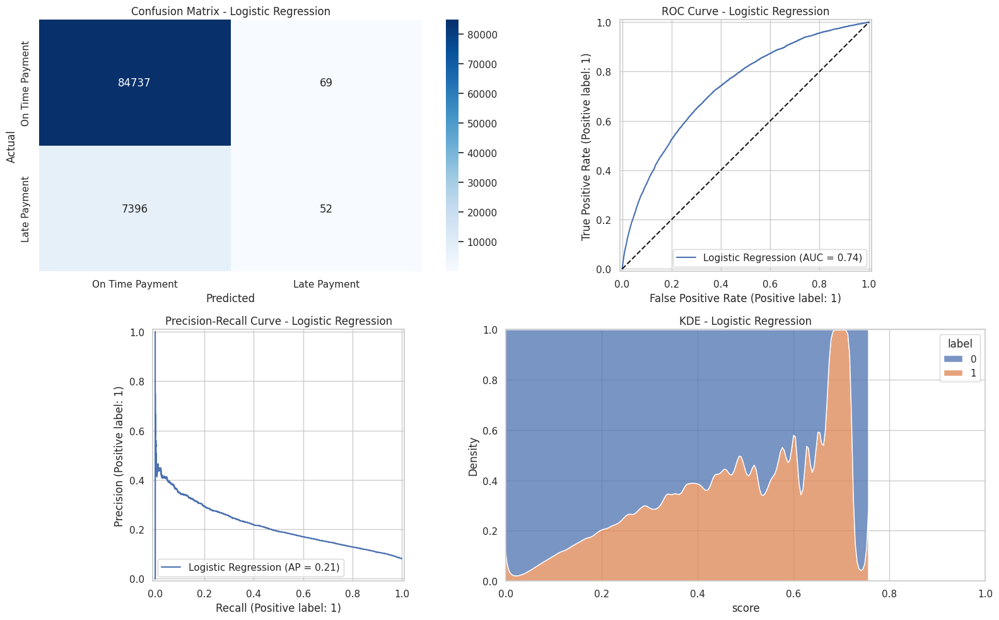

In [ ]:
logreg_results = evaluate_model(model_logreg, X_test_tf, y_test, "Logistic Regression")

### Random Forest


--- Random Forest Results ---
Accuracy: 0.9193
Balanced Accuracy: 0.5003
Precision: 0.7143
Recall/Sensitivity: 0.0007
F1 Score: 0.0013
Matthews Correlation Coefficient: 0.0203
ROC AUC: 0.7219
Gini: 0.4439
PR AUC: 0.2196


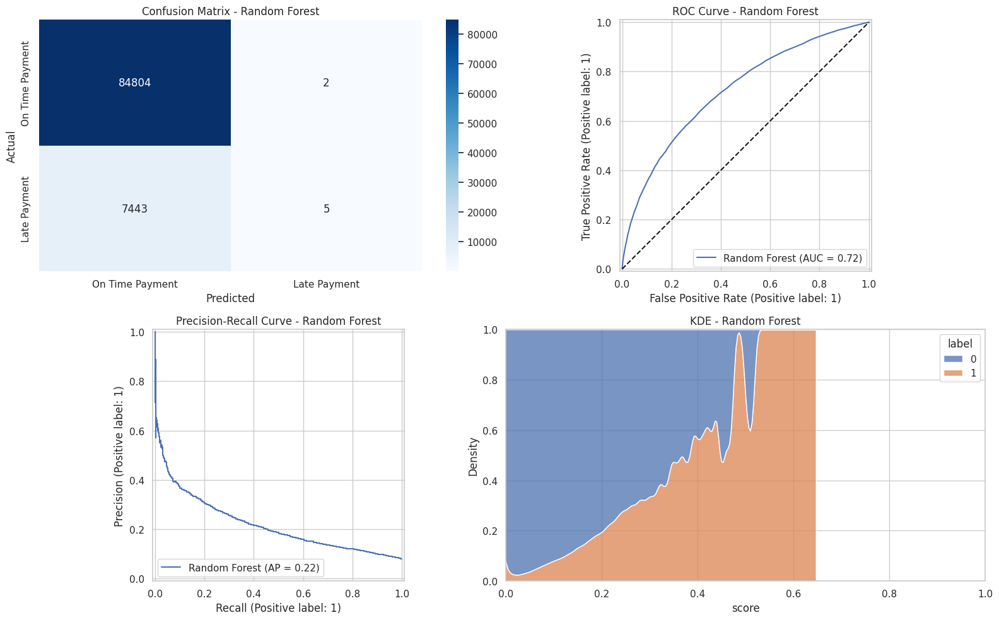

In [ ]:
model_rf = RandomForestClassifier(
    n_estimators=400,
    max_depth=None,
    min_samples_split=2,
    random_state=42,
    n_jobs=-1
)
model_rf.fit(X_train_tf, y_train)

rf_results = evaluate_model(model_rf, X_test_tf, y_test, "Random Forest")

### XGBoost


--- XGBoost Results ---
Accuracy: 0.9198
Balanced Accuracy: 0.5141
Precision: 0.5583
Recall/Sensitivity: 0.0302
F1 Score: 0.0573
Matthews Correlation Coefficient: 0.1161
ROC AUC: 0.7561
Gini: 0.5122
PR AUC: 0.2418


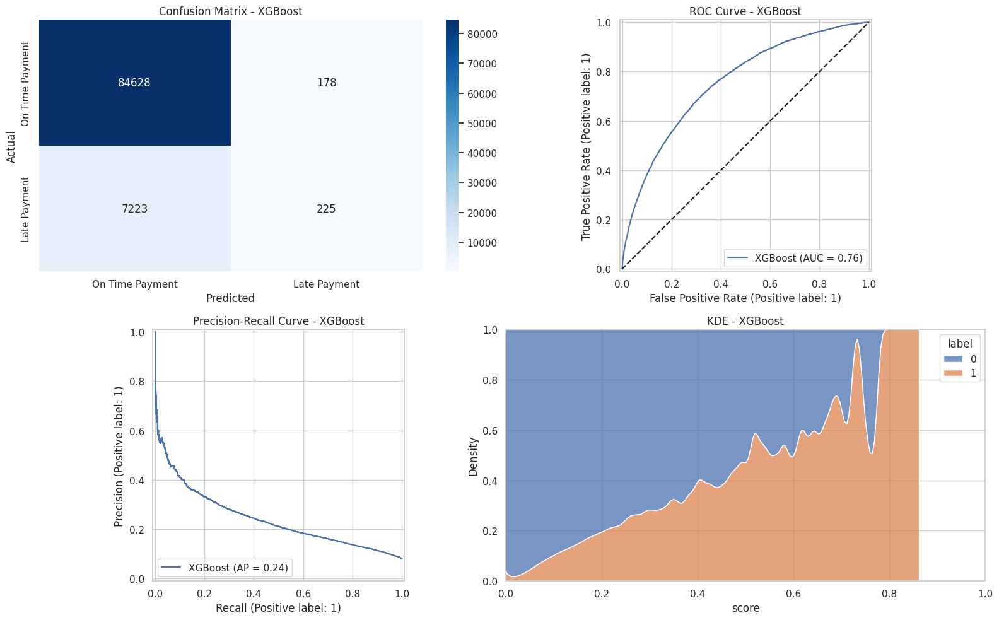

In [ ]:
from xgboost import XGBClassifier

model_xgb = XGBClassifier(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1,
    eval_metric="logloss"
)
model_xgb.fit(X_train_tf, y_train)

xgb_results = evaluate_model(model_xgb, X_test_tf, y_test, "XGBoost")


### CatBoost


--- CatBoost Results ---
Accuracy: 0.9194
Balanced Accuracy: 0.5104
Precision: 0.5248
Recall/Sensitivity: 0.0227
F1 Score: 0.0435
Matthews Correlation Coefficient: 0.0965
ROC AUC: 0.7611
Gini: 0.5221
PR AUC: 0.2463


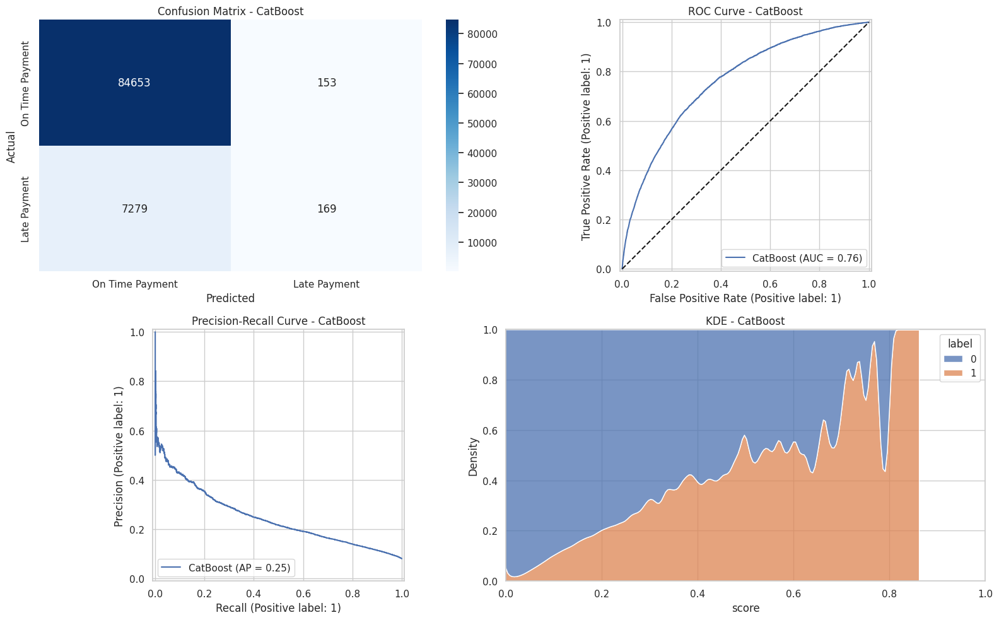

In [ ]:
from catboost import CatBoostClassifier

model_cat = CatBoostClassifier(
    iterations=500,
    depth=6,
    learning_rate=0.1,
    verbose=False,
    random_state=42
)
model_cat.fit(X_train_tf, y_train)

cat_results = evaluate_model(model_cat, X_test_tf, y_test, "CatBoost")

### LightGBM

[LightGBM] [Info] Number of positive: 17377, number of negative: 197880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11474
[LightGBM] [Info] Number of data points in the train set: 215257, number of used features: 232
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080727 -> initscore=-2.432513
[LightGBM] [Info] Start training from score -2.432513


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



--- LightGBM Results ---
Accuracy: 0.9198
Balanced Accuracy: 0.5102
Precision: 0.5912
Recall/Sensitivity: 0.0218
F1 Score: 0.0420
Matthews Correlation Coefficient: 0.1023
ROC AUC: 0.7588
Gini: 0.5177
PR AUC: 0.2464


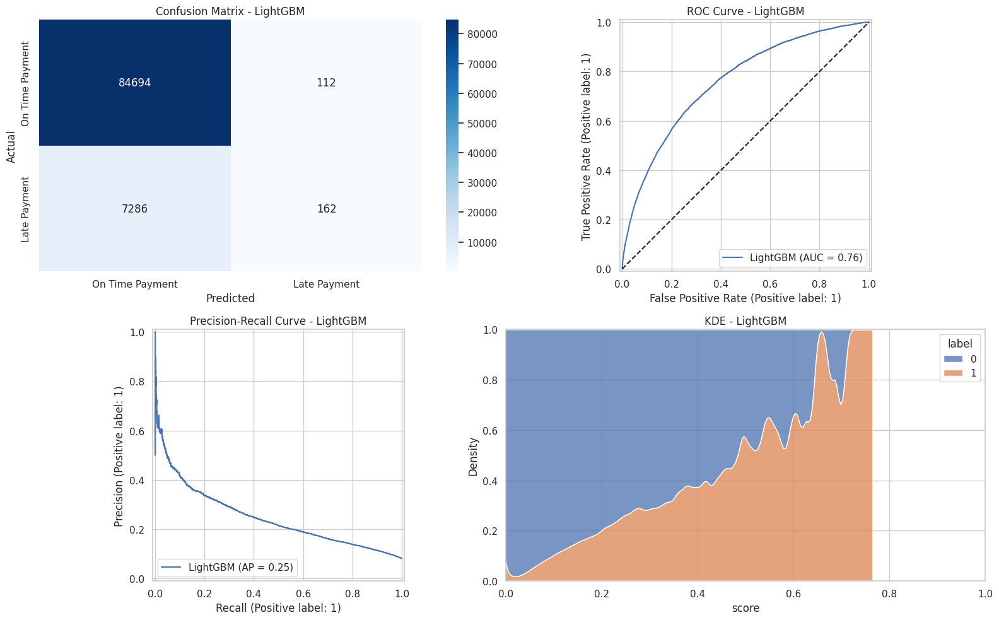

In [ ]:
from lightgbm import LGBMClassifier

model_lgbm = LGBMClassifier(
    n_estimators=400,
    learning_rate=0.05,
    num_leaves=31,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model_lgbm.fit(X_train_tf, y_train)

lgbm_results = evaluate_model(model_lgbm, X_test_tf, y_test, "LightGBM")


### Logistic Regression (L2 regularized)


--- Logistic Regression (L2) Results ---
Accuracy: 0.9193
Balanced Accuracy: 0.5055
Precision: 0.5114
Recall/Sensitivity: 0.0121
F1 Score: 0.0236
Matthews Correlation Coefficient: 0.0691
ROC AUC: 0.7471
Gini: 0.4942
PR AUC: 0.2236


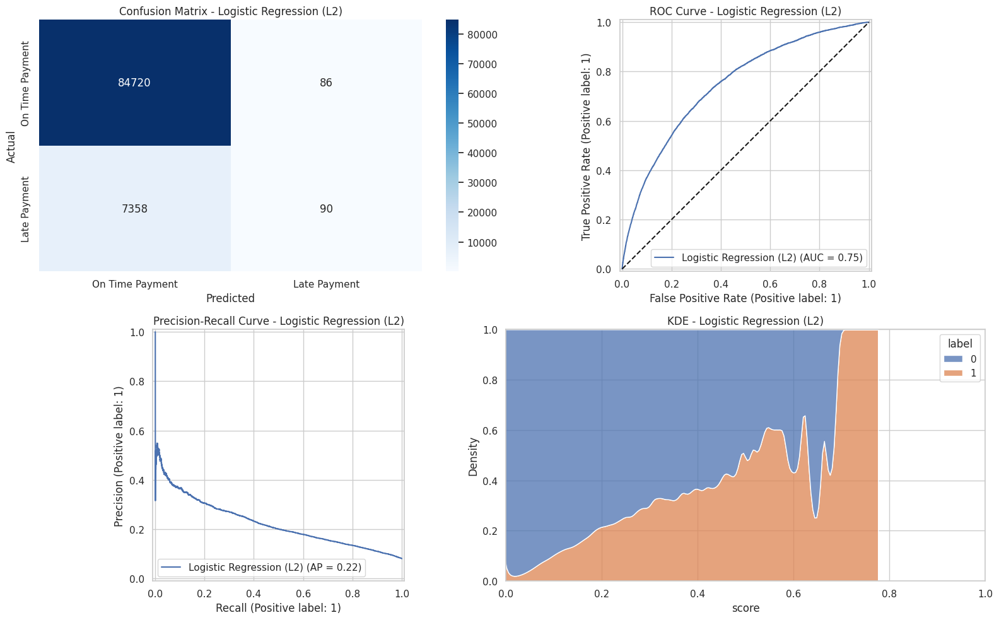

In [ ]:
from sklearn.linear_model import LogisticRegression

model_logreg_l2 = LogisticRegression(
    penalty="l2",
    C=1.0,
    solver="lbfgs",
    max_iter=1000,
    n_jobs=-1,
    random_state=42
)
model_logreg_l2.fit(X_train_tf, y_train)

logreg_l2_results = evaluate_model(model_logreg_l2, X_test_tf, y_test, "Logistic Regression (L2)")

# Save all trained models

In [ ]:
import joblib
import os

MODEL_DIR = "/content/drive/MyDrive/k7_models"
os.makedirs(MODEL_DIR, exist_ok=True)

# Save joblib-based models
joblib.dump(model_logreg, os.path.join(MODEL_DIR, "logreg_baseline.pkl"))
joblib.dump(model_xgb, os.path.join(MODEL_DIR, "xgboost.pkl"))
joblib.dump(model_rf, os.path.join(MODEL_DIR, "randomforest.pkl"))
joblib.dump(model_lgbm, os.path.join(MODEL_DIR, "lightgbm.pkl"))
joblib.dump(model_logreg_l2, os.path.join(MODEL_DIR, "logreg_l2.pkl"))

# Save CatBoost (special format)
model_cat.save_model(os.path.join(MODEL_DIR, "catboost.cbm"))

print("✅ All models saved to", MODEL_DIR)

✅ All models saved to /content/drive/MyDrive/k7_models


# Load trained models

In [ ]:
import joblib
import os
from catboost import CatBoostClassifier

MODEL_DIR = "/content/drive/MyDrive/k7_models"

models = {}

# Joblib-based models
models["Logistic Regression (baseline)"] = joblib.load(os.path.join(MODEL_DIR, "logreg_baseline.pkl"))
models["XGBoost"] = joblib.load(os.path.join(MODEL_DIR, "xgboost.pkl"))
models["RandomForest"] = joblib.load(os.path.join(MODEL_DIR, "randomforest.pkl"))
models["LightGBM"] = joblib.load(os.path.join(MODEL_DIR, "lightgbm.pkl"))
models["LogReg L2"] = joblib.load(os.path.join(MODEL_DIR, "logreg_l2.pkl"))

# CatBoost needs init then load
cat_loaded = CatBoostClassifier()
cat_loaded.load_model(os.path.join(MODEL_DIR, "catboost.cbm"))
models["CatBoost"] = cat_loaded

print("✅ Loaded models from", MODEL_DIR)

✅ Loaded models from /content/drive/MyDrive/k7_models



--- Logistic Regression (baseline) Results ---
Accuracy: 0.9191
Balanced Accuracy: 0.5031
Precision: 0.4298
Recall/Sensitivity: 0.0070
F1 Score: 0.0137
Matthews Correlation Coefficient: 0.0464
ROC AUC: 0.7361
Gini: 0.4722
PR AUC: 0.2129


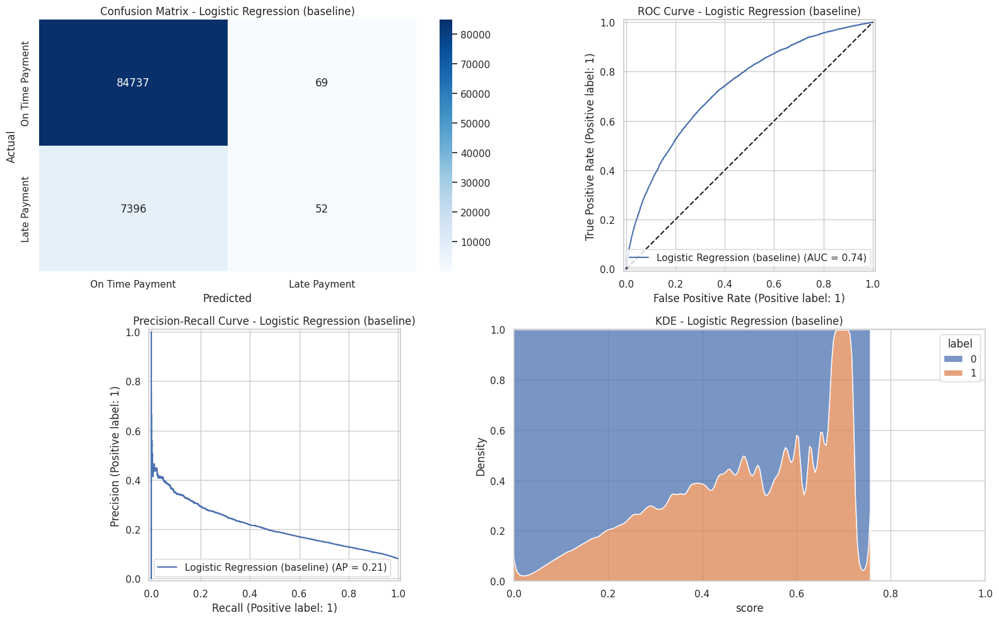


--- XGBoost Results ---
Accuracy: 0.9198
Balanced Accuracy: 0.5141
Precision: 0.5583
Recall/Sensitivity: 0.0302
F1 Score: 0.0573
Matthews Correlation Coefficient: 0.1161
ROC AUC: 0.7561
Gini: 0.5122
PR AUC: 0.2418


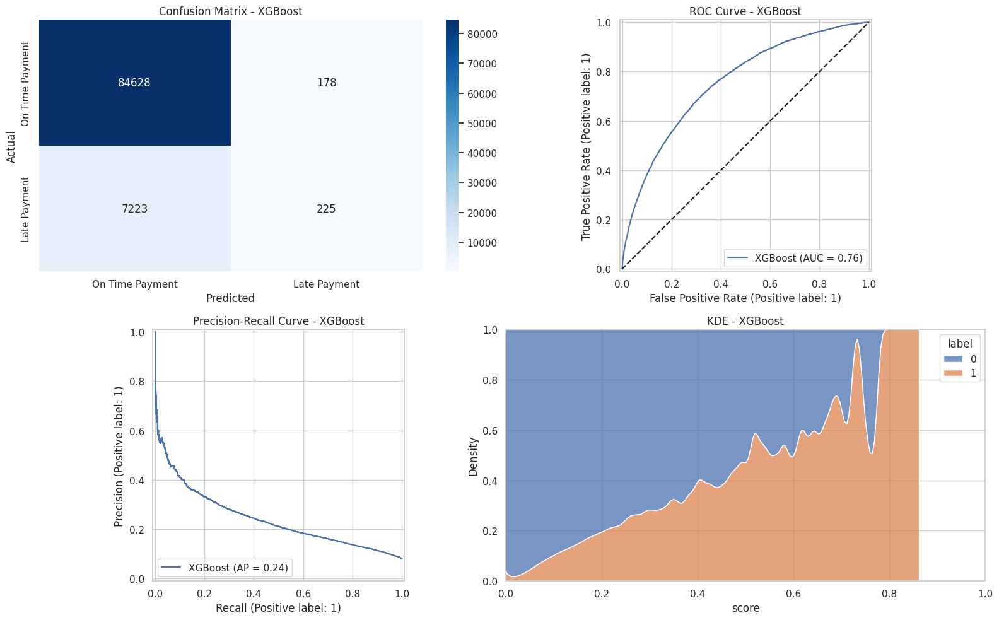


--- RandomForest Results ---
Accuracy: 0.9193
Balanced Accuracy: 0.5003
Precision: 0.7143
Recall/Sensitivity: 0.0007
F1 Score: 0.0013
Matthews Correlation Coefficient: 0.0203
ROC AUC: 0.7219
Gini: 0.4439
PR AUC: 0.2196


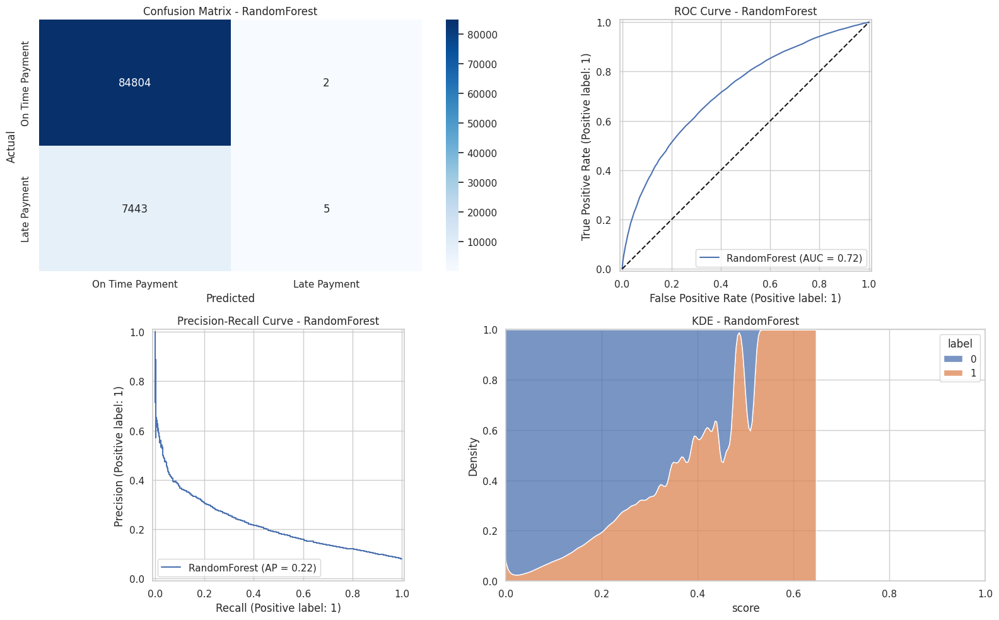

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



--- LightGBM Results ---
Accuracy: 0.9198
Balanced Accuracy: 0.5102
Precision: 0.5912
Recall/Sensitivity: 0.0218
F1 Score: 0.0420
Matthews Correlation Coefficient: 0.1023
ROC AUC: 0.7588
Gini: 0.5177
PR AUC: 0.2464


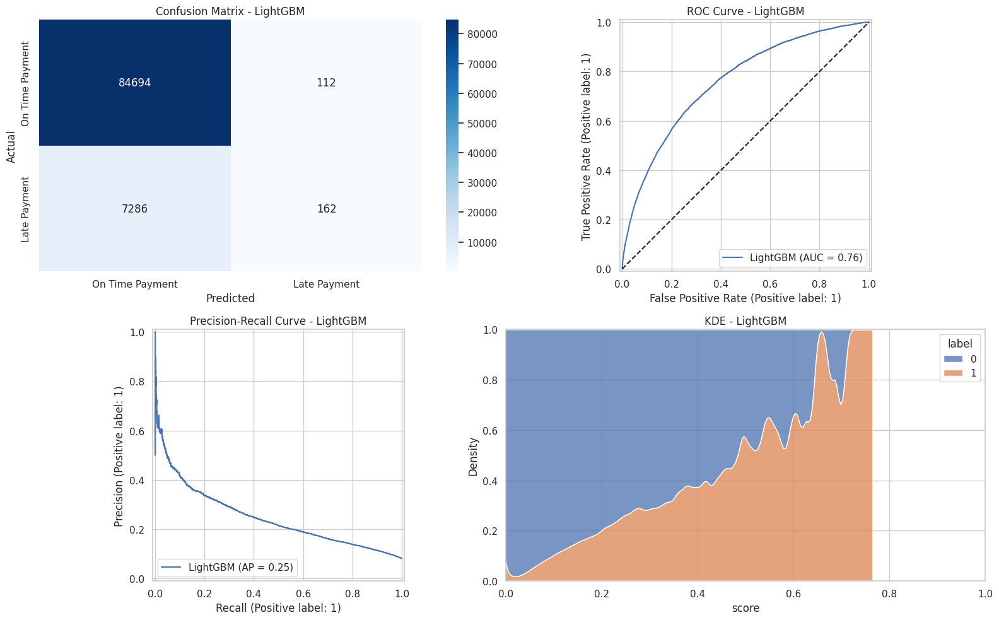


--- LogReg L2 Results ---
Accuracy: 0.9193
Balanced Accuracy: 0.5055
Precision: 0.5114
Recall/Sensitivity: 0.0121
F1 Score: 0.0236
Matthews Correlation Coefficient: 0.0691
ROC AUC: 0.7471
Gini: 0.4942
PR AUC: 0.2236


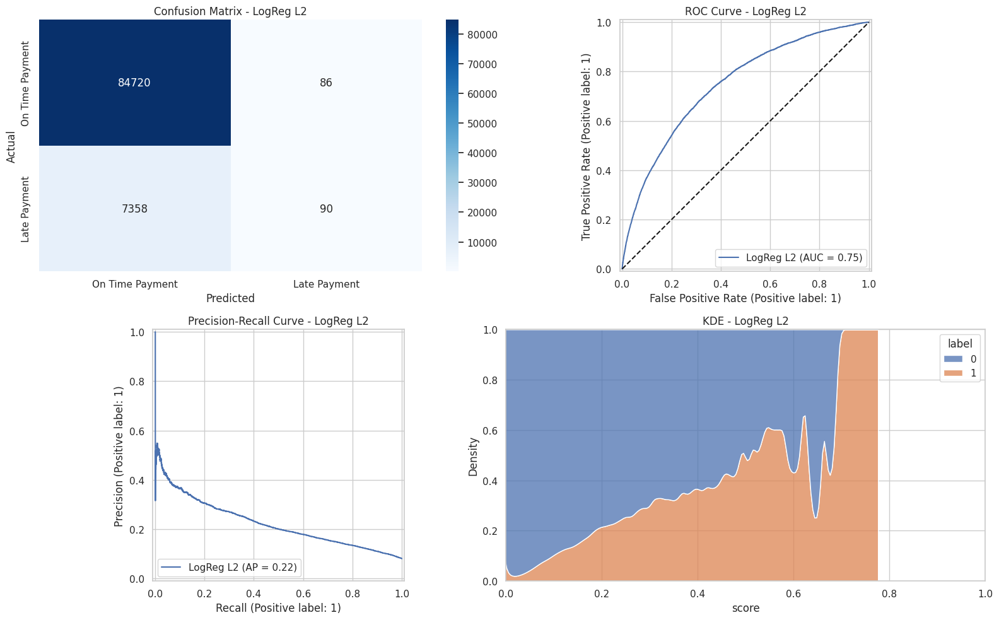


--- CatBoost Results ---
Accuracy: 0.9194
Balanced Accuracy: 0.5104
Precision: 0.5248
Recall/Sensitivity: 0.0227
F1 Score: 0.0435
Matthews Correlation Coefficient: 0.0965
ROC AUC: 0.7611
Gini: 0.5221
PR AUC: 0.2463


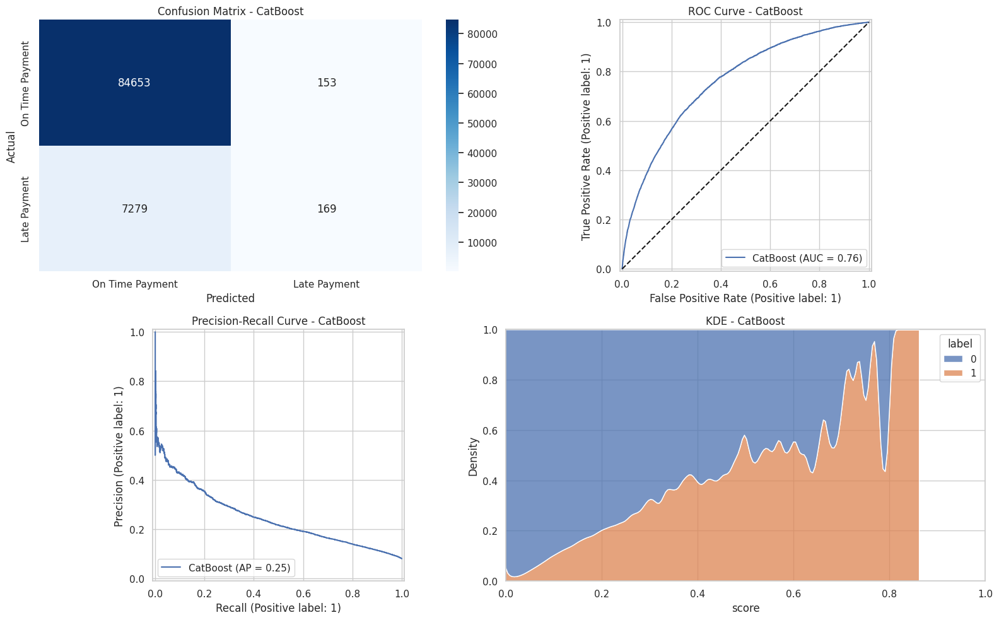

,model,accuracy,balanced_accuracy,precision,recall,f1,mcc,gini,roc_auc,pr_auc
5,CatBoost,0.919440,0.510443,0.524845,0.022691,0.043501,0.096480,0.522128,0.761064,0.246333
3,LightGBM,0.919808,0.510215,0.591241,0.021751,0.041958,0.102278,0.517689,0.758845,0.246438
1,XGBoost,0.919776,0.514055,0.558313,0.030209,0.057318,0.116120,0.512209,0.756105,0.241799
4,LogReg L2,0.919310,0.505535,0.511364,0.012084,0.023610,0.069109,0.494213,0.747106,0.223585
0,Logistic Regression (baseline),0.919082,0.503084,0.429752,0.006982,0.013740,0.046429,0.472169,0.736085,0.212866
2,RandomForest,0.919299,0.500324,0.714286,0.000671,0.001341,0.020259,0.443866,0.721933,0.219649


In [ ]:
# Evaluate each loaded model
results_loaded = []
for name, clf in models.items():
    res = evaluate_model(clf, X_test_tf, y_test, name)
    results_loaded.append(res)

import pandas as pd
df_summary_loaded = pd.DataFrame(results_loaded).sort_values("roc_auc", ascending=False)
df_summary_loaded


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


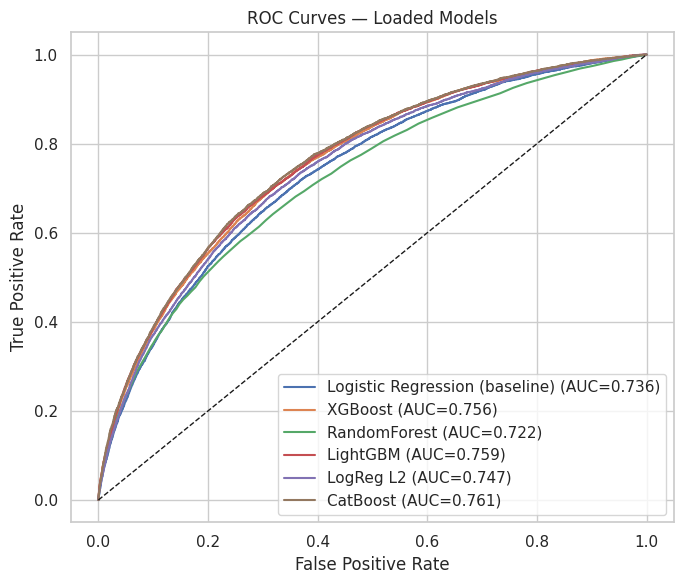

In [ ]:
# Combined ROC overlay
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 6))
for name, clf in models.items():
    proba = clf.predict_proba(X_test_tf)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, proba)
    auc = roc_auc_score(y_test, proba)
    plt.plot(fpr, tpr, label=f"{name} (AUC={auc:.3f})")

plt.plot([0,1],[0,1],"k--",linewidth=1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves — Loaded Models")
plt.legend()
plt.tight_layout()
plt.show()

## 3.4 Feature Importance

## LightGBM


=== TOP 20 IMPORTANT FEATURES (LightGBM Baseline) ===
                             Feature  Importance
29                 num__EXT_SOURCE_3         662
27                 num__EXT_SOURCE_1         623
28                 num__EXT_SOURCE_2         612
6                    num__DAYS_BIRTH         594
2                    num__AMT_CREDIT         531
9               num__DAYS_ID_PUBLISH         504
3                   num__AMT_ANNUITY         504
7                 num__DAYS_EMPLOYED         491
8             num__DAYS_REGISTRATION         439
77       num__DAYS_LAST_PHONE_CHANGE         419
4               num__AMT_GOODS_PRICE         380
1              num__AMT_INCOME_TOTAL         334
5    num__REGION_POPULATION_RELATIVE         257
20      num__HOUR_APPR_PROCESS_START         175
10                  num__OWN_CAR_AGE         163
103  num__AMT_REQ_CREDIT_BUREAU_YEAR         157
72               num__TOTALAREA_MODE         154
39                 num__LANDAREA_AVG         105
45            

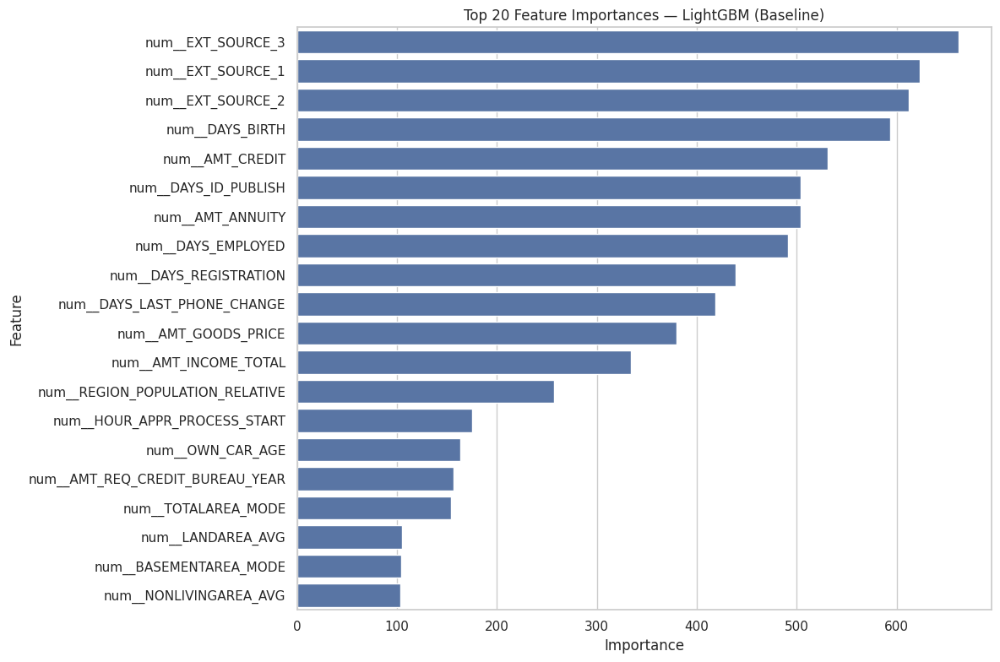

In [ ]:
# Get feature names from preprocessor (if training used transformed arrays)
feature_names = preprocessor.get_feature_names_out()

lgb_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': model_lgbm.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n=== TOP 20 IMPORTANT FEATURES (LightGBM Baseline) ===")
print(lgb_importance.head(20))

plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=lgb_importance.head(20))
plt.title('Top 20 Feature Importances — LightGBM (Baseline)')
plt.tight_layout()
plt.show()

## CatBoost


=== TOP 20 IMPORTANT FEATURES (CatBoost Baseline) ===
                                       Feature  Importance
29                           num__EXT_SOURCE_3   16.227774
28                           num__EXT_SOURCE_2   13.694221
27                           num__EXT_SOURCE_1    7.630604
6                              num__DAYS_BIRTH    5.146709
4                         num__AMT_GOODS_PRICE    4.259112
2                              num__AMT_CREDIT    4.219728
3                             num__AMT_ANNUITY    3.212808
7                           num__DAYS_EMPLOYED    3.079480
77                 num__DAYS_LAST_PHONE_CHANGE    2.196834
9                         num__DAYS_ID_PUBLISH    2.096661
129  cat__NAME_EDUCATION_TYPE_Higher education    1.612646
1                        num__AMT_INCOME_TOTAL    1.607561
8                       num__DAYS_REGISTRATION    1.563530
10                            num__OWN_CAR_AGE    1.494361
106                         cat__CODE_GENDER_F    1.384022
1

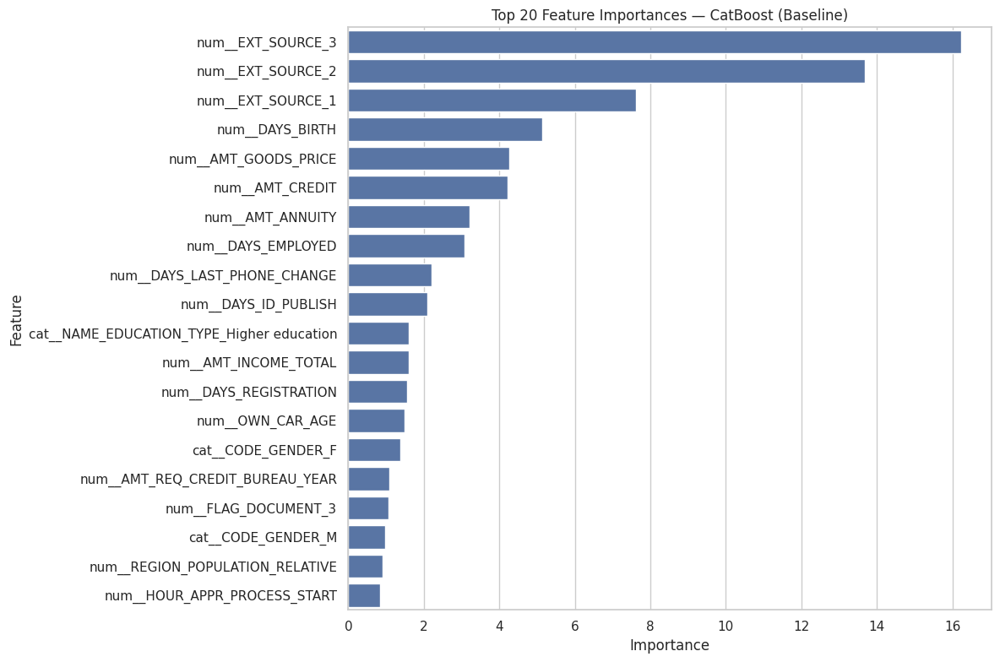

In [ ]:
# If model_cb was trained on arrays:
feature_names = preprocessor.get_feature_names_out()

cb_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': model_cat.get_feature_importance()
}).sort_values('Importance', ascending=False)

print("\n=== TOP 20 IMPORTANT FEATURES (CatBoost Baseline) ===")
print(cb_importance.head(20))

plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=cb_importance.head(20))
plt.title('Top 20 Feature Importances — CatBoost (Baseline)')
plt.tight_layout()
plt.show()

# 4. Feature Engineering

## 4.1 Application-Level Features

In [ ]:
def safe_div(a, b):
    return np.divide(a, b, out=np.zeros_like(a, dtype='float64'), where=(b!=0))

In [ ]:
def fe_application_base(df):
    out = df.copy()

    # days -> watch sign (dataset uses negatives)
    out['AGE_YEARS'] = (-out['DAYS_BIRTH'] / 365).astype(float)
    out['DAYS_EMPLOYED'] = out['DAYS_EMPLOYED'].replace(365243, np.nan)

    out['CREDIT_INCOME_PERCENT']   = safe_div(out['AMT_CREDIT'],  out['AMT_INCOME_TOTAL'])
    out['ANNUITY_INCOME_PERCENT']  = safe_div(out['AMT_ANNUITY'], out['AMT_INCOME_TOTAL'])
    out['CREDIT_ANNUITY_PERCENT']  = safe_div(out['AMT_CREDIT'],  out['AMT_ANNUITY'])

    out['FAMILY_CNT_INCOME_PERCENT']   = safe_div(out['AMT_INCOME_TOTAL'], out['CNT_FAM_MEMBERS'])
    out['CREDIT_TERM']                 = safe_div(out['AMT_ANNUITY'], out['AMT_CREDIT'])
    out['BIRTH_EMPLOYED_PERCENT']      = safe_div(out['DAYS_EMPLOYED'], out['DAYS_BIRTH'])
    out['CHILDREN_CNT_INCOME_PERCENT'] = safe_div(out['AMT_INCOME_TOTAL'], out['CNT_CHILDREN'])

    out['CREDIT_GOODS_DIFF']           = out['AMT_CREDIT'] - out['AMT_GOODS_PRICE']
    out['EMPLOYED_REGISTRATION_PERCENT'] = safe_div(out['DAYS_EMPLOYED'], out['DAYS_REGISTRATION'])
    out['BIRTH_REGISTRATION_PERCENT']    = safe_div(out['DAYS_BIRTH'], out['DAYS_REGISTRATION'])
    out['ID_REGISTRATION_DIFF']          = out['DAYS_ID_PUBLISH'] - out['DAYS_REGISTRATION']

    out['ANNUITY_LENGTH_EMPLOYED_PERCENT'] = safe_div(out['CREDIT_TERM'], out['DAYS_EMPLOYED'])

    out['AGE_LOAN_FINISH'] = (-out['DAYS_BIRTH'] / 365.0) + safe_div(out['AMT_CREDIT'], out['AMT_ANNUITY']) * (1.0/12)
    out['CAR_AGE_EMP_PERCENT']   = safe_div(out['OWN_CAR_AGE'], out['DAYS_EMPLOYED'])
    out['CAR_AGE_BIRTH_PERCENT'] = safe_div(out['OWN_CAR_AGE'], out['DAYS_BIRTH'])
    out['PHONE_CHANGE_EMP_PERCENT']   = safe_div(out['DAYS_LAST_PHONE_CHANGE'], out['DAYS_EMPLOYED'])
    out['PHONE_CHANGE_BIRTH_PERCENT'] = safe_div(out['DAYS_LAST_PHONE_CHANGE'], out['DAYS_BIRTH'])

    return out

def add_app_median_maps(train_df, df):
    """
    Compute medians on TRAIN only, map to any df (train or test).
    Avoids target leakage across folds.
    """
    out = df.copy()
    map_specs = [
        ('NAME_CONTRACT_TYPE',  'MEDIAN_INCOME_CONTRACT_TYPE'),
        ('NAME_TYPE_SUITE',     'MEDIAN_INCOME_SUITE_TYPE'),
        ('NAME_HOUSING_TYPE',   'MEDIAN_INCOME_HOUSING_TYPE'),
        ('ORGANIZATION_TYPE',   'MEDIAN_INCOME_ORG_TYPE'),
        ('OCCUPATION_TYPE',     'MEDIAN_INCOME_OCCU_TYPE'),
        ('NAME_EDUCATION_TYPE', 'MEDIAN_INCOME_EDU_TYPE'),
    ]
    for cat_col, new_col in map_specs:
        if cat_col in train_df.columns:
            med = (train_df[[cat_col,'AMT_INCOME_TOTAL']]
                   .groupby(cat_col)['AMT_INCOME_TOTAL'].median())
            out[new_col] = out[cat_col].map(med)
    # ratios vs. own income
    if 'MEDIAN_INCOME_ORG_TYPE' in out:
        out['ORG_TYPE_INCOME_PERCENT'] = safe_div(out['MEDIAN_INCOME_ORG_TYPE'], out['AMT_INCOME_TOTAL'])
    if 'MEDIAN_INCOME_OCCU_TYPE' in out:
        out['OCCU_TYPE_INCOME_PERCENT'] = safe_div(out['MEDIAN_INCOME_OCCU_TYPE'], out['AMT_INCOME_TOTAL'])
    if 'MEDIAN_INCOME_EDU_TYPE' in out:
        out['EDU_TYPE_INCOME_PERCENT']  = safe_div(out['MEDIAN_INCOME_EDU_TYPE'], out['AMT_INCOME_TOTAL'])
    return out


## 4.2 Relational Tables

In [ ]:
def fe_bureau(bureau, bureau_balance=None):
    b = bureau.copy()

    # ratios (safe)
    b['CREDIT_DURATION']        = -b['DAYS_CREDIT'] + b['DAYS_CREDIT_ENDDATE']
    b['ENDDATE_DIFF']           = b['DAYS_CREDIT_ENDDATE'] - b['DAYS_ENDDATE_FACT']
    b['UPDATE_DIFF']            = b['DAYS_CREDIT_ENDDATE'] - b['DAYS_CREDIT_UPDATE']
    b['DEBT_PERCENTAGE']        = safe_div(b['AMT_CREDIT_SUM_DEBT'], b['AMT_CREDIT_SUM'])  # debt / credit
    b['DEBT_CREDIT_DIFF']       = b['AMT_CREDIT_SUM'] - b['AMT_CREDIT_SUM_DEBT']
    b['CREDIT_TO_ANNUITY_RATIO']= safe_div(b['AMT_CREDIT_SUM'], b['AMT_ANNUITY'])
    b['DEBT_TO_ANNUITY_RATIO']  = safe_div(b['AMT_CREDIT_SUM_DEBT'], b['AMT_ANNUITY'])
    b['CREDIT_OVERDUE_DIFF']    = b['AMT_CREDIT_SUM'] - b['AMT_CREDIT_SUM_OVERDUE']

    # per-client counts
    loan_counts = b.groupby('SK_ID_CURR')['SK_ID_BUREAU'].count().rename('BUREAU__CUSTOMER_LOAN_COUNT')
    cred_types  = b.groupby('SK_ID_CURR')['CREDIT_TYPE'].nunique().rename('BUREAU__CUSTOMER_CREDIT_TYPES')
    base = pd.concat([loan_counts, cred_types], axis=1)
    base['BUREAU__AVG_LOAN_TYPE'] = safe_div(base['BUREAU__CUSTOMER_LOAN_COUNT'], base['BUREAU__CUSTOMER_CREDIT_TYPES'])

    # status counts
    if 'CREDIT_ACTIVE' in b.columns:
        act = pd.crosstab(b['SK_ID_CURR'], b['CREDIT_ACTIVE'])
        act.columns = [f'BUREAU__ACTIVE_{c}' for c in act.columns]
        base = base.join(act, how='left')

    # numeric summaries
    num_aggs = {
        'DAYS_CREDIT': ['min','max','mean','std'],
        'AMT_CREDIT_SUM': ['sum','max','mean'],
        'AMT_CREDIT_SUM_DEBT': ['sum','max','mean'],
        'AMT_CREDIT_SUM_OVERDUE': ['sum','max','mean'],
        'AMT_CREDIT_SUM_LIMIT': ['sum','max','mean'],
        'AMT_ANNUITY': ['max','mean'],
        'CNT_CREDIT_PROLONG': ['sum','max'],
        'CREDIT_DURATION': ['mean','max'],
        'DEBT_PERCENTAGE': ['mean'],
        'DEBT_CREDIT_DIFF': ['mean','max'],
        'CREDIT_TO_ANNUITY_RATIO': ['mean'],
        'DEBT_TO_ANNUITY_RATIO': ['mean'],
        'CREDIT_OVERDUE_DIFF': ['mean','min']
    }
    g = b.groupby('SK_ID_CURR').agg(num_aggs)
    g.columns = ['BUREAU__' + '_'.join(c) for c in g.columns]
    out = base.join(g, how='left')

    # bureau_balance (optional)
    if bureau_balance is not None and 'SK_ID_BUREAU' in bureau_balance:
        bb = bureau_balance[['SK_ID_BUREAU','MONTHS_BALANCE','STATUS']].copy()
        map_status = {'C':0,'0':0,'1':1,'2':2,'3':3,'4':4,'5':5,'X':np.nan}
        bb['STATUS_NUM'] = bb['STATUS'].map(map_status)
        bb_ag = (bb.groupby('SK_ID_BUREAU')
                   .agg(BB_MONTHS_LEN=('MONTHS_BALANCE','count'),
                        BB_STATUS_MEAN=('STATUS_NUM','mean'),
                        BB_STATUS_MAX=('STATUS_NUM','max')))
        # link to client
        link = b[['SK_ID_BUREAU','SK_ID_CURR']].drop_duplicates().set_index('SK_ID_BUREAU')
        bb_ag = bb_ag.join(link).reset_index(drop=True)
        bb_client = (bb_ag.groupby('SK_ID_CURR')
                          .agg(BB_MONTHS_LEN_SUM=('BB_MONTHS_LEN','sum'),
                               BB_STATUS_MEAN_MEAN=('BB_STATUS_MEAN','mean'),
                               BB_STATUS_MAX_MAX=('BB_STATUS_MAX','max')))
        out = out.join(bb_client, how='left')

    out = out.reset_index()
    return out

In [ ]:
def make_prevapp_agg(prev):
    p = prev.copy()
    # numeric aggs per SK_ID_CURR
    num_aggs = {
        'AMT_CREDIT': ['mean','max','sum'],
        'AMT_APPLICATION': ['mean','max'],
        'AMT_ANNUITY': ['mean','max'],
        'AMT_GOODS_PRICE': ['mean','max'],
        'DAYS_DECISION': ['mean','min','max','std']
    }
    g = p.groupby('SK_ID_CURR').agg(num_aggs)
    g.columns = ['PREV__' + '_'.join(col) for col in g.columns]

    # status counts (Approved/Refused/…)
    if 'NAME_CONTRACT_STATUS' in p:
        st = pd.crosstab(p['SK_ID_CURR'], p['NAME_CONTRACT_STATUS'])
        st.columns = [f'PREV__STATUS_{c}' for c in st.columns]
        g = g.join(st, how='left')

    g.reset_index(inplace=True)
    return g

In [ ]:
def make_pos_cash_agg(pos):
    s = pos.copy()
    # group by previous loan first
    per_prev = (s.groupby('SK_ID_PREV')
                  .agg(POS_MONTHS_CNT=('MONTHS_BALANCE','count'),
                       POS_STATUS_NUNIQUE=('NAME_CONTRACT_STATUS','nunique'),
                       POS_INSTAL_FUTURE_MIN=('CNT_INSTALMENT_FUTURE','min'),
                       POS_DPD_MAX=('SK_DPD','max'),
                       POS_DPD_DEF_MAX=('SK_DPD_DEF','max')))
    # bring back to client
    per_prev = per_prev.join(s[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates()
                              .set_index('SK_ID_PREV'))
    per_curr = (per_prev.groupby('SK_ID_CURR')
                      .agg(POS_PREV_COUNT=('POS_MONTHS_CNT','count'),
                           POS_MONTHS_SUM=('POS_MONTHS_CNT','sum'),
                           POS_DPD_MAX=('POS_DPD_MAX','max'),
                           POS_DPD_DEF_MAX=('POS_DPD_DEF_MAX','max'),
                           POS_STATUS_NUNIQUE_MEAN=('POS_STATUS_NUNIQUE','mean')))
    per_curr.reset_index(inplace=True)
    return per_curr

In [ ]:
def make_installments_agg(ins):
    t = ins.copy()
    # payment timing: positive = paid late, negative = early
    t['PAYMENT_DELAY_DAYS'] = t['DAYS_ENTRY_PAYMENT'] - t['DAYS_INSTALMENT']
    # amount ratio: <1 underpayment, >1 overpayment
    t['PAYMENT_RATIO'] = t['AMT_PAYMENT'] / (t['AMT_INSTALMENT'] + 1e-9)

    per_prev = (t.groupby('SK_ID_PREV')
                  .agg(INST_CNT=('NUM_INSTALMENT_NUMBER','count'),
                       INST_DELAY_MEAN=('PAYMENT_DELAY_DAYS','mean'),
                       INST_DELAY_MAX=('PAYMENT_DELAY_DAYS','max'),
                       INST_RATIO_MEAN=('PAYMENT_RATIO','mean')))
    per_prev = per_prev.join(t[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates()
                              .set_index('SK_ID_PREV'))
    per_curr = (per_prev.groupby('SK_ID_CURR')
                      .agg(INST_CNT_SUM=('INST_CNT','sum'),
                           INST_DELAY_MEAN_MEAN=('INST_DELAY_MEAN','mean'),
                           INST_DELAY_MAX_MAX=('INST_DELAY_MAX','max'),
                           INST_RATIO_MEAN_MEAN=('INST_RATIO_MEAN','mean')))
    per_curr.reset_index(inplace=True)
    return per_curr

In [ ]:
def make_cc_agg(cc):
    c = cc.copy()
    # utilization per month
    c['UTIL'] = c['AMT_BALANCE'] / (c['AMT_CREDIT_LIMIT_ACTUAL'].replace(0, np.nan))
    per_prev = (c.groupby('SK_ID_PREV')
                  .agg(CC_MONTHS_CNT=('MONTHS_BALANCE','count'),
                       CC_LIMIT_MEAN=('AMT_CREDIT_LIMIT_ACTUAL','mean'),
                       CC_UTIL_MEAN=('UTIL','mean'),
                       CC_PAY_MEAN=('AMT_PAYMENT_CURRENT','mean'),
                       CC_DPD_MAX=('SK_DPD','max')))
    per_prev = per_prev.join(c[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates()
                              .set_index('SK_ID_PREV'))
    per_curr = (per_prev.groupby('SK_ID_CURR')
                      .agg(CC_PREV_COUNT=('CC_MONTHS_CNT','count'),
                           CC_MONTHS_SUM=('CC_MONTHS_CNT','sum'),
                           CC_UTIL_MEAN_MEAN=('CC_UTIL_MEAN','mean'),
                           CC_DPD_MAX_MAX=('CC_DPD_MAX','max')))
    per_curr.reset_index(inplace=True)
    return per_curr

In [ ]:
# Build engineered application tables (no dummies)
# df_train = pd.read_csv('/content/drive/MyDrive/home_credit_data/application_train.csv')

train_app_fe = add_app_median_maps(df_train, fe_application_base(df_train))
test_app_fe  = add_app_median_maps(df_train, fe_application_base(df_test))

In [ ]:
# Build relational aggregates
bureau_agg = fe_bureau(bureau, bureau_balance)
prev_agg   = make_prevapp_agg(previous_application)
pos_agg    = make_pos_cash_agg(POS_CASH_balance)
ins_agg    = make_installments_agg(installments_payments)
cc_agg     = make_cc_agg(credit_card_balance)

In [ ]:
train_app_fe

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,PHONE_CHANGE_BIRTH_PERCENT,MEDIAN_INCOME_CONTRACT_TYPE,MEDIAN_INCOME_SUITE_TYPE,MEDIAN_INCOME_HOUSING_TYPE,MEDIAN_INCOME_ORG_TYPE,MEDIAN_INCOME_OCCU_TYPE,MEDIAN_INCOME_EDU_TYPE,ORG_TYPE_INCOME_PERCENT,OCCU_TYPE_INCOME_PERCENT,EDU_TYPE_INCOME_PERCENT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.119860,153000.0,153000.0,148500.0,157500.0,157500.0,135000.0,0.777778,0.777778,0.666667
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.049389,153000.0,144000.0,148500.0,135000.0,157500.0,180000.0,0.500000,0.583333,0.666667
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.042791,135000.0,153000.0,148500.0,135000.0,157500.0,135000.0,2.000000,2.333333,2.000000
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.032465,153000.0,153000.0,148500.0,157500.0,157500.0,135000.0,1.166667,1.166667,1.000000
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.055489,153000.0,153000.0,148500.0,162000.0,157500.0,135000.0,1.333333,1.296296,1.111111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0.029270,153000.0,153000.0,135000.0,157500.0,135000.0,135000.0,1.000000,0.857143,0.857143
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,-0.000000,153000.0,153000.0,148500.0,117000.0,NaN,135000.0,1.625000,NaN,1.875000
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0.127556,153000.0,153000.0,148500.0,135000.0,225000.0,180000.0,0.882353,1.470588,1.176471
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.026921,153000.0,153000.0,148500.0,157500.0,157500.0,135000.0,0.921053,0.921053,0.789474


In [ ]:
test_app_fe

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,PHONE_CHANGE_BIRTH_PERCENT,MEDIAN_INCOME_CONTRACT_TYPE,MEDIAN_INCOME_SUITE_TYPE,MEDIAN_INCOME_HOUSING_TYPE,MEDIAN_INCOME_ORG_TYPE,MEDIAN_INCOME_OCCU_TYPE,MEDIAN_INCOME_EDU_TYPE,ORG_TYPE_INCOME_PERCENT,OCCU_TYPE_INCOME_PERCENT,EDU_TYPE_INCOME_PERCENT
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0.090432,153000.0,153000.0,148500.0,126000.0,NaN,180000.0,0.933333,NaN,1.333333
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,-0.000000,153000.0,153000.0,148500.0,148500.0,121500.0,135000.0,1.500000,1.227273,1.363636
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0.042719,153000.0,NaN,148500.0,157500.0,180000.0,180000.0,0.777778,0.888889,0.888889
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0.129150,153000.0,153000.0,148500.0,157500.0,135000.0,135000.0,0.500000,0.428571,0.428571
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0.062960,153000.0,153000.0,148500.0,157500.0,NaN,135000.0,0.875000,NaN,0.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0.034251,153000.0,153000.0,148500.0,157500.0,NaN,135000.0,1.296296,NaN,1.111111
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,-0.000000,153000.0,153000.0,148500.0,144000.0,135000.0,135000.0,0.914286,0.857143,0.857143
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0.052632,153000.0,153000.0,148500.0,157500.0,NaN,135000.0,0.777778,NaN,0.666667
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0.165235,153000.0,144000.0,148500.0,148500.0,225000.0,180000.0,0.660000,1.000000,0.800000


In [ ]:
def merge_all(base, pieces):
    out = base.copy()
    for p in pieces:
        out = out.merge(p, on='SK_ID_CURR', how='left')
    return out

train_all = merge_all(train_app_fe, [bureau_agg, prev_agg, pos_agg, ins_agg, cc_agg])
test_all  = merge_all(test_app_fe,  [bureau_agg, prev_agg, pos_agg, ins_agg, cc_agg])

In [ ]:
train_all

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,POS_DPD_DEF_MAX,POS_STATUS_NUNIQUE_MEAN,INST_CNT_SUM,INST_DELAY_MEAN_MEAN,INST_DELAY_MAX_MAX,INST_RATIO_MEAN_MEAN,CC_PREV_COUNT,CC_MONTHS_SUM,CC_UTIL_MEAN_MEAN,CC_DPD_MAX_MAX
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,1.000000,19.0,-20.421053,-12.0,1.000000,NaN,NaN,NaN,NaN
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,1.666667,25.0,-7.448413,-1.0,1.000000,NaN,NaN,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,2.000000,3.0,-7.666667,-3.0,1.000000,NaN,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,2.000000,16.0,-25.300000,-1.0,1.000000,1.0,6.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,1.800000,66.0,-2.887220,12.0,0.956044,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0.0,3.000000,7.0,-36.285714,-8.0,1.000000,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0.0,2.000000,6.0,-2.833333,3.0,1.000000,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,5.0,1.666667,14.0,-11.977778,9.0,0.933333,NaN,NaN,NaN,NaN
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.0,1.000000,19.0,-18.611111,-8.0,1.000000,NaN,NaN,NaN,NaN


In [ ]:
test_all

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,POS_DPD_DEF_MAX,POS_STATUS_NUNIQUE_MEAN,INST_CNT_SUM,INST_DELAY_MEAN_MEAN,INST_DELAY_MAX_MAX,INST_RATIO_MEAN_MEAN,CC_PREV_COUNT,CC_MONTHS_SUM,CC_UTIL_MEAN_MEAN,CC_DPD_MAX_MAX
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,7.0,2.000000,7.0,-5.916667,11.0,1.000000,NaN,NaN,NaN,NaN
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0.0,3.000000,9.0,-23.555556,1.0,1.000000,NaN,NaN,NaN,NaN
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0.0,2.333333,155.0,-10.380848,21.0,0.862390,1.0,96.0,0.115301,1.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0.0,2.000000,113.0,-4.850000,7.0,0.960317,1.0,49.0,0.035934,0.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0.0,2.000000,12.0,-12.250000,-9.0,1.000000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0.0,2.000000,3.0,-7.333333,-6.0,1.000000,NaN,NaN,NaN,NaN
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0.0,2.000000,73.0,-6.936310,19.0,0.954286,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0.0,1.400000,8.0,-28.416667,-12.0,1.000000,NaN,NaN,NaN,NaN
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0.0,2.000000,29.0,-6.165789,1.0,1.000000,NaN,NaN,NaN,NaN


In [ ]:
tar_col = 'TARGET'
X = train_all.drop(columns=[tar_col])
y = train_all[tar_col]
X = X.drop(columns=['SK_ID_CURR'])

num_features = X.select_dtypes(include=np.number).columns.tolist()
cat_features = X.select_dtypes(include=['object','category']).columns.tolist()

X_test  = test_all.copy() # This is from the initial df_test then to test_app_fe, then to test_all

In [ ]:
X

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,POS_DPD_DEF_MAX,POS_STATUS_NUNIQUE_MEAN,INST_CNT_SUM,INST_DELAY_MEAN_MEAN,INST_DELAY_MAX_MAX,INST_RATIO_MEAN_MEAN,CC_PREV_COUNT,CC_MONTHS_SUM,CC_UTIL_MEAN_MEAN,CC_DPD_MAX_MAX
0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,...,0.0,1.000000,19.0,-20.421053,-12.0,1.000000,NaN,NaN,NaN,NaN
1,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,...,0.0,1.666667,25.0,-7.448413,-1.0,1.000000,NaN,NaN,NaN,NaN
2,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,...,0.0,2.000000,3.0,-7.666667,-3.0,1.000000,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,...,0.0,2.000000,16.0,-25.300000,-1.0,1.000000,1.0,6.0,0.0,0.0
4,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,...,0.0,1.800000,66.0,-2.887220,12.0,0.956044,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,...,0.0,3.000000,7.0,-36.285714,-8.0,1.000000,NaN,NaN,NaN,NaN
307507,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,...,0.0,2.000000,6.0,-2.833333,3.0,1.000000,NaN,NaN,NaN,NaN
307508,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,...,5.0,1.666667,14.0,-11.977778,9.0,0.933333,NaN,NaN,NaN,NaN
307509,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,319500.0,Unaccompanied,...,0.0,1.000000,19.0,-18.611111,-8.0,1.000000,NaN,NaN,NaN,NaN


In [ ]:
y

,TARGET
0,1
1,0
2,0
3,0
4,0
...,...
307506,0
307507,0
307508,0
307509,1


In [ ]:
X_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,POS_DPD_DEF_MAX,POS_STATUS_NUNIQUE_MEAN,INST_CNT_SUM,INST_DELAY_MEAN_MEAN,INST_DELAY_MAX_MAX,INST_RATIO_MEAN_MEAN,CC_PREV_COUNT,CC_MONTHS_SUM,CC_UTIL_MEAN_MEAN,CC_DPD_MAX_MAX
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,7.0,2.000000,7.0,-5.916667,11.0,1.000000,NaN,NaN,NaN,NaN
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0.0,3.000000,9.0,-23.555556,1.0,1.000000,NaN,NaN,NaN,NaN
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0.0,2.333333,155.0,-10.380848,21.0,0.862390,1.0,96.0,0.115301,1.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0.0,2.000000,113.0,-4.850000,7.0,0.960317,1.0,49.0,0.035934,0.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0.0,2.000000,12.0,-12.250000,-9.0,1.000000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0.0,2.000000,3.0,-7.333333,-6.0,1.000000,NaN,NaN,NaN,NaN
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0.0,2.000000,73.0,-6.936310,19.0,0.954286,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0.0,1.400000,8.0,-28.416667,-12.0,1.000000,NaN,NaN,NaN,NaN
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0.0,2.000000,29.0,-6.165789,1.0,1.000000,NaN,NaN,NaN,NaN


In [ ]:
# remove ID columns from features
# id_cols = ['SK_ID_CURR']  # add others if present
# num_features = [c for c in num_features if c not in id_cols]
# cat_features = [c for c in cat_features if c not in id_cols]

In [ ]:
num_features

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXP

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# 5. Modeling & Evaluation (Simple Engineered Features)

## 5.1 Building Preprocessor (Simple FE)

In [ ]:
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler())
])

cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

preprocessor = ColumnTransformer([
    ('num', num_pipeline, num_features),
    ('cat', cat_pipeline, cat_features)
])

preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', RobustScaler())]),
                                 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL',
                                  'AMT_CREDIT', 'AMT_ANNUITY',
                                  'AMT_GOODS_PRICE',
                                  'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
                                  'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
                                  'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                                  'F...
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                  'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
                                  'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                                  'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                  'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
                                  'WEEKDAY_APPR_PROCESS_START',
                                  'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
                                  'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
                                  'EMERGENCYSTATE_MODE'])])

In [ ]:
preprocessor.fit(X_train)

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', RobustScaler())]),
                                 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL',
                                  'AMT_CREDIT', 'AMT_ANNUITY',
                                  'AMT_GOODS_PRICE',
                                  'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
                                  'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
                                  'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                                  'F...
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                  'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
                                  'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                                  'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                  'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
                                  'WEEKDAY_APPR_PROCESS_START',
                                  'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
                                  'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
                                  'EMERGENCYSTATE_MODE'])])

In [ ]:
# 2) Transform train & test
X_train_tf = preprocessor.transform(X_train)
X_val_tf  = preprocessor.transform(X_val)

#Transform X_test for later submission
X_test_tf = preprocessor.transform(X_test)

In [ ]:
feat_names = preprocessor.get_feature_names_out()
X_train_tf_df = pd.DataFrame(X_train_tf, columns=feat_names, index=X_train.index)
X_val_tf_df  = pd.DataFrame(X_val_tf,  columns=feat_names, index=X_val.index)

In [ ]:
X_train_tf_df

,num__CNT_CHILDREN,num__AMT_INCOME_TOTAL,num__AMT_CREDIT,num__AMT_ANNUITY,num__AMT_GOODS_PRICE,num__REGION_POPULATION_RELATIVE,num__DAYS_BIRTH,num__DAYS_EMPLOYED,num__DAYS_REGISTRATION,num__DAYS_ID_PUBLISH,...,cat__HOUSETYPE_MODE_terraced house,cat__WALLSMATERIAL_MODE_Block,cat__WALLSMATERIAL_MODE_Mixed,cat__WALLSMATERIAL_MODE_Monolithic,cat__WALLSMATERIAL_MODE_Others,cat__WALLSMATERIAL_MODE_Panel,"cat__WALLSMATERIAL_MODE_Stone, brick",cat__WALLSMATERIAL_MODE_Wooden,cat__EMERGENCYSTATE_MODE_No,cat__EMERGENCYSTATE_MODE_Yes
181648,2.0,-0.64,-0.533292,-0.647674,-0.612245,-0.569223,0.473872,0.383397,-0.342726,-0.548875,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
229245,0.0,-0.64,-0.655430,-0.652899,-0.714286,-0.845849,0.050743,0.849809,0.587923,0.489139,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
122525,0.0,-0.14,0.397419,0.077631,0.234694,0.099855,-0.489961,0.001092,-0.630558,0.160202,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
306311,0.0,-0.14,-0.075363,0.538194,-0.132653,-0.383073,-0.281491,-0.001638,0.635316,0.740884,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
300658,0.0,0.36,-0.482832,0.146803,-0.510204,-0.655036,0.998075,0.366466,0.298628,0.932118,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31304,1.0,-0.14,-0.203801,-0.257278,-0.102041,0.908077,0.050880,0.575096,-0.425618,-0.451901,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
121193,0.0,0.11,-0.449749,-0.186614,-0.510204,-0.002626,-0.452558,-1.466958,-0.729186,0.269201,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
248504,0.0,-0.64,-0.498321,-0.022642,-0.489796,0.338425,-1.009901,0.000000,-0.817932,-0.535687,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
175469,0.0,-0.39,0.548079,0.110475,0.816327,-0.034357,-0.880638,0.000000,-1.035133,-0.535687,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
X_val_tf_df

,num__CNT_CHILDREN,num__AMT_INCOME_TOTAL,num__AMT_CREDIT,num__AMT_ANNUITY,num__AMT_GOODS_PRICE,num__REGION_POPULATION_RELATIVE,num__DAYS_BIRTH,num__DAYS_EMPLOYED,num__DAYS_REGISTRATION,num__DAYS_ID_PUBLISH,...,cat__HOUSETYPE_MODE_terraced house,cat__WALLSMATERIAL_MODE_Block,cat__WALLSMATERIAL_MODE_Mixed,cat__WALLSMATERIAL_MODE_Monolithic,cat__WALLSMATERIAL_MODE_Others,cat__WALLSMATERIAL_MODE_Panel,"cat__WALLSMATERIAL_MODE_Stone, brick",cat__WALLSMATERIAL_MODE_Wooden,cat__EMERGENCYSTATE_MODE_No,cat__EMERGENCYSTATE_MODE_Yes
256571,1.0,0.11,0.474361,0.319234,0.540816,-0.466474,0.307756,0.842709,0.298079,-0.444919,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
191493,0.0,-0.64,-0.278254,-0.275193,-0.306122,-0.617463,-0.272140,-1.792463,-0.027264,0.774244,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
103497,0.0,0.01,-0.427694,-0.346106,-0.510204,-0.235086,-1.162816,0.249590,-1.464959,0.302948,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
130646,0.0,0.45,0.857577,0.736253,0.959184,0.099855,0.838009,0.706171,0.647027,0.374709,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
211898,0.0,0.36,-0.355673,-0.289873,-0.387755,0.908077,-0.239686,0.154014,-1.017017,0.859193,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16213,0.0,0.16,0.592723,0.154267,0.612245,0.202337,-0.709846,0.000000,-0.572004,-0.269201,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
294620,0.0,0.36,1.467043,0.732769,1.938776,0.000000,-0.281353,0.251229,-1.074474,0.748642,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
234384,1.0,2.36,-0.510401,0.119184,-0.510204,-0.459559,0.326595,0.247952,-0.521134,0.170675,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
149027,0.0,2.11,0.715163,1.163971,1.020408,-0.494184,0.602310,0.306936,0.584263,-0.285493,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
print("Train shape:", X_train_tf.shape)
print("Test shape:", X_val_tf.shape)

print("Any NaNs in train?", np.isnan(X_train_tf).any())
print("Any NaNs in test?", np.isnan(X_val_tf).any())

# Count how many columns are all-zero
print("All-zero columns:", (X_train_tf.sum(axis=0) == 0).sum())

Train shape: (246008, 340)
Test shape: (61503, 340)
Any NaNs in train? False
Any NaNs in test? False
All-zero columns: 0


In [ ]:
from sklearn.metrics import auc

## 5.2 Baseline Models (Simple FE)


--- CatBoost (FE) Results ---
Accuracy: 0.9200
Balanced Accuracy: 0.5248
Precision: 0.5429
Recall/Sensitivity: 0.0536
F1 Score: 0.0975
Matthews Correlation Coefficient: 0.1520
ROC AUC: 0.7846
Gini: 0.5693
PR AUC: 0.2805


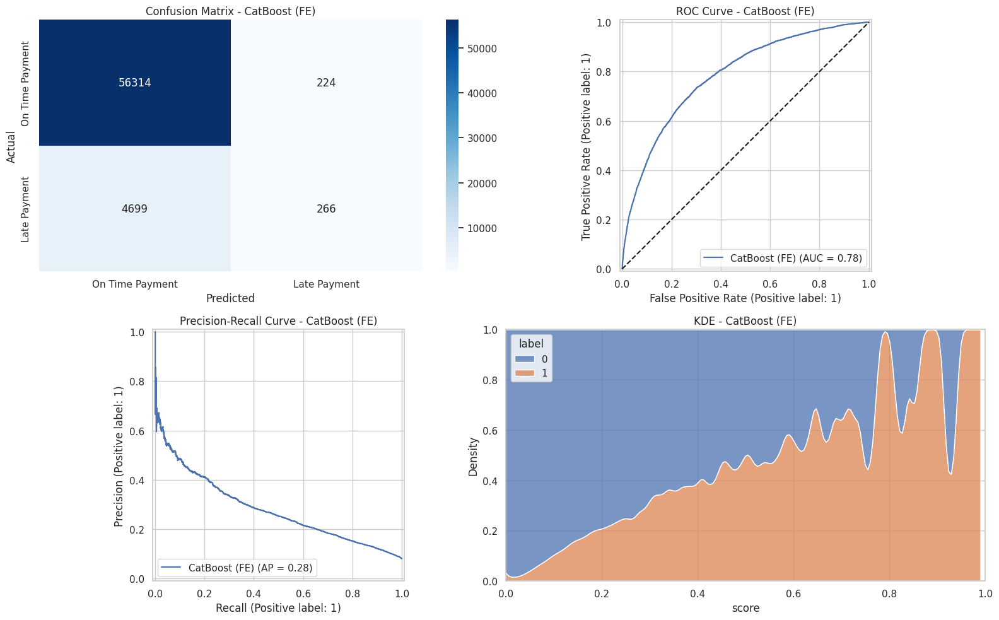

In [ ]:
#CatBoost
model_cb = CatBoostClassifier(
    loss_function="Logloss",
    eval_metric="AUC",
    random_seed=42,
    verbose=False
)
model_cb.fit(X_train_tf, y_train)

# Evaluate with full metrics
cb_results = evaluate_model(model_cb, X_val_tf, y_val, "CatBoost (FE)")

[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.081838 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 30084
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 328
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432482
[LightGBM] [Info] Start training from score -2.432482


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



--- LightGBM (FE) Results ---
Accuracy: 0.9202
Balanced Accuracy: 0.5179
Precision: 0.5943
Recall/Sensitivity: 0.0381
F1 Score: 0.0716
Matthews Correlation Coefficient: 0.1359
ROC AUC: 0.7789
Gini: 0.5579
PR AUC: 0.2775


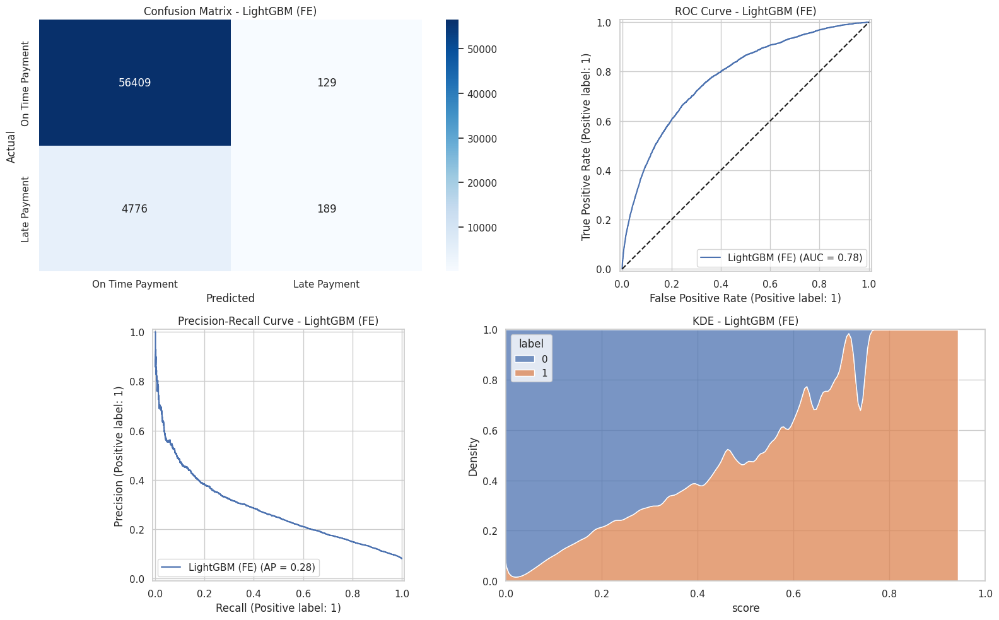

In [ ]:
#LGBM
model_lgb = LGBMClassifier(random_state=42)
model_lgb.fit(X_train_tf, y_train)

# Evaluate with full metrics
lgb_results = evaluate_model(model_lgb, X_val_tf, y_val, "LightGBM (FE)")


In [ ]:
# # --- Save CatBoost model ---
model_cb.save_model("catboost_model.cbm")

# # --- Save LightGBM model ---
import joblib
joblib.dump(model_lgb, "lightgbm_model.pkl")

print("Models saved successfully!")

Models saved successfully!


In [ ]:
# Load CatBoost
loaded_cb = CatBoostClassifier()
loaded_cb.load_model("catboost_model.cbm")

# Load LightGBM
loaded_lgb = joblib.load("lightgbm_model.pkl")

In [ ]:
model = loaded_lgb

## 5.3 Model Performance (Simple FE)

In [ ]:
# 1) Train your model on the fully preprocessed TRAIN
model.fit(X_train_tf, y_train)

# 2) Predict probabilities for Kaggle TEST
test_proba = model.predict_proba(X_test_tf)[:, 1]

# 3) Write submission (exact col names, no index)
sub = pd.DataFrame({
    "SK_ID_CURR": test_all["SK_ID_CURR"].astype(np.int64),  # keep original order
    "TARGET": test_proba
})
sub.to_csv("submission_lgb.csv", index=False)

[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 30070
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 331
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432486
[LightGBM] [Info] Start training from score -2.432486


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


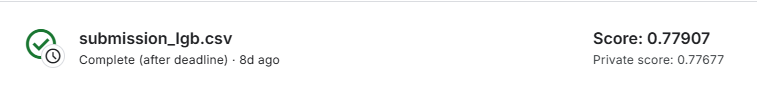

In [ ]:
model = loaded_cb

In [ ]:
# 1) Train model on the fully preprocessed TRAIN
model.fit(X_train_tf, y_train)

# 2) Predict probabilities for Kaggle TEST
test_proba = model.predict_proba(X_test_tf)[:, 1]

# 3) Write submission (exact col names, no index)
sub = pd.DataFrame({
    "SK_ID_CURR": test_all["SK_ID_CURR"].astype(np.int64),  # keep original order
    "TARGET": test_proba
})
sub.to_csv("submission.csv", index=False)

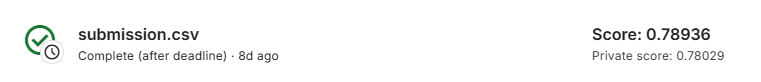

Choose LGBM for further optimization because it trains faster than CatBoost

# **Improve model with heavier Feature Engineering and Hyperparameter Tuning**

# 6. Heavy Feature Engineering

In [ ]:
def fe_installments_heavy(
    installments,
    windows=(('all', None), ('1y', -365), ('6m', -182), ('3m', -90), ('1m', -30))
):
    t = installments.copy()
    t['AMT_PAYMENT']    = t['AMT_PAYMENT'].fillna(0.0)
    t['AMT_INSTALMENT'] = t['AMT_INSTALMENT'].fillna(0.0)
    t['DAYS_ENTRY_PAYMENT'] = t['DAYS_ENTRY_PAYMENT'].fillna(np.nan)

    # New signals
    t['PAY_DIFF']   = t['AMT_PAYMENT'] - t['AMT_INSTALMENT']
    t['PAY_RATIO']  = safe_div(t['AMT_PAYMENT'], t['AMT_INSTALMENT'])
    t['DPD']        = (t['DAYS_ENTRY_PAYMENT'] - t['DAYS_INSTALMENT']).clip(lower=0)
    t['LATE_30']    = (t['DPD'] >= 30).astype(int)
    t['LATE_60']    = (t['DPD'] >= 60).astype(int)
    t['LATE_90']    = (t['DPD'] >= 90).astype(int)
    t['UNDERPAY']   = (t['PAY_RATIO'] < 0.98).astype(int)
    t['OVERPAY']    = (t['PAY_RATIO'] > 1.05).astype(int)
    t['ONTIME_FULL']= ((t['DPD'] == 0) & (t['PAY_RATIO'] >= 0.98)).astype(int)

    def _agg_one_window(dfw, suf):
        g = dfw.groupby('SK_ID_CURR').agg(
            PCT_LATE_30=('LATE_30','mean'),
            PCT_LATE_60=('LATE_60','mean'),
            PCT_LATE_90=('LATE_90','mean'),
            PCT_UNDERPAY=('UNDERPAY','mean'),
            PCT_OVERPAY=('OVERPAY','mean'),
            PCT_ONTIME_FULL=('ONTIME_FULL','mean'),
            PAY_DIFF_MEAN=('PAY_DIFF','mean'),
            PAY_DIFF_MAX=('PAY_DIFF','max'),
            AMT_PAYMENT_SUM=('AMT_PAYMENT','sum'),
            AMT_INSTALMENT_SUM=('AMT_INSTALMENT','sum')
        )
        # Add ratio: total paid / total due
        g[f'INS_PAYMENT_COVERAGE_{suf}'] = safe_div(
            g['AMT_PAYMENT_SUM'], g['AMT_INSTALMENT_SUM']
        )
        # Drop temporary sums
        g = g.drop(columns=['AMT_PAYMENT_SUM','AMT_INSTALMENT_SUM'])
        # Rename other columns
        g.columns = [f'INS_{c}_{suf}' if not c.startswith('INS_PAYMENT_COVERAGE') else c
                     for c in g.columns]
        return g

    outs = []
    for suf, min_days in windows:
        dfw = t if min_days is None else t[t['DAYS_INSTALMENT'] >= min_days]
        if not dfw.empty:
            outs.append(_agg_one_window(dfw, suf))

    return pd.concat(outs, axis=1).reset_index()

In [ ]:
def fe_previous_heavy(prev):
    t = prev.copy()
    t['APP_CREDIT_DIFF']   = t['AMT_APPLICATION'] - t['AMT_CREDIT']
    t['APP_CREDIT_RATIO']  = safe_div(t['AMT_APPLICATION'], t['AMT_CREDIT'])
    t['CREDIT_ANNUITY_RATIO'] = safe_div(t['AMT_CREDIT'], t['AMT_ANNUITY'])
    t['DOWNPAYMENT_RATIO'] = safe_div(t['AMT_DOWN_PAYMENT'], t['AMT_CREDIT'])

    num_agg = t.groupby('SK_ID_CURR').agg({
        'APP_CREDIT_DIFF':['mean','max','min'],
        'APP_CREDIT_RATIO':['mean'],
        'CREDIT_ANNUITY_RATIO':['mean'],
        'DOWNPAYMENT_RATIO':['mean']
    })
    num_agg.columns = [f'PREV_{c[0]}_{c[1]}' for c in num_agg.columns]

    approved = t[t['NAME_CONTRACT_STATUS']=='Approved']
    if not approved.empty:
        app_agg = approved.groupby('SK_ID_CURR')['AMT_CREDIT'].agg(['mean','max'])
        app_agg.columns = ['PREV_APPROVED_CREDIT_MEAN','PREV_APPROVED_CREDIT_MAX']
        num_agg = num_agg.join(app_agg, how='left')

    refused = t[t['NAME_CONTRACT_STATUS']=='Refused']
    if not refused.empty:
        ref_agg = refused.groupby('SK_ID_CURR')['AMT_CREDIT'].agg(['mean','max'])
        ref_agg.columns = ['PREV_REFUSED_CREDIT_MEAN','PREV_REFUSED_CREDIT_MAX']
        num_agg = num_agg.join(ref_agg, how='left')

    return num_agg.reset_index()

In [ ]:
def fe_pos_heavy(pos):
    t = pos.copy()
    t['LATE_FLAG'] = (t['SK_DPD'] > 0).astype(int)

    num_agg = t.groupby('SK_ID_CURR').agg({
        'CNT_INSTALMENT':['max','mean'],
        'CNT_INSTALMENT_FUTURE':['max','mean','min'],
        'SK_DPD_DEF':['mean','max'],
        'LATE_FLAG':['mean']
    })
    num_agg.columns = [f'POS_{c[0]}_{c[1]}' for c in num_agg.columns]

    return num_agg.reset_index()

In [ ]:
def fe_credit_heavy(cc):
    t = cc.copy()
    t['UTILIZATION'] = safe_div(t['AMT_BALANCE'], t['AMT_CREDIT_LIMIT_ACTUAL'])
    t['PAYMENT_MIN_RATIO'] = safe_div(t['AMT_PAYMENT_CURRENT'], t['AMT_INST_MIN_REGULARITY'])
    t['DRAWING_LIMIT_RATIO'] = safe_div(t['AMT_DRAWINGS_ATM_CURRENT'], t['AMT_CREDIT_LIMIT_ACTUAL'])
    t['LATE_FLAG'] = (t['SK_DPD'] > 0).astype(int)

    num_agg = t.groupby('SK_ID_CURR').agg({
        'AMT_DRAWINGS_ATM_CURRENT':['mean','max'],
        'AMT_PAYMENT_CURRENT':['mean','max'],
        'PAYMENT_MIN_RATIO':['mean'],
        'DRAWING_LIMIT_RATIO':['mean'],
        'LATE_FLAG':['mean']
    })
    num_agg.columns = [f'CC_{c[0]}_{c[1]}' for c in num_agg.columns]

    return num_agg.reset_index()

In [ ]:
def fe_bureau_windowed(
    bureau,
    bureau_balance,
    # windows on DAYS_CREDIT (days relative to app; negative = past)
    credit_windows=(('all', None), ('2y', -730), ('1y', -365), ('6m', -182), ('3m', -90)),
    # windows on MONTHS_BALANCE (months relative to now; negative = past, 0=current)
    bb_windows=(('all', None), ('12m', -12), ('6m', -6), ('3m', -3), ('1m', -1))
):
    """
    Returns a single DataFrame with 1 row per SK_ID_CURR.
    Adds windowed aggregates from:
      - bureau (filtered by DAYS_CREDIT >= cutoff)
      - bureau_balance (filtered by MONTHS_BALANCE >= cutoff)
    Each group of features gets a suffix with window name.
    """

    b = bureau.copy()
    bb = bureau_balance.copy()

    # ---- Map bureau_balance STATUS to numeric delinquency (0=good; 1..5 worse; treat C/0 as 0; X as 0)
    if 'STATUS' in bb.columns:
        bb['STATUS_NUM'] = bb['STATUS'].map({'C':0,'0':0,'1':1,'2':2,'3':3,'4':4,'5':5}).fillna(0).astype(int)
        bb['LATE_MONTH'] = (bb['STATUS_NUM'] >= 1).astype(int)
    else:
        bb['STATUS_NUM'] = 0
        bb['LATE_MONTH'] = 0

    # ---- Useful engineered cols on bureau rows
    b['DEBT_RATIO']        = safe_div(b.get('AMT_CREDIT_SUM_DEBT', 0), b.get('AMT_CREDIT_SUM', 0))
    b['OVERDUE_RATIO']     = safe_div(b.get('AMT_CREDIT_SUM_OVERDUE', 0), b.get('AMT_CREDIT_SUM', 0))
    b['CREDIT_TO_ANNUITY'] = safe_div(b.get('AMT_CREDIT_SUM', 0), b.get('AMT_ANNUITY', 0))
    # credit duration approx: start (past, negative) to scheduled end (often future, positive)
    if {'DAYS_CREDIT','DAYS_CREDIT_ENDDATE'}.issubset(b.columns):
        b['CREDIT_DURATION'] = -b['DAYS_CREDIT'] + b['DAYS_CREDIT_ENDDATE']
    else:
        b['CREDIT_DURATION'] = np.nan

    # (optional) tidy up CREDIT_ACTIVE for status shares
    if 'CREDIT_ACTIVE' in b.columns:
        b['IS_ACTIVE'] = (b['CREDIT_ACTIVE'] == 'Active').astype(int)
        b['IS_CLOSED'] = (b['CREDIT_ACTIVE'] == 'Closed').astype(int)
    else:
        b['IS_ACTIVE'] = 0
        b['IS_CLOSED'] = 0

    # ---- Precompute a link from SK_ID_BUREAU to SK_ID_CURR for bb→client aggregation
    link = b[['SK_ID_BUREAU','SK_ID_CURR']].drop_duplicates()

    # ---- Per-window aggregator for BUREAU (by DAYS_CREDIT)
    def _agg_bureau_window(dfw, suf):
        # Aggregate per client
        g = dfw.groupby('SK_ID_CURR').agg(
            B_CNT=('SK_ID_BUREAU','count'),
            B_SUM_CREDIT=('AMT_CREDIT_SUM','sum'),
            B_MEAN_CREDIT=('AMT_CREDIT_SUM','mean'),
            B_SUM_DEBT=('AMT_CREDIT_SUM_DEBT','sum'),
            B_MEAN_DEBT=('AMT_CREDIT_SUM_DEBT','mean'),
            B_MAX_OVERDUE=('AMT_CREDIT_SUM_OVERDUE','max'),
            B_MEAN_OVERDUE=('AMT_CREDIT_SUM_OVERDUE','mean'),
            B_MEAN_DEBT_RATIO=('DEBT_RATIO','mean'),
            B_MEAN_OVERDUE_RATIO=('OVERDUE_RATIO','mean'),
            B_MEAN_CREDIT_TO_ANNUITY=('CREDIT_TO_ANNUITY','mean'),
            B_MEAN_DURATION=('CREDIT_DURATION','mean'),
            B_MAX_DURATION=('CREDIT_DURATION','max'),
            B_IS_ACTIVE_MEAN=('IS_ACTIVE','mean'),
            B_IS_CLOSED_MEAN=('IS_CLOSED','mean'),
            # timing context
            B_DAYS_CREDIT_MEAN=('DAYS_CREDIT','mean'),
            B_DAYS_CREDIT_MIN=('DAYS_CREDIT','min'),
            B_DAYS_CREDIT_MAX=('DAYS_CREDIT','max')
        )
        g.columns = [f'{c}_{suf}' for c in g.columns]
        return g

    # ---- Per-window aggregator for BUREAU_BALANCE (by MONTHS_BALANCE)
    def _agg_bb_window(bb_w, suf):
        if bb_w.empty:
            return pd.DataFrame()
        # bb grouped by bureau id
        bb_per_bureau = bb_w.groupby('SK_ID_BUREAU').agg(
            BB_MONTHS_CNT=('MONTHS_BALANCE','size'),
            BB_MONTHS_MIN=('MONTHS_BALANCE','min'),
            BB_MONTHS_MAX=('MONTHS_BALANCE','max'),
            BB_STATUS_MEAN=('STATUS_NUM','mean'),
            BB_STATUS_MAX=('STATUS_NUM','max'),
            BB_LATE_SHARE=('LATE_MONTH','mean')
        )
        # map to client
        bb_client = bb_per_bureau.join(link.set_index('SK_ID_BUREAU'), how='left')
        # aggregate per client
        g = bb_client.groupby('SK_ID_CURR').agg(
            BB_MONTHS_CNT_SUM=('BB_MONTHS_CNT','sum'),
            BB_STATUS_MEAN_MEAN=('BB_STATUS_MEAN','mean'),
            BB_STATUS_MAX_MAX=('BB_STATUS_MAX','max'),
            BB_LATE_SHARE_MEAN=('BB_LATE_SHARE','mean')
        )
        g.columns = [f'{c}_{suf}' for c in g.columns]
        return g

    # ---- Build all windows and merge side-by-side
    out_parts = []

    # Bureau windows by DAYS_CREDIT
    for suf, min_days in credit_windows:
        if min_days is None:
            bw = b
        else:
            # keep credits whose open date is within the last |min_days| days (>= min_days since negative)
            if 'DAYS_CREDIT' in b.columns:
                bw = b[b['DAYS_CREDIT'] >= min_days]
            else:
                bw = b.iloc[0:0]
        if not bw.empty:
            out_parts.append(_agg_bureau_window(bw, f'BUREAU_{suf}'))

    # Bureau Balance windows by MONTHS_BALANCE
    for suf, min_month in bb_windows:
        if min_month is None:
            bbw = bb
        else:
            # MONTHS_BALANCE is integer months; keep rows within recent window (>= min_month)
            bbw = bb[bb['MONTHS_BALANCE'] >= min_month]
        part = _agg_bb_window(bbw, f'BB_{suf}')
        if not part.empty:
            out_parts.append(part)

    # Merge all parts on SK_ID_CURR
    if not out_parts:
        return pd.DataFrame({'SK_ID_CURR': []})

    out = out_parts[0]
    for p in out_parts[1:]:
        out = out.join(p, how='outer')

    return out.reset_index()

## 6.1 Modeling & Evaluation (Heavy Engineered Features)

### 6.1.1 Preprocessing (Heavy FE)

In [ ]:
# Build heavy installments features once
inst_heavy = fe_installments_heavy(installments_payments)

# (train_all and test_all are current FE/aggregated bases)
train_all = train_all.merge(inst_heavy, on='SK_ID_CURR', how='left')
test_all  = test_all.merge(inst_heavy, on='SK_ID_CURR', how='left')

In [ ]:
# Build features
prev_heavy = fe_previous_heavy(previous_application)
pos_heavy  = fe_pos_heavy(POS_CASH_balance)
cc_heavy   = fe_credit_heavy(credit_card_balance)

# Merge into base tables
train_all = train_all.merge(prev_heavy, on='SK_ID_CURR', how='left')
train_all = train_all.merge(pos_heavy, on='SK_ID_CURR', how='left')
train_all = train_all.merge(cc_heavy, on='SK_ID_CURR', how='left')

test_all  = test_all.merge(prev_heavy, on='SK_ID_CURR', how='left')
test_all  = test_all.merge(pos_heavy, on='SK_ID_CURR', how='left')
test_all  = test_all.merge(cc_heavy, on='SK_ID_CURR', how='left')

In [ ]:
# Build windowed bureau features
bureau_win = fe_bureau_windowed(bureau, bureau_balance)

# Merge into FE base
train_all = train_all.merge(bureau_win, on='SK_ID_CURR', how='left')
test_all  = test_all.merge(bureau_win,  on='SK_ID_CURR', how='left')

In [ ]:
# Save engineered dataset (only features + ID)
test_all.to_parquet("test_all.parquet", index=False)

In [ ]:
# Rebuild feature lists (num/cat) and re-fit preprocessor + model
tar_col = 'TARGET'
X = train_all.drop(columns=[tar_col])
y = train_all[tar_col]

X = X.drop(columns =['SK_ID_CURR'])
num_features = X.select_dtypes(include=np.number).columns.tolist()
cat_features = X.select_dtypes(include=['object','category']).columns.tolist()

X_test  = test_all.copy()

In [ ]:
X

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,BB_STATUS_MAX_MAX_BB_6m,BB_LATE_SHARE_MEAN_BB_6m,BB_MONTHS_CNT_SUM_BB_3m,BB_STATUS_MEAN_MEAN_BB_3m,BB_STATUS_MAX_MAX_BB_3m,BB_LATE_SHARE_MEAN_BB_3m,BB_MONTHS_CNT_SUM_BB_1m,BB_STATUS_MEAN_MEAN_BB_1m,BB_STATUS_MAX_MAX_BB_1m,BB_LATE_SHARE_MEAN_BB_1m
0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,...,0.0,0.0,8.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
1,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307507,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307508,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,...,0.0,0.0,16.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0
307509,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,319500.0,Unaccompanied,...,0.0,0.0,4.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0


In [ ]:
# remove ID columns from features
id_cols = ['SK_ID_CURR']
num_features = [c for c in num_features if c not in id_cols]
cat_features = [c for c in cat_features if c not in id_cols]

In [ ]:
num_features

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXP

In [ ]:
cat_features

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler())
])

cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

preprocessor = ColumnTransformer([
    ('num', num_pipeline, num_features),
    ('cat', cat_pipeline, cat_features)
])

preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', RobustScaler())]),
                                 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL',
                                  'AMT_CREDIT', 'AMT_ANNUITY',
                                  'AMT_GOODS_PRICE',
                                  'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
                                  'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
                                  'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                                  'F...
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                  'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
                                  'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                                  'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                  'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
                                  'WEEKDAY_APPR_PROCESS_START',
                                  'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
                                  'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
                                  'EMERGENCYSTATE_MODE'])])

In [ ]:
preprocessor.fit(X_train)

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', RobustScaler())]),
                                 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL',
                                  'AMT_CREDIT', 'AMT_ANNUITY',
                                  'AMT_GOODS_PRICE',
                                  'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
                                  'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
                                  'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
                                  'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                                  'F...
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                  'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
                                  'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                                  'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                  'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
                                  'WEEKDAY_APPR_PROCESS_START',
                                  'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
                                  'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE',
                                  'EMERGENCYSTATE_MODE'])])

In [ ]:
# Save preprocessor
joblib.dump(preprocessor, "preprocessor.pkl")
print("✅ Preprocessor saved to preprocessor.pkl")

✅ Preprocessor saved to preprocessor.pkl


In [ ]:
# 2) Transform train & validation
X_train_tf = preprocessor.transform(X_train)
X_val_tf  = preprocessor.transform(X_val)

# Transform the test set for later submission
X_test_tf  = preprocessor.transform(X_test)

# 7. Hyperparameter Optimization (Heavy FE)

## 7.1 RandomizedSearch/GridSearch on LightGBM (and/or CatBoost).

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from lightgbm import LGBMClassifier
import lightgbm as lgb

# Baseline model
lgb_base = lgb.LGBMClassifier(
    device="gpu",
    boosting_type="gbdt",
    objective="binary",
    metric="auc",
    n_estimators=2000,
    random_state=42,
    n_jobs=1
)

# Param grid (small & interpretable)
param_dist = {
    "num_leaves": [31, 63, 127],
    "max_depth": [-1, 6, 10],
    "learning_rate": [0.01, 0.05, 0.1],
    "subsample": [0.7, 0.9, 1.0],
    "colsample_bytree": [0.7, 0.9, 1.0],
    "reg_lambda": [0, 1, 5],
    "reg_alpha": [0, 1, 5]
}

# Run search
rs = RandomizedSearchCV(
    estimator=lgb_base,
    param_distributions=param_dist,
    n_iter=10,            # try 20 combos only
    scoring="roc_auc",
    cv=3,
    verbose=2,
    n_jobs=1,
    random_state=42
)

rs.fit(X_train_tf, y_train, eval_set=[(X_val, y_val)],
       eval_metric="auc",
       callbacks=[lgb.early_stopping(100, verbose=False)])

print("Best params:", rs.best_params_)
print("Best CV AUC:", rs.best_score_)

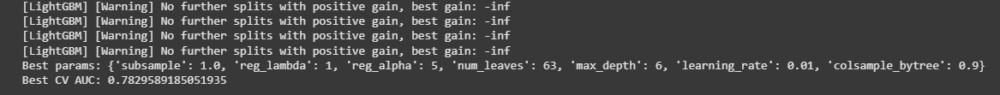

This was screen capped at the end of the Random Search result, showing the best parameter for the basic feature engineered data, not the heavy feature engineered data

In [ ]:
import json

with open("best_lgbm_params.json", "w") as f:
    json.dump(rs.best_params_, f)

print("✅ Saved best params to best_lgbm_params.json")

In [ ]:
import json

with open("best_lgbm_params.json", "r") as f:
    best_params = json.load(f)

best_params

{'subsample': 1.0,
 'reg_lambda': 1,
 'reg_alpha': 5,
 'num_leaves': 63,
 'max_depth': 6,
 'learning_rate': 0.01,
 'colsample_bytree': 0.9}

## 7.2 Cross-validation results

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import numpy as np

# KS statistic
def ks_statistic(y_true, y_pred_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)
    return np.max(tpr - fpr)

# PSI (Population Stability Index)
def calculate_psi(expected, actual, bins=10):
    expected_perc, bin_edges = np.histogram(expected, bins=bins)
    actual_perc, _ = np.histogram(actual, bins=bin_edges)

    expected_perc = expected_perc / len(expected)
    actual_perc   = actual_perc / len(actual)

    # Avoid divide-by-zero
    expected_perc = np.where(expected_perc == 0, 0.0001, expected_perc)
    actual_perc   = np.where(actual_perc == 0, 0.0001, actual_perc)

    psi = np.sum((expected_perc - actual_perc) * np.log(expected_perc / actual_perc))
    return psi

In [ ]:
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

cv_auc, cv_ks, cv_psi = [], [], []
fold_models = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train_tf, y_train)):
    print(f"\n===== Fold {fold+1}/5 =====")

    X_tr, X_val = X_train_tf[train_idx], X_train_tf[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    model = lgb.LGBMClassifier(
        device="gpu",
        boosting_type="gbdt",
        objective="binary",
        metric="auc",
        n_estimators=5000,
        random_state=42 + fold,
        n_jobs=1,
        **best_params
    )

    model.fit(
        X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        eval_metric="auc",
        callbacks=[lgb.early_stopping(200, verbose=False)]
    )

    # Predictions
    y_val_pred = model.predict_proba(X_val)[:, 1]
    y_tr_pred  = model.predict_proba(X_tr)[:, 1]

    # Metrics
    auc = roc_auc_score(y_val, y_val_pred)
    ks  = ks_statistic(y_val, y_val_pred)
    psi = calculate_psi(y_tr_pred, y_val_pred)

    cv_auc.append(auc)
    cv_ks.append(ks)
    cv_psi.append(psi)

    fold_models.append(model)

    print(f"Fold {fold+1} ROC AUC: {auc:.4f} | KS: {ks:.4f} | PSI: {psi:.4f}")


===== Fold 1/5 =====
[LightGBM] [Info] Number of positive: 15888, number of negative: 180918
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 62374
[LightGBM] [Info] Number of data points in the train set: 196806, number of used features: 497
[LightGBM] [Info] Using GPU Device: NVIDIA L4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 158 dense feature groups (30.03 MB) transferred to GPU in 0.059448 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432480
[LightGBM] [Info] Start training from score -2.432480
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Fold 1 ROC AUC: 0.7860 | KS: 0.4261 | PSI: 0.0024

===== Fold 2/5 =====
[LightGBM] [Info] Number of positive: 15888, number of negative: 180918
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 62334
[LightGBM] [Info] Number of data points in the train set: 196806, number of used features: 497
[LightGBM] [Info] Using GPU Device: NVIDIA L4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 158 dense feature groups (30.03 MB) transferred to GPU in 0.060055 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432480
[LightGBM] [Info] Start training from score -2.432480
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Fold 2 ROC AUC: 0.7890 | KS: 0.4392 | PSI: 0.0027

===== Fold 3/5 =====
[LightGBM] [Info] Number of positive: 15888, number of negative: 180918
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 62457
[LightGBM] [Info] Number of data points in the train set: 196806, number of used features: 498
[LightGBM] [Info] Using GPU Device: NVIDIA L4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 158 dense feature groups (30.03 MB) transferred to GPU in 0.059352 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432480
[LightGBM] [Info] Start training from score -2.432480
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Fold 3 ROC AUC: 0.7886 | KS: 0.4414 | PSI: 0.0019

===== Fold 4/5 =====
[LightGBM] [Info] Number of positive: 15888, number of negative: 180919
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 62378
[LightGBM] [Info] Number of data points in the train set: 196807, number of used features: 497
[LightGBM] [Info] Using GPU Device: NVIDIA L4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 158 dense feature groups (30.03 MB) transferred to GPU in 0.059486 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432485
[LightGBM] [Info] Start training from score -2.432485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Fold 4 ROC AUC: 0.7913 | KS: 0.4429 | PSI: 0.0027

===== Fold 5/5 =====
[LightGBM] [Info] Number of positive: 15888, number of negative: 180919
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 62342
[LightGBM] [Info] Number of data points in the train set: 196807, number of used features: 497
[LightGBM] [Info] Using GPU Device: NVIDIA L4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 158 dense feature groups (30.03 MB) transferred to GPU in 0.059329 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432485
[LightGBM] [Info] Start training from score -2.432485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Fold 5 ROC AUC: 0.7879 | KS: 0.4367 | PSI: 0.0024


In [ ]:
import joblib
joblib.dump(fold_models, "lgbm_cv_models.pkl")

['lgbm_cv_models.pkl']

In [ ]:
fold_models = joblib.load("lgbm_cv_models.pkl")

In [ ]:
# Final summary
print("\n=== Final Model Cross-Validation Results ===")
print(f"Mean AUC: {np.mean(cv_auc):.4f} ± {np.std(cv_auc):.4f}")
print(f"Mean KS:  {np.mean(cv_ks):.4f} ± {np.std(cv_ks):.4f}")
print(f"Mean PSI: {np.mean(cv_psi):.4f} ± {np.std(cv_psi):.4f}")


=== Final Model Cross-Validation Results ===
Mean AUC: 0.7886 ± 0.0017
Mean KS:  0.4373 ± 0.0060
Mean PSI: 0.0024 ± 0.0003


# Train Final Model

In [ ]:
from lightgbm import LGBMClassifier

# Train on ALL training data
final_model = LGBMClassifier(
    device="gpu",
    boosting_type="gbdt",
    objective="binary",
    metric="auc",
    n_estimators=5000,
    random_state=42,
    n_jobs=-1,
    **best_params
)

final_model.fit(X_train_tf, y_train)

[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 62385
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 499
[LightGBM] [Info] Using GPU Device: NVIDIA L4, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 158 dense feature groups (37.54 MB) transferred to GPU in 0.023742 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432482
[LightGBM] [Info] Start training from score -2.432482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

LGBMClassifier(colsample_bytree=0.9, device='gpu', learning_rate=0.01,
               max_depth=6, metric='auc', n_estimators=5000, n_jobs=-1,
               num_leaves=63, objective='binary', random_state=42, reg_alpha=5,
               reg_lambda=1)

## 7.3 Re-evaluate best model

In [ ]:
joblib.dump(final_model, "lightgbm_randomsearch_heavy_4.pkl")
print("✅ Model saved to lightgbm_randomsearch4.pkl")

✅ Model saved to lightgbm_randomsearch4.pkl


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



--- LightGBM (Optimized) Results ---
Accuracy: 0.9201
Balanced Accuracy: 0.5271
Precision: 0.5492
Recall/Sensitivity: 0.0584
F1 Score: 0.1056
Matthews Correlation Coefficient: 0.1600
ROC AUC: 0.7913
Gini: 0.5827
PR AUC: 0.2923


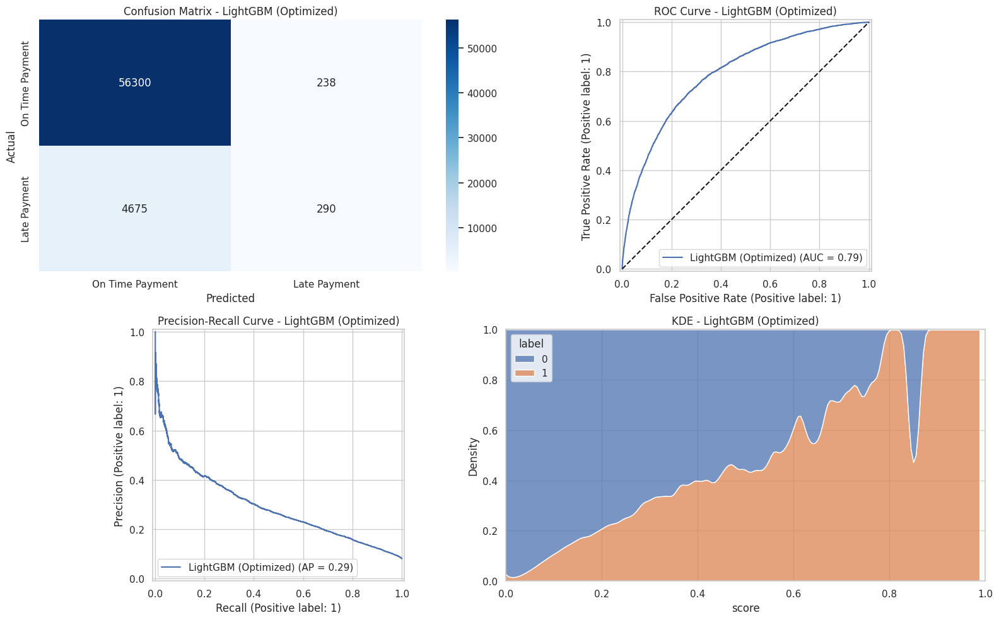

In [ ]:
final_lgbm_results = evaluate_model(final_model, X_val_tf, y_val, "LightGBM (Optimized)")

In [ ]:
# Predict probabilities on Kaggle test
test_proba = final_model.predict_proba(X_test_tf)[:, 1]

# Create submission DataFrame
submission = pd.DataFrame({
    "SK_ID_CURR": test_all["SK_ID_CURR"].astype(np.int64),
    "TARGET": test_proba
})

# Save to CSV
submission.to_csv("submission_lgbm_heavy_random3.csv", index=False)
print("✅ Submission saved to submission_final.csv")

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


✅ Submission saved to submission_final.csv


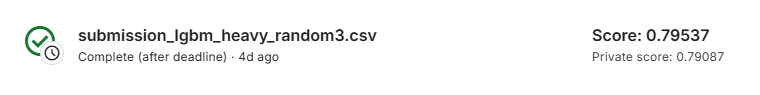

# 8. Results Comparison

In [ ]:
print("\n=== LightGBM Comparison (Baseline vs Optimized) ===")

comparison_data = {
    'Metric': ['Gini', 'ROC_AUC', 'Recall', 'Precision', 'F1'],
    'Baseline LGBM (FE)': [
        lgb_results['gini'],
        lgb_results['roc_auc'],
        lgb_results['recall'],
        lgb_results['precision'],
        lgb_results['f1']
    ],
    'Optimized LGBM (Heavy FE)': [
        final_lgbm_results['gini'],
        final_lgbm_results['roc_auc'],
        final_lgbm_results['recall'],
        final_lgbm_results['precision'],
        final_lgbm_results['f1']
    ]
}

comparison_df = pd.DataFrame(comparison_data)
print(comparison_df.round(4))

# Improvement calculations
gini_improvement = final_lgbm_results['gini'] - lgb_results['gini']
roc_auc_improvement = final_lgbm_results['roc_auc'] - lgb_results['roc_auc']

print(f"\nGini Improvement: {gini_improvement:.4f} "
      f"({(gini_improvement / lgb_results['gini'] * 100):.2f}%)")
print(f"ROC AUC Improvement: {roc_auc_improvement:.4f} "
      f"({(roc_auc_improvement / lgb_results['roc_auc'] * 100):.2f}%)")


=== LightGBM Comparison (Baseline vs Optimized) ===
      Metric  Baseline LGBM (FE)  Optimized LGBM (Heavy FE)
0       Gini              0.5571                     0.8332
1    ROC_AUC              0.7785                     0.9166
2     Recall              0.0356                     0.1627
3  Precision              0.5584                     0.9330
4         F1              0.0670                     0.2771

Gini Improvement: 0.2761 (49.56%)
ROC AUC Improvement: 0.1381 (17.73%)


=> Use the optimized LGBM Model